# To make my life a bit easier...

In [1]:
def plot_sed(x, y, yerr):
    plt.clf()
    plt.errorbar(wavelength, flux, yerr=flux_err, c='red', ecolor='gray', capthick=2)
    plt.show()

In [2]:
def print_time(begin_time, end_time):
    """ 
    This function prints the time in minutes that a certain task took.
    """
    print ("--------------------------------------------------")
    print ("CPU process time: %.2f [min]" % np.round(float((end_time-start_time)/60)))
    print ("--------------------------------------------------")

In [3]:
plotpars = {'axes.labelsize': 18,
            'axes.linewidth': 1.,
            'figure.figsize': (7.,5.),
            'font.size': 12,
            'legend.frameon': True,
            'legend.framealpha': 0.85,
            'legend.edgecolor': 'black',
            'legend.loc': 'best',
            'legend.fontsize': 12,
            'mathtext.fontset': 'stixsans',
            'savefig.bbox': 'tight',
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
           }

# Packages

### General packages

In [4]:
import numpy             as np
import pandas            as pd
import matplotlib.pyplot as plt
import seaborn           as sns
import astropy.io.fits   as pf
import astropy.constants as ct
import os
import time
import scipy.interpolate as sci
import ipywidgets        as widgets

### pPXF imports

In [5]:
import ppxf.miles_util   as lib  # MILES library embedded in ppxf
import ppxf.ppxf_util    as util
import ppxf              as ppxf_module
from ppxf.ppxf           import ppxf
from ppxf.ppxf_util      import log_rebin

# Config. inputs

### Paths and files

In [6]:
seds_path    = '../../../../GAMADR3_SPECTRA/DATABASE/'
ppxf_dir     = os.path.dirname(os.path.realpath(ppxf_module.__file__))
miles_lib    = ppxf_dir+'/miles_models/Mun1.30*.fits'

In [7]:
data          = pd.read_csv('uv_redseq_psmed_oneneighbor_magphys.csv')

In [8]:
seds_list = []
for i in data['SPECID']: seds_list.append(i+'.fit')

### Constants

In [9]:
light_speed = float(str(ct.c.to('km/s')).split(' ')[0])            # selecting the numerical values 
                                                                   # (must be in km/s)
gama_resol  = 1300.

# Plot parameters (because I'm lazy)

In [10]:
plotpars = {'axes.linewidth': 1.,
            'axes.labelsize': 18,
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
            'legend.framealpha': 0.6,
            'legend.loc': 'upper right',
            'legend.fontsize': 12,
            }

In [11]:
palette      = ['#ef8a62','#f7f7f7','#67a9cf']
transparency = 0.8
lw           = 2.

# Spectral fitting

## Configuring inputs

### pPXF "fixed" parameters

In [12]:
# Fit (V, sig, h3, h4) moments=4 for the stars; (V, sig) moments=2 for the two gas kinematic components
moments        = [4, 2, 2]
# degree         = -1       # Additive Legendre polynomial degrees -- for stellar pops
degree         = 15         # Additive Legendre polynomial degrees -- for kinematics
mdegree        = 0          # Multiplicative Legendre polynomial degrees
regul_err      = 0.01     # Desired regularization error -- TODO: MUST CHECK WHY 0.013
tied_balmer    = True
limit_doublets = False
stellar_comp_w = [0]        # weight of the stellar component
balmer_comp_w  = [1]        # weight of the balmer emission lines
forbid_comp_w  = [2]        # weight of the forbidden lines
wl_min         = 3540       # MILES RANGE MIN
# wl_max         = 6750       # MILES RANGE MAX: 7409
# wl_min = 4350               # removing the bluest part of the spectra in order to mitigate noise effects
wl_max = 7409

In [13]:
new_path = 'd'+str(degree)+'m'+str(mdegree)

In [14]:
results_path = '../../LargeFilesResults/PSM_analysis/'+ new_path

#### Checking if the directory exists and, if not, creating it!

In [15]:
if not os.path.exists(results_path): os.makedirs(results_path)

### pPXF loop

In [16]:
bar = widgets.IntProgress(value=0, min=0, max=len(seds_list)+1, step=0.5, description='Running pPXF:',
                          orientation='horizontal')
display(bar)

IntProgress(value=0, description='Running pPXF:', max=139)

In [17]:
mean_age   = []
mean_metal = []
mass2light = []
ids        = []
redshifts  = []
vel_disp   = []

In [18]:
outputs_physical_header = ['CATAID', 'VEL_DISP', 'CHI2', 'VELOCITY', '<logAge>', '<[M/H]>', 'MASS2LIGHT_R', 
                           'SN(runz)']
outputs_physical = []

In [19]:
plt.rcParams.update(plotpars)

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47348         1     0.000     0.002
 comp.  1:     47948      1000
 comp.  2:     47458       790
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0152
method = capfit; Jac calls: 10; Func calls: 107; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.932       9.1   47948  1000
Comp:  2       Unknown          0        42   47458   790
Comp:  2       Unknown          0        42   47458   790
Comp:  2       Unknown      1.004       6.4   47458   790
Comp:  2       Unknown      2.626       4.3   47458   790
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.24
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.24
M/L_r: 0.1573
Current $\chi^2$: 0.0152
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


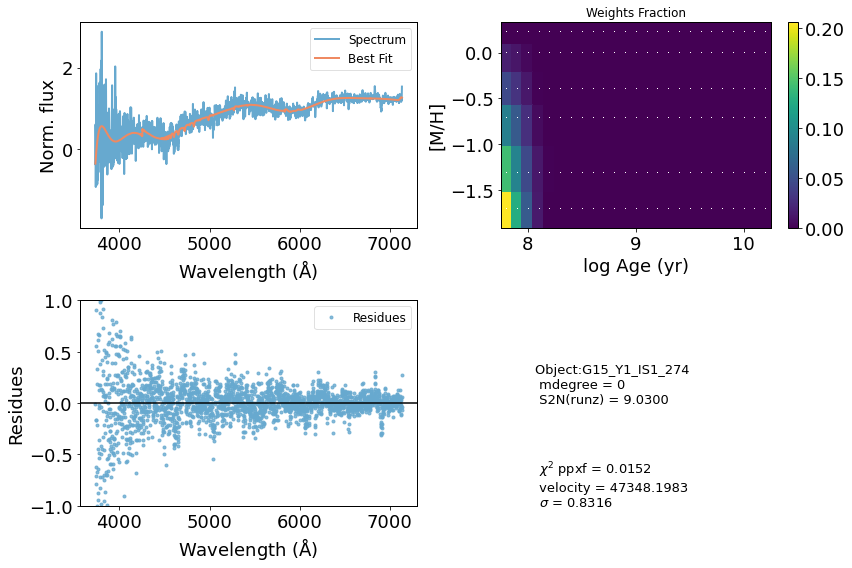

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43948         1    -0.000    -0.000
 comp.  1:     44233       513
 comp.  2:     44011       349
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007348
method = capfit; Jac calls: 7; Func calls: 78; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       3.71         9   44233   513
Comp:  2       Unknown          0        12   44011   349
Comp:  2       Unknown          0        12   44011   349
Comp:  2       Unknown     0.5642       4.7   44011   349
Comp:  2       Unknown     0.8087       3.5   44011   349
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.22
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.22
M/L_r: 0.1572
Current $\chi^2$: 0.0073
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


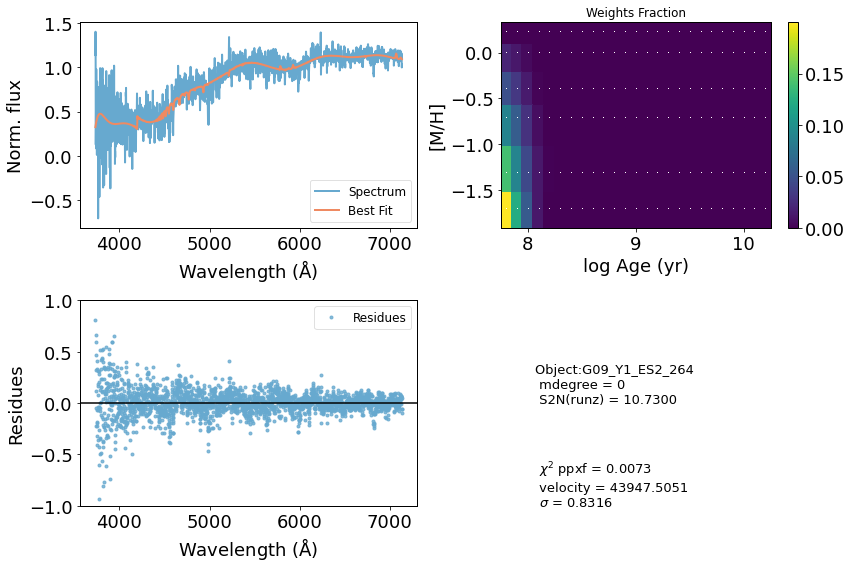

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40061      1000     0.015    -0.035
 comp.  1:     38061       180
 comp.  2:     38128        31
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008518
method = capfit; Jac calls: 7; Func calls: 76; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  20 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.2   38061   180
Comp:  2       Unknown      0.639       3.5   38128    31
Comp:  2       Unknown          0       3.3   38128    31
Comp:  2       Unknown    0.02762       2.1   38128    31
Comp:  2       Unknown          0       1.1   38128    31
---------------------------------------------------------
Weighted <logAge> [yr]: 7.92
Weighted <[M/H]>: -0.336
Weighted <logAge> [yr]: 7.92
Weighted <[M/H]>: -0.336


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


M/L_r: 0.1732
Current $\chi^2$: 0.0085
Elapsed time in PPXF: 0.60 [min]


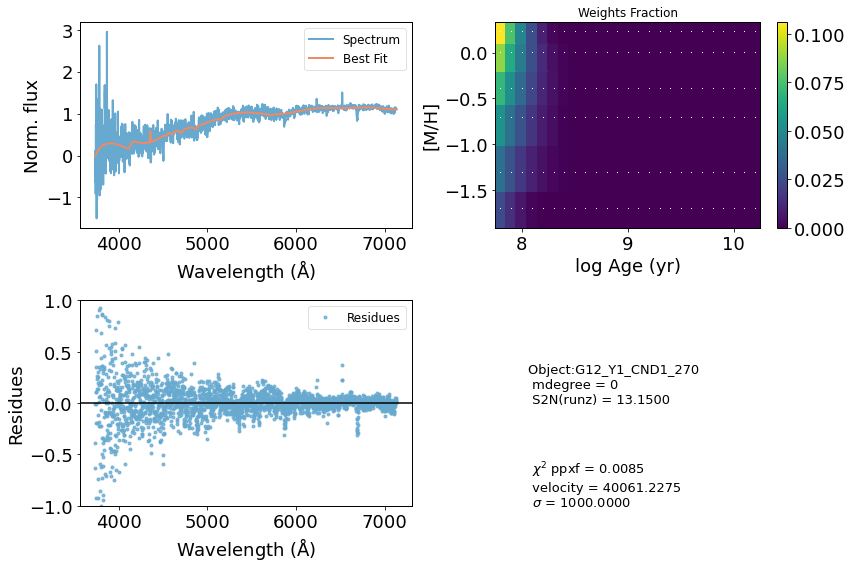

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38993         1    -0.001    -0.001
 comp.  1:     39011       232
 comp.  2:     39056       126
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01618
method = capfit; Jac calls: 5; Func calls: 55; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  52 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.213         4   39011   232
Comp:  2       Unknown          0       4.9   39056   126
Comp:  2       Unknown          0         5   39056   126
Comp:  2       Unknown          0         3   39056   126
Comp:  2       Unknown      0.137       1.8   39056   126
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.228
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.228
M/L_r: 1.956
Current $\chi^2$: 0.0162
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


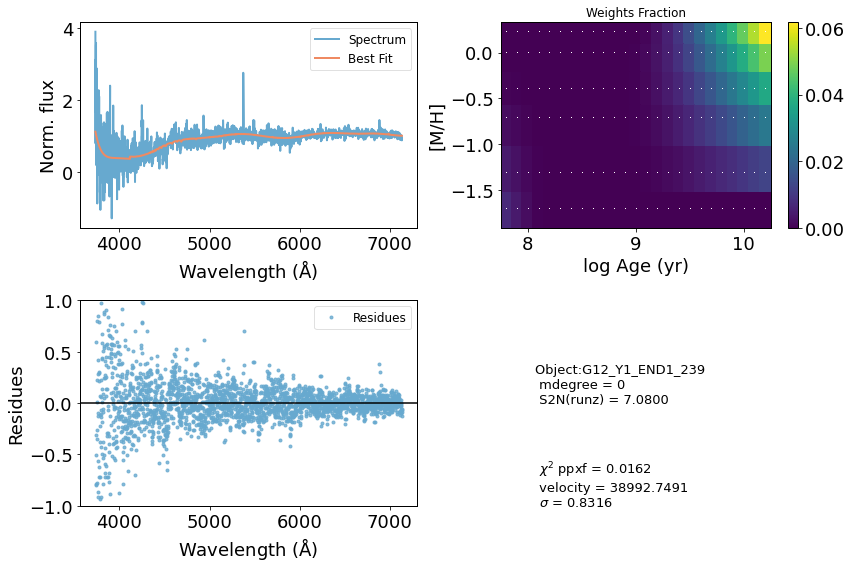

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     66973       180     0.000     0.000
 comp.  1:     66973       180
 comp.  2:     66973       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01315
method = capfit; Jac calls: 1; Func calls: 19; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9345       4.3   66973   180
Comp:  2       Unknown          0       4.8   66973   180
Comp:  2       Unknown          0       4.8   66973   180
Comp:  2       Unknown      0.358       2.9   66973   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.85
Weighted <[M/H]>: -1.38
Weighted <logAge> [yr]: 7.85
Weighted <[M/H]>: -1.38
M/L_r: 0.1633
Current $\chi^2$: 0.0131
Elapsed time in PPXF: 0.14 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


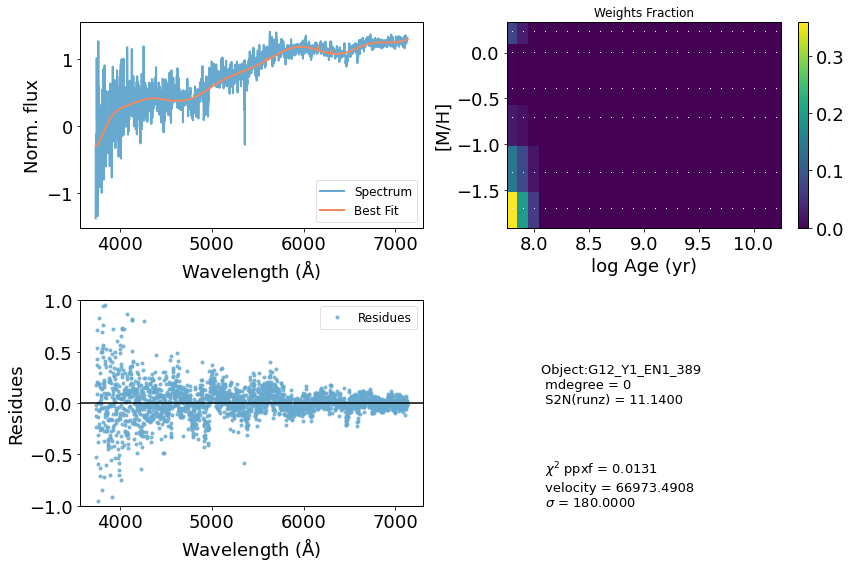

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35011         1    -0.001     0.003
 comp.  1:     33773      1000
 comp.  2:     34484       142
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02589
method = capfit; Jac calls: 12; Func calls: 125; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.357         7   33773  1000
Comp:  2       Unknown          0       5.9   34484   142
Comp:  2       Unknown          0       5.9   34484   142
Comp:  2       Unknown     0.2913       3.4   34484   142
Comp:  2       Unknown      1.058       1.8   34484   142
Comp:  2       Unknown     0.3314       1.7   34484   142
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.38
Weighted <logAge> [yr]: 7.87
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


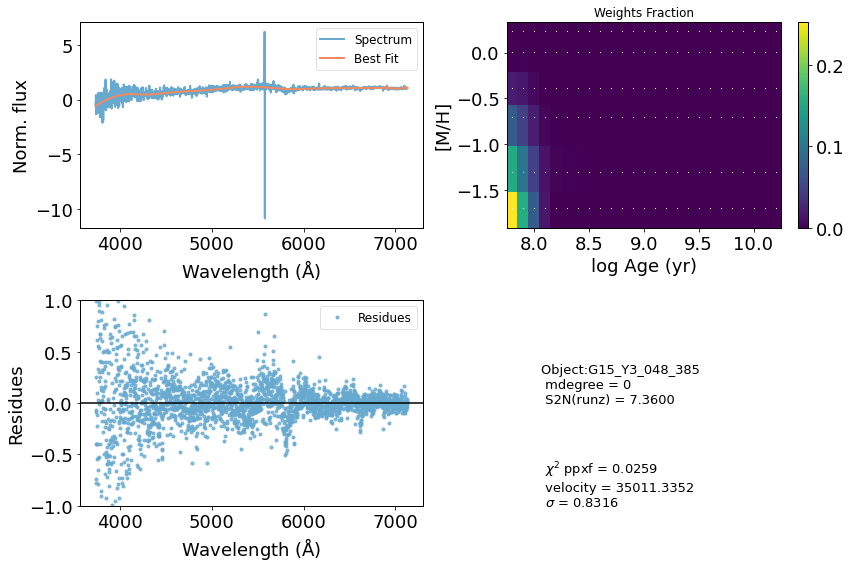

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     57731         1    -0.012     0.013
 comp.  1:     58185      1000
 comp.  2:     58882       228
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01946
method = capfit; Jac calls: 12; Func calls: 126; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  32 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.433        11   58185  1000
Comp:  2       Unknown     0.3922       7.1   58882   228
Comp:  2       Unknown      0.367       7.1   58882   228
Comp:  2       Unknown      0.588       3.1   58882   228
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.181
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.181
M/L_r: 1.692
Current $\chi^2$: 0.0195
Elapsed time in PPXF: 1.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


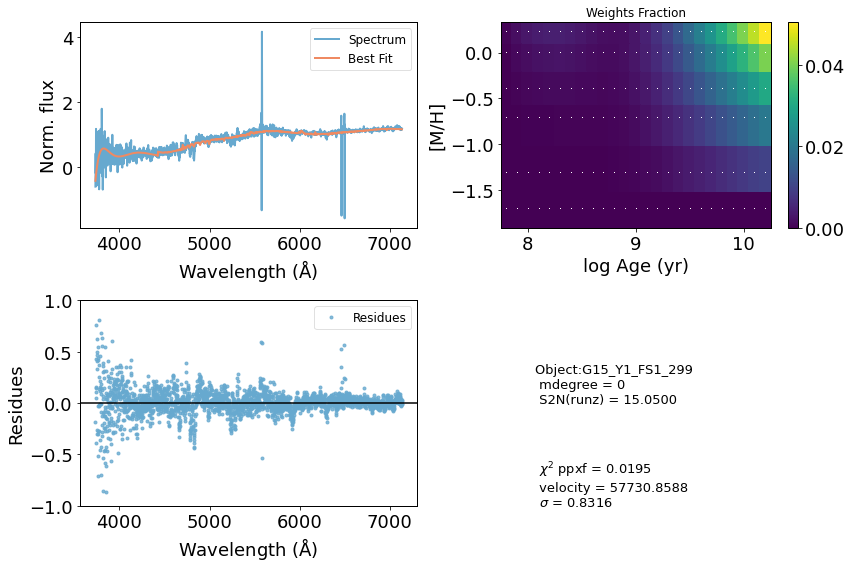

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49584       180     0.000     0.000
 comp.  1:     49584       180
 comp.  2:     49584       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03342
method = capfit; Jac calls: 1; Func calls: 19; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  50 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4819       3.6   49584   180
Comp:  2       Unknown     0.5862       6.1   49584   180
Comp:  2       Unknown      1.033       6.1   49584   180
Comp:  2       Unknown          0       2.5   49584   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.194
M/L_r: 3.226
Current $\chi^2$: 0.0334
Elapsed time in PPXF: 0.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


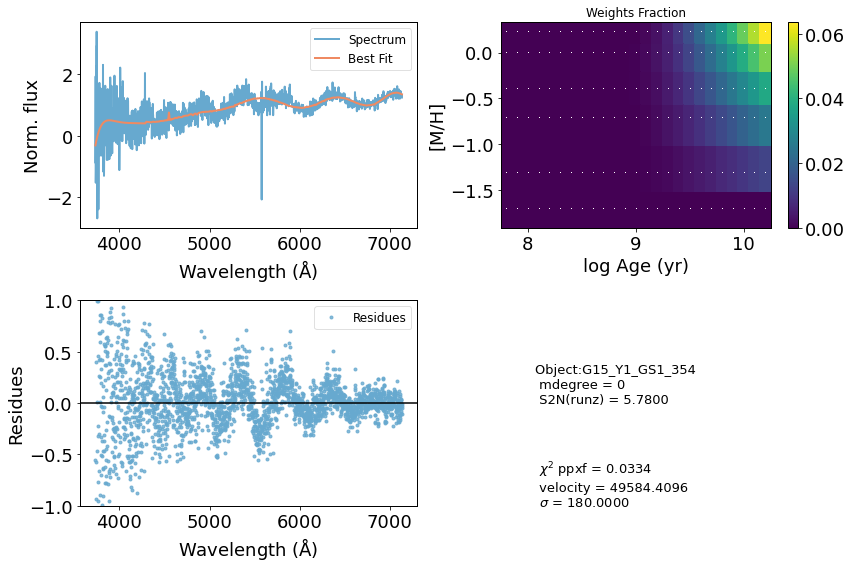

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50927      1000    -0.061     0.037
 comp.  1:     52014      1000
 comp.  2:     51986       259
Gas Reddening E(B-V): 1.534
chi2/DOF: 0.2983
method = capfit; Jac calls: 12; Func calls: 125; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      21.63       2.4   52014  1000
Comp:  2       Unknown       15.6        18   51986   259
Comp:  2       Unknown      4.238        18   51986   259
Comp:  2       Unknown          0       2.2   51986   259
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.273
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.273
M/L_r: 2.141
Current $\chi^2$: 0.2983
Elapsed time in PPXF: 1.35 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


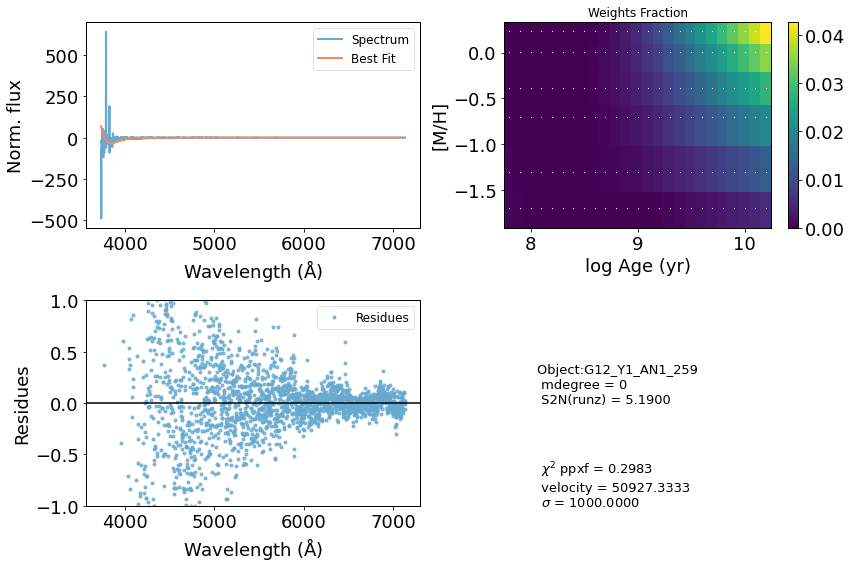

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45252         1    -0.001     0.000
 comp.  1:     46270      1000
 comp.  2:     43906      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005998
method = capfit; Jac calls: 15; Func calls: 156; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.702        10   46270  1000
Comp:  2       Unknown          0        64   43906  1000
Comp:  2       Unknown          0        63   43906  1000
Comp:  2       Unknown      3.099       8.2   43906  1000
Comp:  2       Unknown      1.317       5.4   43906  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.383
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.383
M/L_r: 0.1681
Current $\chi^2$: 0.0060
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


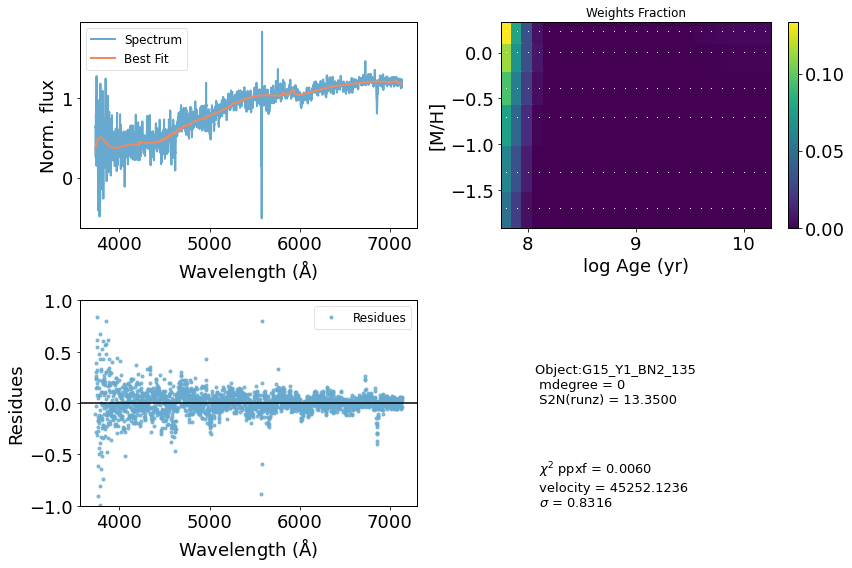

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41709         1     0.008     0.010
 comp.  1:     41426       380
 comp.  2:     41506       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009505
method = capfit; Jac calls: 4; Func calls: 45; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  8 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8994       3.9   41426   380
Comp:  2       Unknown          0       7.7   41506   180
Comp:  2       Unknown          0       8.4   41506   180
Comp:  2       Unknown          0       3.1   41506   180
Comp:  2       Unknown          0       1.6   41506   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.38
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.38
M/L_r: 0.1578
Current $\chi^2$: 0.0095
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


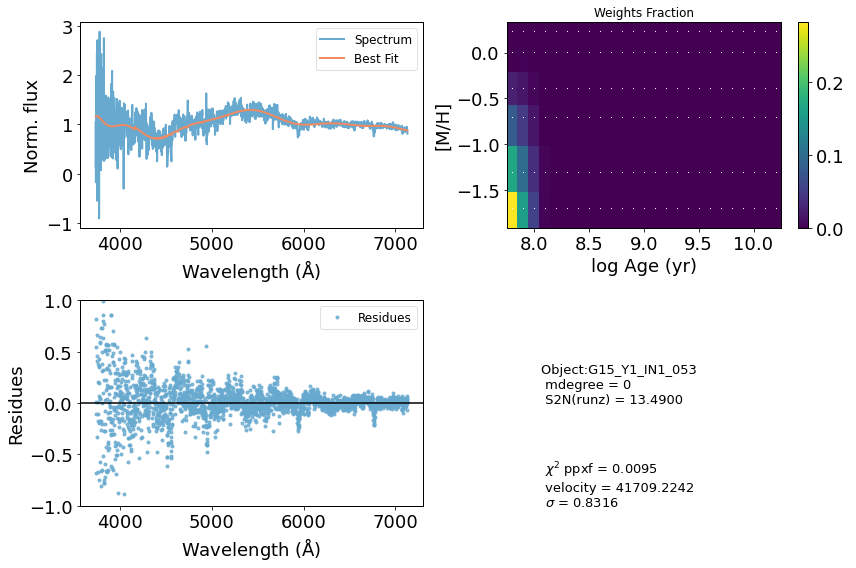

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49462         1    -0.001     0.000
 comp.  1:     49564       436
 comp.  2:     50605      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01768
method = capfit; Jac calls: 11; Func calls: 117; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  33 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.337       5.1   49564   436
Comp:  2       Unknown          0        53   50605  1000
Comp:  2       Unknown          0        53   50605  1000
Comp:  2       Unknown      4.973       6.2   50605  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.191
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.191
M/L_r: 2.374
Current $\chi^2$: 0.0177
Elapsed time in PPXF: 0.97 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


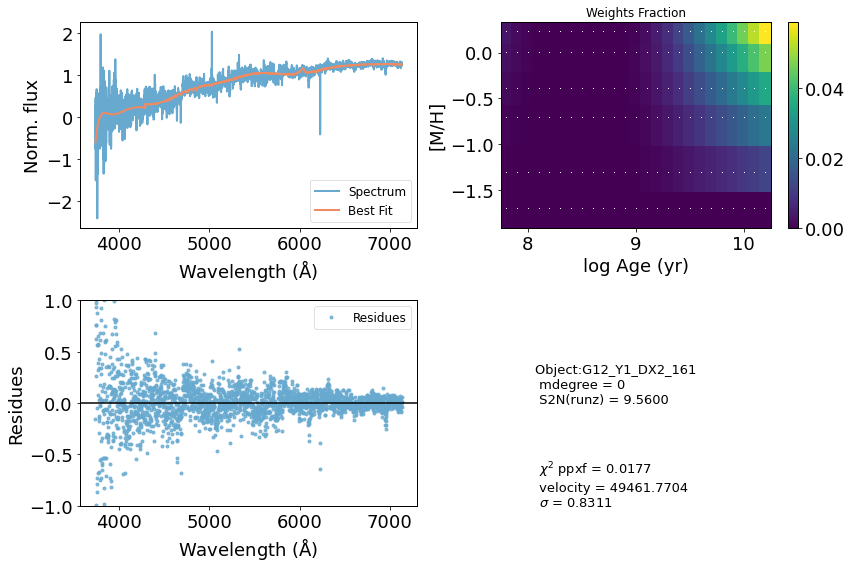

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29810       973    -0.000    -0.000
 comp.  1:     31488        95
 comp.  2:     31808       130
Gas Reddening E(B-V): 2.256
chi2/DOF: 0.005785
method = capfit; Jac calls: 11; Func calls: 117; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4116       1.7   31488    95
Comp:  2       Unknown          0       5.2   31808   130
Comp:  2       Unknown          0       5.1   31808   130
Comp:  2       Unknown          0       3.7   31808   130
Comp:  2       Unknown          0       3.2   31808   130
Comp:  2       Unknown     0.3846         2   31808   130
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide


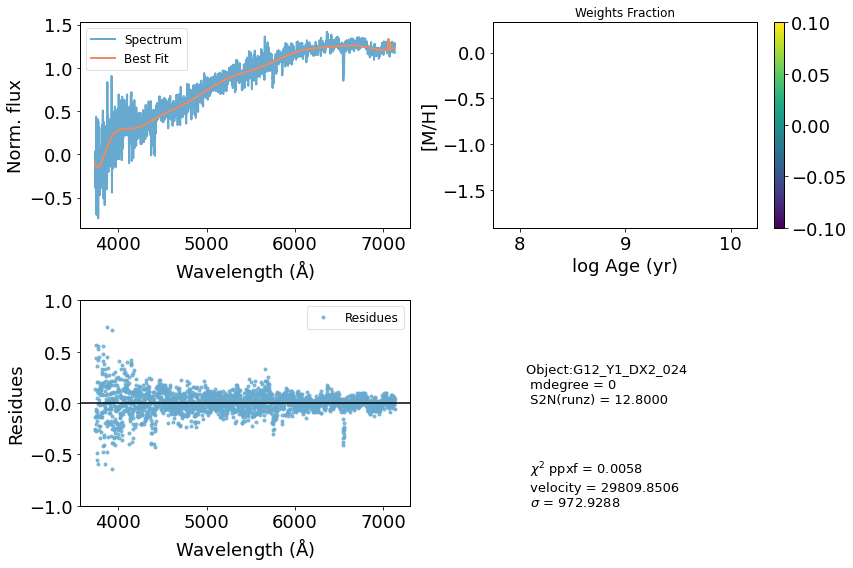

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44060         1     0.001    -0.002
 comp.  1:     44231       180
 comp.  2:     43835       896
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.03095
method = capfit; Jac calls: 9; Func calls: 95; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.9   44231   180
Comp:  2       Unknown          0        47   43835   896
Comp:  2       Unknown          0        47   43835   896
Comp:  2       Unknown      6.374       7.1   43835   896
Comp:  2       Unknown      2.254       4.4   43835   896
---------------------------------------------------------
Weighted <logAge> [yr]: 9.53
Weighted <[M/H]>: -0.392
Weighted <logAge> [yr]: 9.53
Weighted <[M/H]>: -0.392
M/L_r: 0.6062
Current $\chi^2$: 0.0309
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


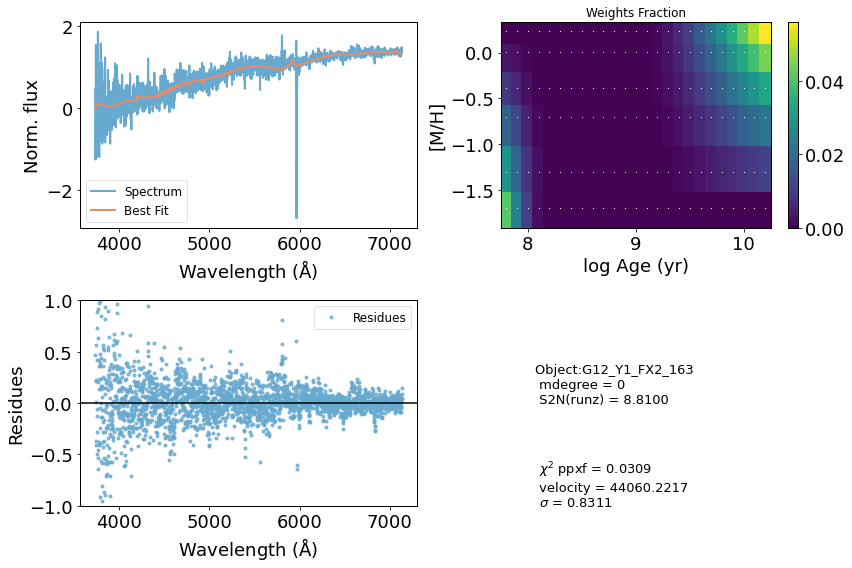

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50969       466     0.000     0.000
 comp.  1:     52791      1000
 comp.  2:     50929         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01583
method = capfit; Jac calls: 18; Func calls: 188; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      18.44       9.2   52791  1000
Comp:  2       Unknown     0.3151       2.1   50929     1
Comp:  2       Unknown          0         2   50929     1
Comp:  2       Unknown          0       1.6   50929     1
---------------------------------------------------------
Weighted <logAge> [yr]: 8.41
Weighted <[M/H]>: -0.885
Weighted <logAge> [yr]: 8.41
Weighted <[M/H]>: -0.885
M/L_r: 0.1998
Current $\chi^2$: 0.0158
Elapsed time in PPXF: 1.63 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


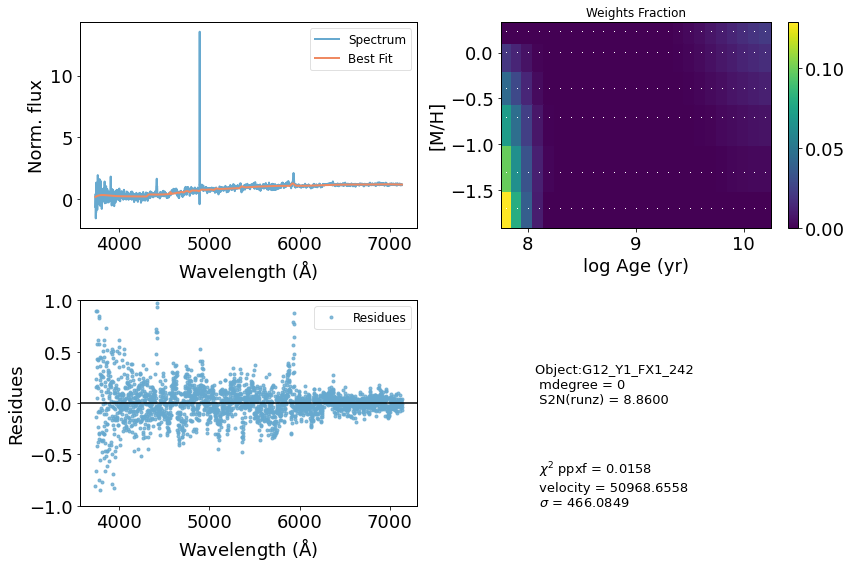

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55886       119     0.001     0.003
 comp.  1:     56247      1000
 comp.  2:     56515         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01038
method = capfit; Jac calls: 12; Func calls: 126; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown         11        11   56247  1000
Comp:  2       Unknown          0       2.3   56515     1
Comp:  2       Unknown     0.8935       2.4   56515     1
Comp:  2       Unknown    0.01382       1.4   56515     1
---------------------------------------------------------
Weighted <logAge> [yr]: 8.21
Weighted <[M/H]>: 0.0444
Weighted <logAge> [yr]: 8.21
Weighted <[M/H]>: 0.0444
M/L_r: 0.2532
Current $\chi^2$: 0.0104
Elapsed time in PPXF: 1.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


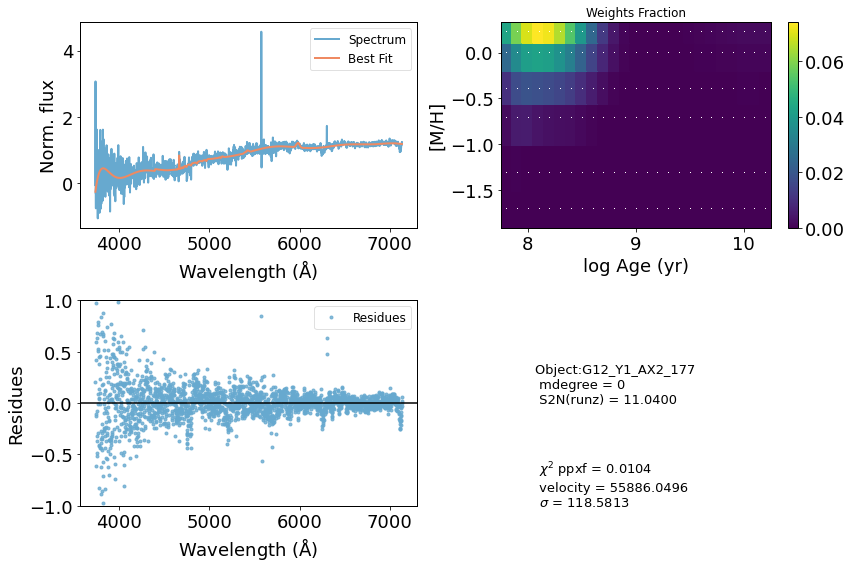

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43923       180     0.000     0.000
 comp.  1:     43923       180
 comp.  2:     43923       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01812
method = capfit; Jac calls: 1; Func calls: 19; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.342       4.4   43923   180
Comp:  2       Unknown     0.2153       4.8   43923   180
Comp:  2       Unknown      1.052       4.8   43923   180
Comp:  2       Unknown          0       3.7   43923   180
Comp:  2       Unknown     0.1257       2.7   43923   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.35
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.35
M/L_r: 0.1602
Current $\chi^2$: 0.0181
Elapsed tim

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


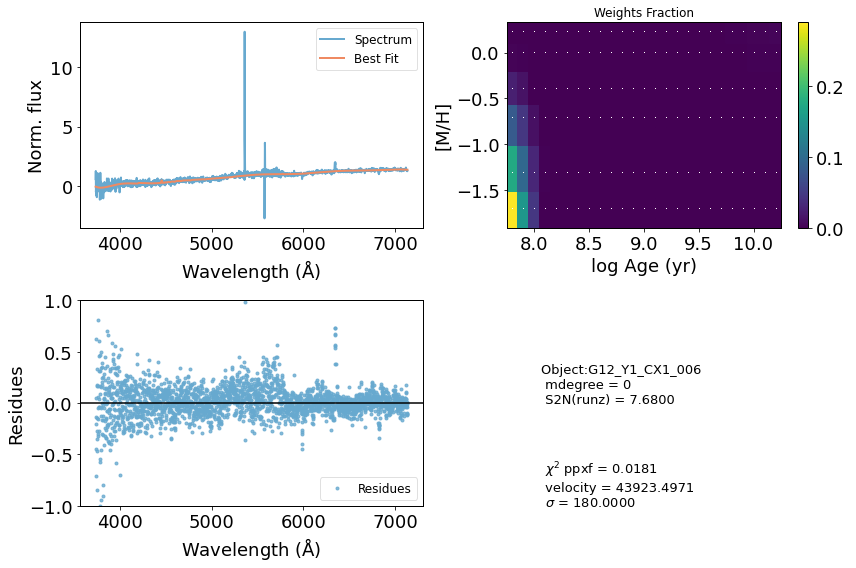

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50677        98    -0.003    -0.015
 comp.  1:     50910       180
 comp.  2:     50628       203
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007165
method = capfit; Jac calls: 7; Func calls: 75; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.9   50910   180
Comp:  2       Unknown          0       5.1   50628   203
Comp:  2       Unknown     0.7389       4.9   50628   203
Comp:  2       Unknown      1.108       3.4   50628   203
---------------------------------------------------------
Weighted <logAge> [yr]: 8.94
Weighted <[M/H]>: -0.152
Weighted <logAge> [yr]: 8.94
Weighted <[M/H]>: -0.152
M/L_r: 0.3103
Current $\chi^2$: 0.0072
Elapsed time in PPXF: 0.58 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


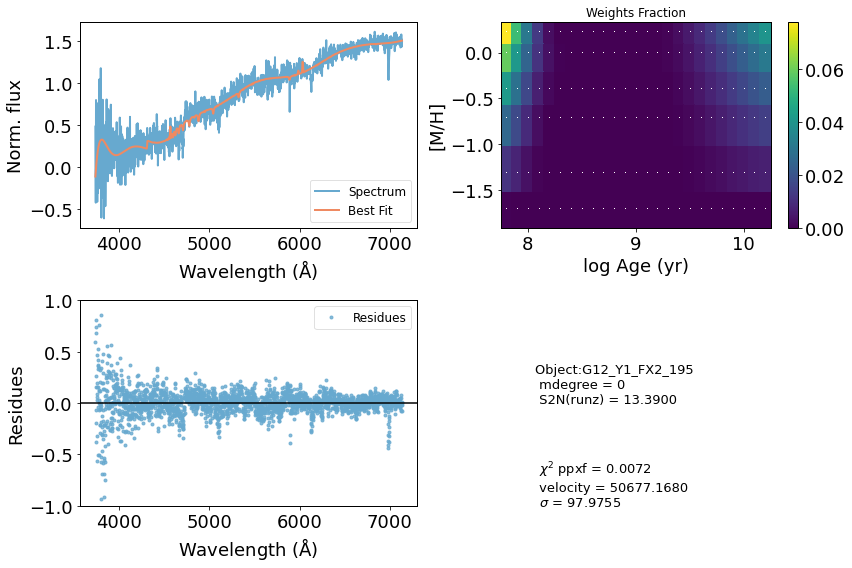

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     22576        64     0.002    -0.001
 comp.  1:     22708       435
 comp.  2:     22535       251
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006196
method = capfit; Jac calls: 6; Func calls: 65; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  44 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.205       5.8   22708   435
Comp:  2       Unknown          0        13   22535   251
Comp:  2       Unknown      1.532        13   22535   251
Comp:  2       Unknown          0         2   22535   251
Comp:  2       Unknown          0         2   22535   251
Comp:  2       Unknown          0       4.3   22535   251
Comp:  2       Unknown          0       2.5   22535   251
Comp:  2       Unknown          0       2.7   22535   251
------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


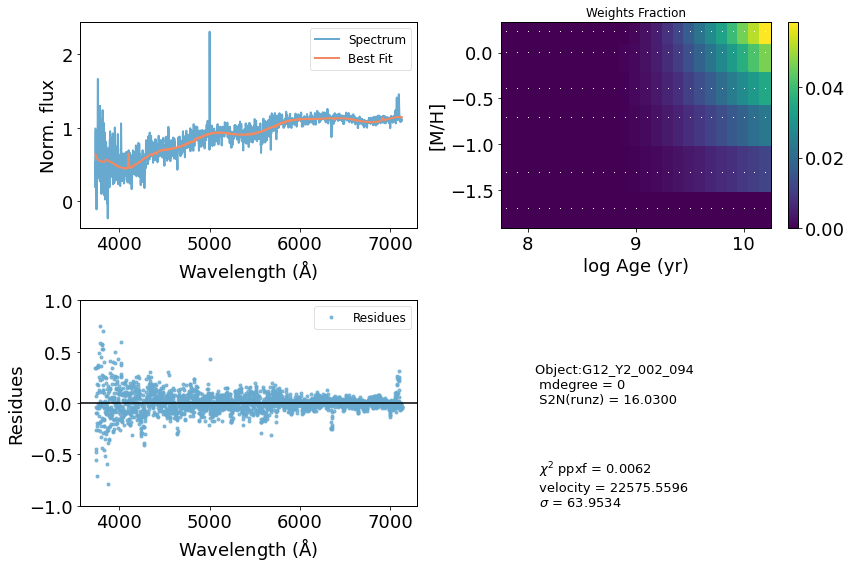

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47982        49    -0.001    -0.001
 comp.  1:     48137        95
 comp.  2:     47993       825
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007647
method = capfit; Jac calls: 8; Func calls: 86; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5382         3   48137    95
Comp:  2       Unknown          0        38   47993   825
Comp:  2       Unknown          0        38   47993   825
Comp:  2       Unknown      1.692       6.3   47993   825
Comp:  2       Unknown      1.051       5.4   47993   825
---------------------------------------------------------
Weighted <logAge> [yr]: 9.3
Weighted <[M/H]>: -0.54
Weighted <logAge> [yr]: 9.3
Weighted <[M/H]>: -0.54
M/L_r: 0.405
Current $\chi^2$: 0.0076
Elapsed tim

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


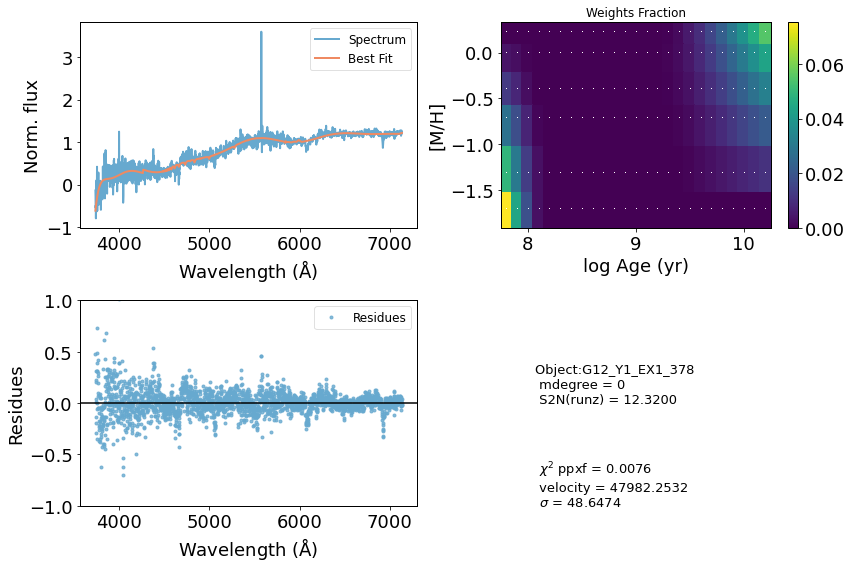

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50754       114     0.004     0.004
 comp.  1:     50386      1000
 comp.  2:     51064       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007717
method = capfit; Jac calls: 10; Func calls: 106; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.871       9.2   50386  1000
Comp:  2       Unknown          0       4.5   51064   180
Comp:  2       Unknown          0       4.4   51064   180
Comp:  2       Unknown    0.03079       3.1   51064   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -0.241
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -0.241
M/L_r: 0.1713
Current $\chi^2$: 0.0077
Elapsed time in PPXF: 0.79 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


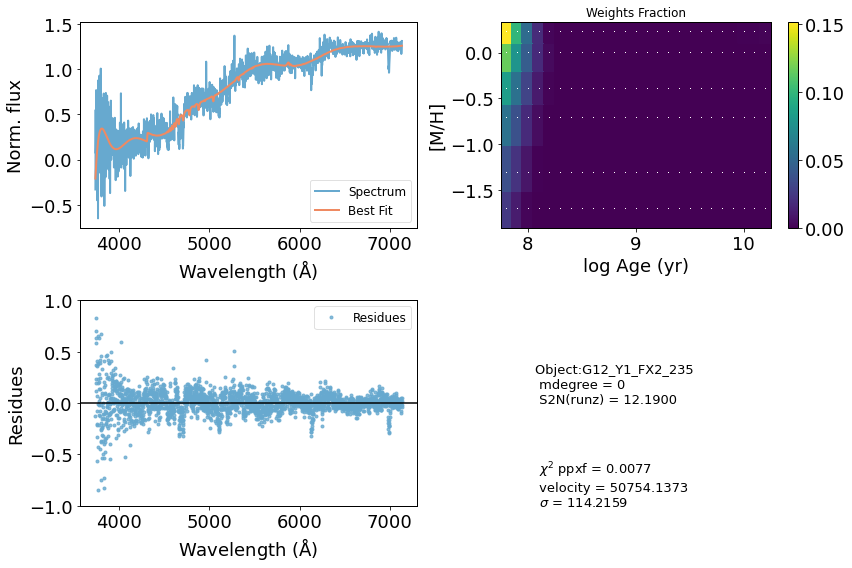

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72027       107    -0.000     0.001
 comp.  1:     72209       536
 comp.  2:     72838       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01967
method = capfit; Jac calls: 9; Func calls: 97; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown        6.8       7.1   72209   536
Comp:  2       Unknown          0       4.9   72838   180
Comp:  2       Unknown          0       4.8   72838   180
Comp:  2       Unknown          0       2.2   72838   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.19
Weighted <[M/H]>: -0.00732
Weighted <logAge> [yr]: 8.19
Weighted <[M/H]>: -0.00732
M/L_r: 0.2485
Current $\chi^2$: 0.0197
Elapsed time in PPXF: 0.73 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


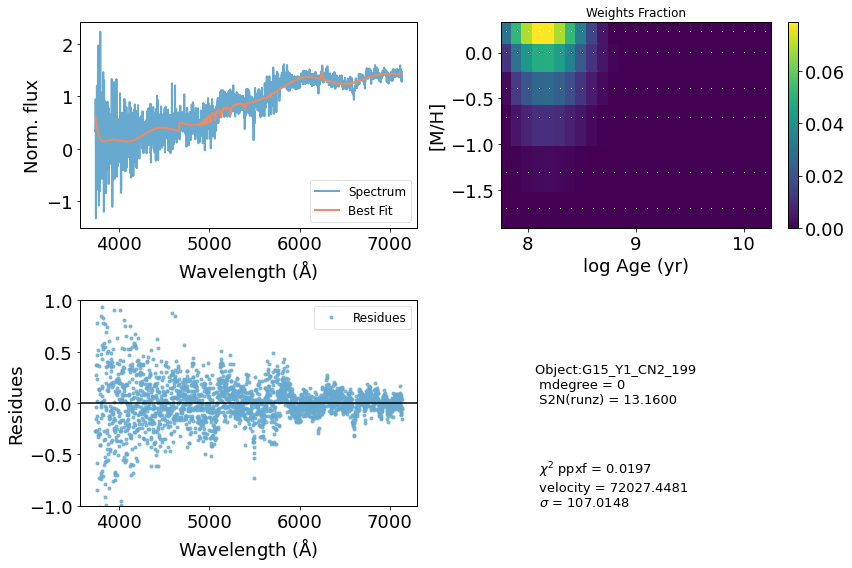

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46405        66     0.002    -0.000
 comp.  1:     46318         1
 comp.  2:     45547      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005279
method = capfit; Jac calls: 11; Func calls: 117; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1388       1.9   46318     1
Comp:  2       Unknown          0        62   45547  1000
Comp:  2       Unknown          0        62   45547  1000
Comp:  2       Unknown       2.03       7.3   45547  1000
Comp:  2       Unknown      2.712       4.8   45547  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.279
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.279
M/L_r: 0.947
Current $\chi^2$: 0.0053
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


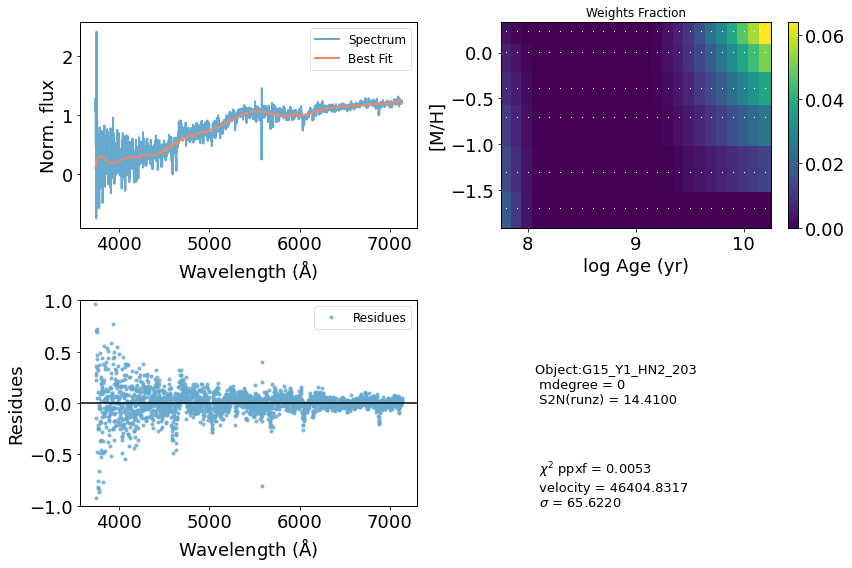

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59696        27     0.001    -0.000
 comp.  1:     59986      1000
 comp.  2:     59893      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01839
method = capfit; Jac calls: 12; Func calls: 126; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  16 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      13.85        11   59986  1000
Comp:  2       Unknown          0        46   59893  1000
Comp:  2       Unknown          0        46   59893  1000
Comp:  2       Unknown      11.48       6.2   59893  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.191
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.191
M/L_r: 2.717
Current $\chi^2$: 0.0184
Elapsed time in PPXF: 1.01 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


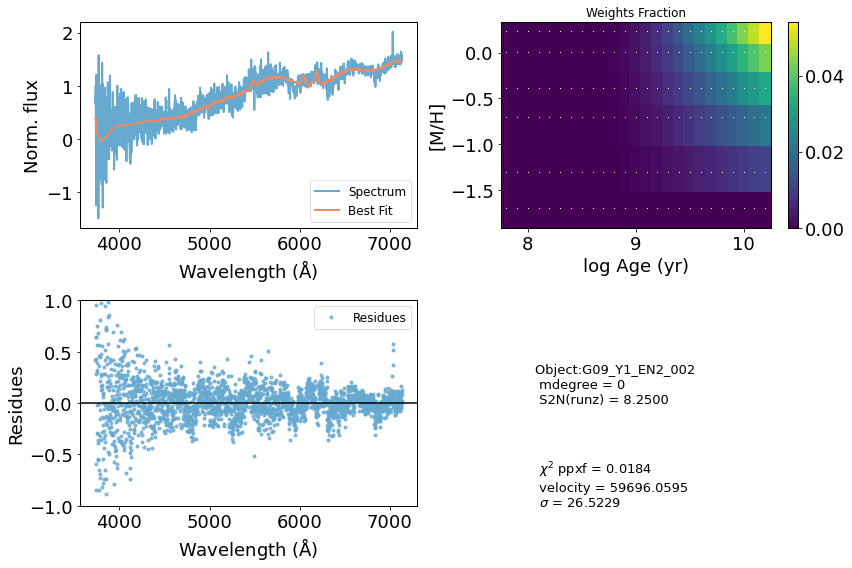

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37153      1000     0.032    -0.033
 comp.  1:     35143       755
 comp.  2:     34857       114
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005138
method = capfit; Jac calls: 14; Func calls: 147; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  14 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.101       7.3   35143   755
Comp:  2       Unknown          0         4   34857   114
Comp:  2       Unknown          0         4   34857   114
Comp:  2       Unknown     0.3456       2.9   34857   114
Comp:  2       Unknown     0.3775       1.9   34857   114
Comp:  2       Unknown    0.04766       1.8   34857   114
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -0.849
Weighted <logAge> [yr]: 7.89
Weighted 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


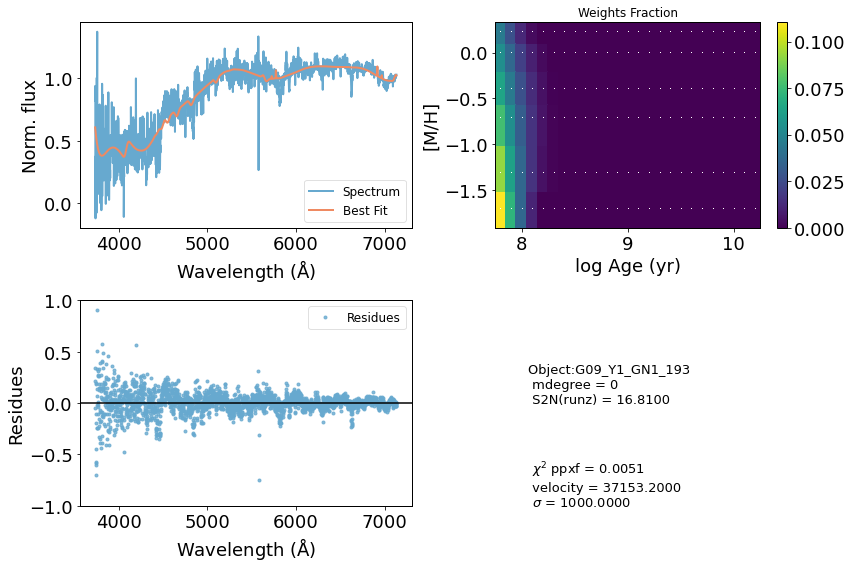

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46229         1     0.004     0.001
 comp.  1:     46138        69
 comp.  2:     46153        23
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01057
method = capfit; Jac calls: 6; Func calls: 66; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.014       2.7   46138    69
Comp:  2       Unknown    0.08891       2.4   46153    23
Comp:  2       Unknown          0       2.4   46153    23
Comp:  2       Unknown     0.1949       1.8   46153    23
Comp:  2       Unknown     0.3819      0.98   46153    23
---------------------------------------------------------
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.32
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.32
M/L_r: 0.1573
Current $\chi^2$: 0.0106
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


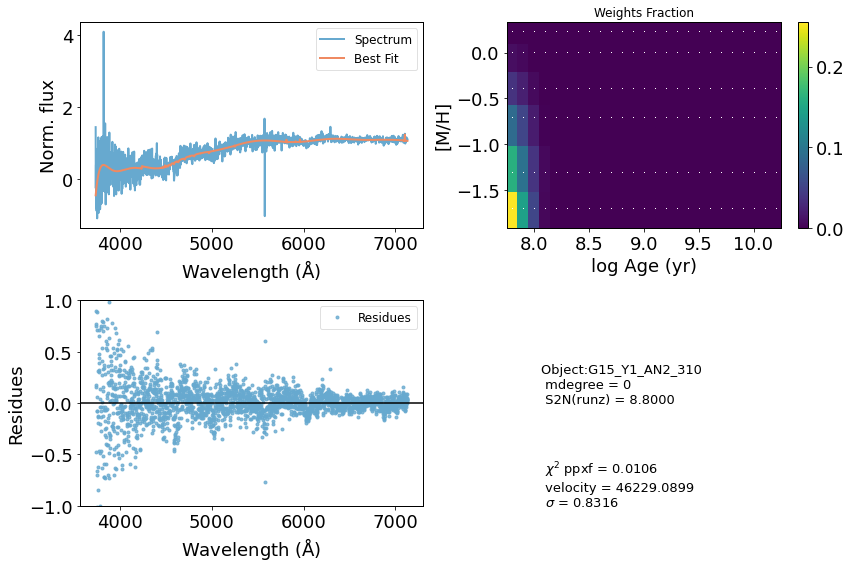

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36404       180     0.000     0.000
 comp.  1:     36404       180
 comp.  2:     36404       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.06796
method = capfit; Jac calls: 1; Func calls: 18; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  49 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.033       4.1   36404   180
Comp:  2       Unknown          0       6.2   36404   180
Comp:  2       Unknown          0       6.3   36404   180
Comp:  2       Unknown     0.4119       4.3   36404   180
Comp:  2       Unknown          0       2.7   36404   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: -0.195
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: -0.195
M/L_r: 3.335
Current $\chi^2$: 0.0680
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


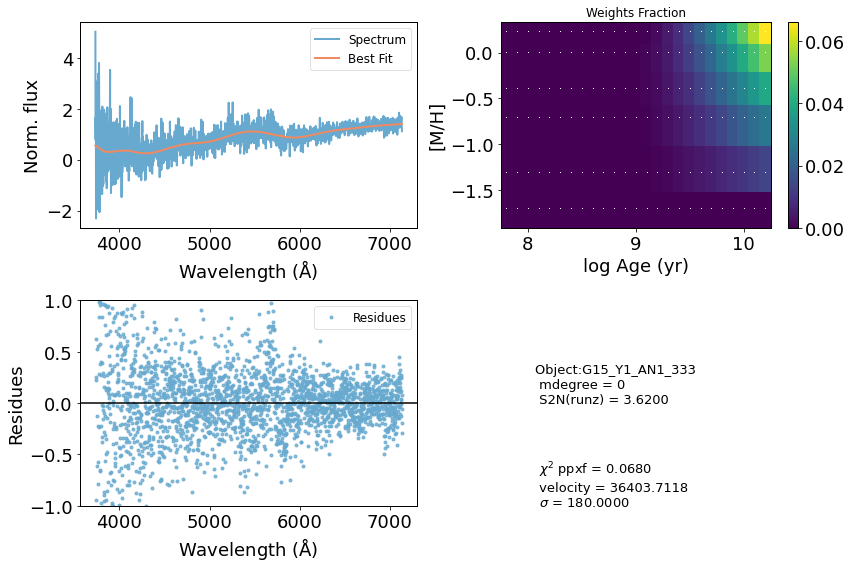

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46029        43     0.002    -0.001
 comp.  1:     46477       362
 comp.  2:     45952       470
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005539
method = capfit; Jac calls: 8; Func calls: 87; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.443       7.2   46477   362
Comp:  2       Unknown          0        17   45952   470
Comp:  2       Unknown          0        17   45952   470
Comp:  2       Unknown     0.9392       5.3   45952   470
Comp:  2       Unknown     0.1316         4   45952   470
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.27
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.27
M/L_r: 0.1574
Current $\chi^2$: 0.0055
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


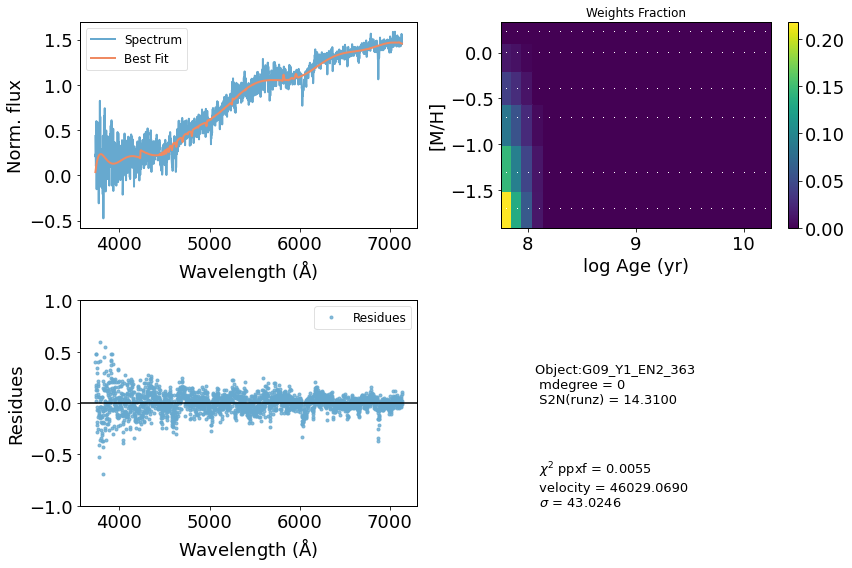

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43258      1000    -0.001    -0.000
 comp.  1:     41567       196
 comp.  2:     41268         1
Gas Reddening E(B-V): 1.042
chi2/DOF: 0.01572
method = capfit; Jac calls: 12; Func calls: 127; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.543       2.4   41567   196
Comp:  2       Unknown     0.2325         3   41268     1
Comp:  2       Unknown     0.6426         3   41268     1
Comp:  2       Unknown          0       1.9   41268     1
Comp:  2       Unknown          0         1   41268     1
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.14
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.14
M/L_r: 0.1582
Current $\chi^2$: 0.0157
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


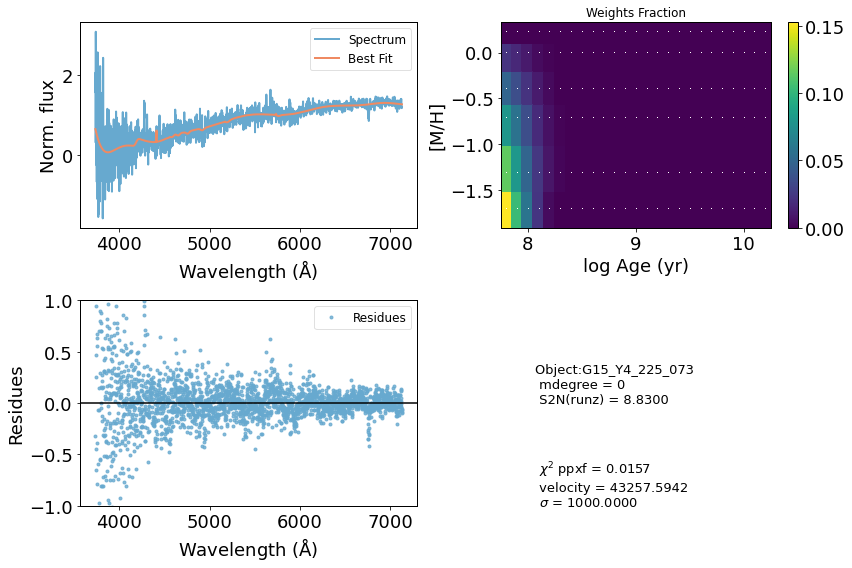

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     26475        56    -0.003    -0.002
 comp.  1:     27101       623
 comp.  2:     26925       125
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01172
method = capfit; Jac calls: 11; Func calls: 114; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  42 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1.06       6.7   27101   623
Comp:  2       Unknown      2.053        10   26925   125
Comp:  2       Unknown          0        10   26925   125
Comp:  2       Unknown          0       1.4   26925   125
Comp:  2       Unknown    0.08106       1.4   26925   125
Comp:  2       Unknown     0.5077       3.4   26925   125
Comp:  2       Unknown   0.004109       1.8   26925   125
Comp:  2       Unknown          0         2   26925   125
----------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


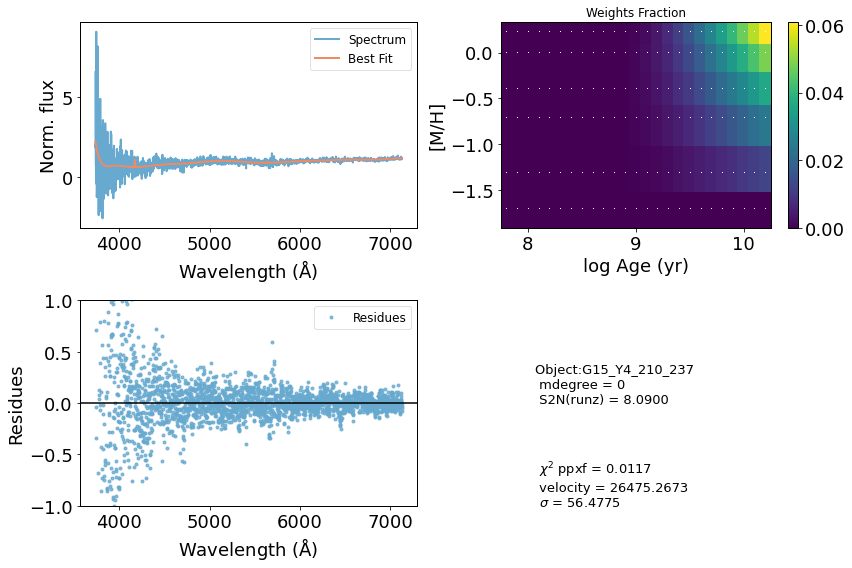

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35157       736     0.000    -0.001
 comp.  1:     34477       297
 comp.  2:     34485       117
Gas Reddening E(B-V): 0.658
chi2/DOF: 0.008869
method = capfit; Jac calls: 9; Func calls: 95; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7966         3   34477   297
Comp:  2       Unknown          0       4.9   34485   117
Comp:  2       Unknown          0         5   34485   117
Comp:  2       Unknown     0.1698       3.3   34485   117
Comp:  2       Unknown          0       1.9   34485   117
Comp:  2       Unknown     0.5515       1.7   34485   117
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.14
Weighted <logAge> [yr]: 7.89
Weighted <[M/

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


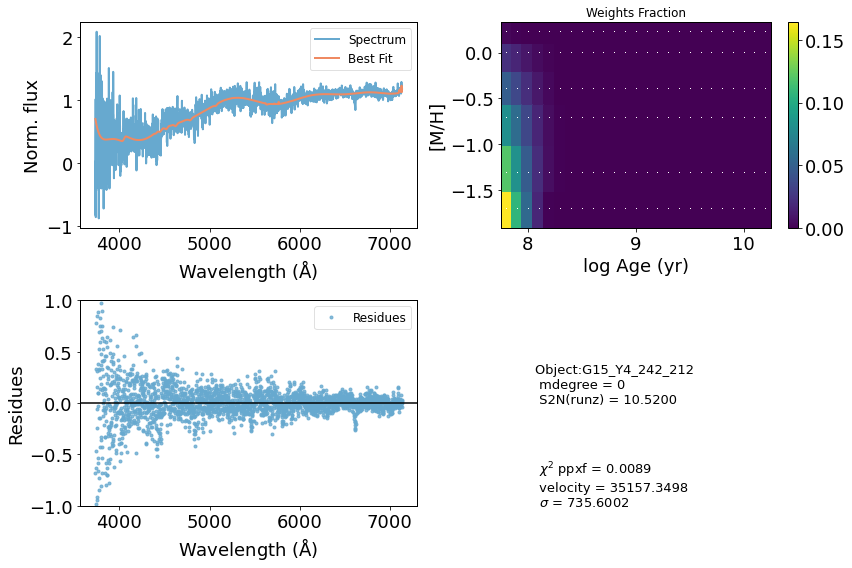

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     76642       276    -0.002    -0.000
 comp.  1:     77335       709
 comp.  2:     77526       252
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08329
method = capfit; Jac calls: 9; Func calls: 97; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.46       8.6   77335   709
Comp:  2       Unknown          0       5.9   77526   252
Comp:  2       Unknown          0       5.9   77526   252
Comp:  2       Unknown      2.377       2.9   77526   252
---------------------------------------------------------
Weighted <logAge> [yr]: 9
Weighted <[M/H]>: -0.154
Weighted <logAge> [yr]: 9
Weighted <[M/H]>: -0.154
M/L_r: 0.5793
Current $\chi^2$: 0.0833
Elapsed time in PPXF: 0.73 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


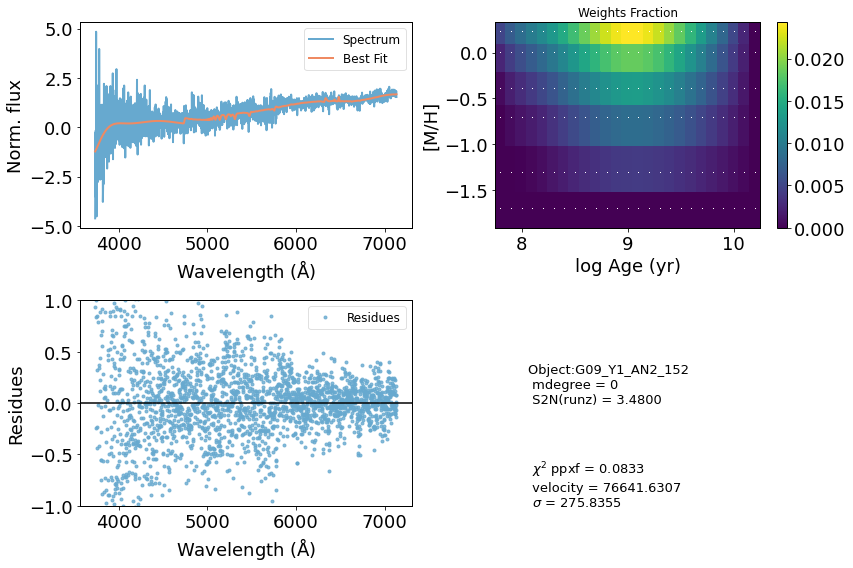

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51249       186    -0.001    -0.001
 comp.  1:     51193      1000
 comp.  2:     51719       146
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01451
method = capfit; Jac calls: 10; Func calls: 106; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.53       8.9   51193  1000
Comp:  2       Unknown          0       4.8   51719   146
Comp:  2       Unknown      1.684       4.9   51719   146
Comp:  2       Unknown     0.3724       2.5   51719   146
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.19
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.19
M/L_r: 0.157
Current $\chi^2$: 0.0145
Elapsed time in PPXF: 0.86 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


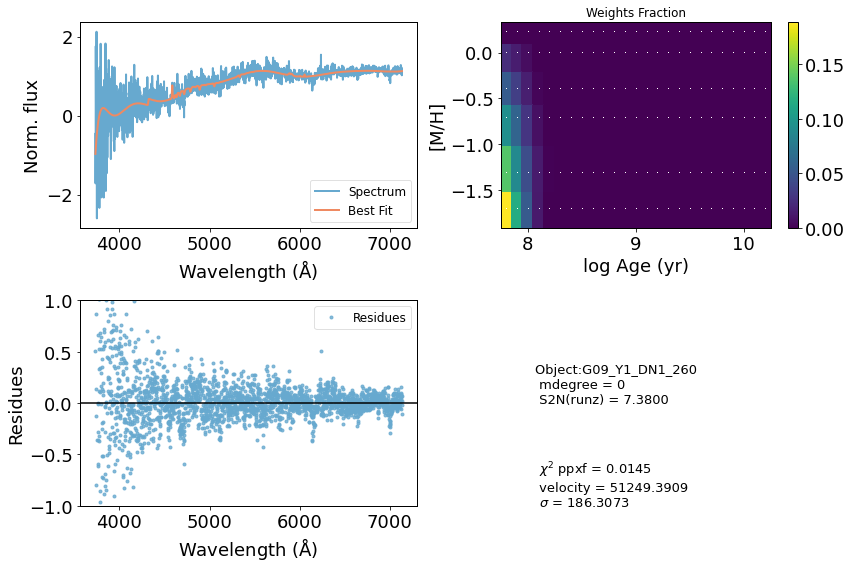

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54678       148    -0.001     0.001
 comp.  1:     54295      1000
 comp.  2:     54619       225
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01389
method = capfit; Jac calls: 11; Func calls: 118; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.83        13   54295  1000
Comp:  2       Unknown          0       6.1   54619   225
Comp:  2       Unknown          0         6   54619   225
Comp:  2       Unknown     0.9638       3.3   54619   225
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.06
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.06
M/L_r: 0.158
Current $\chi^2$: 0.0139
Elapsed time in PPXF: 0.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


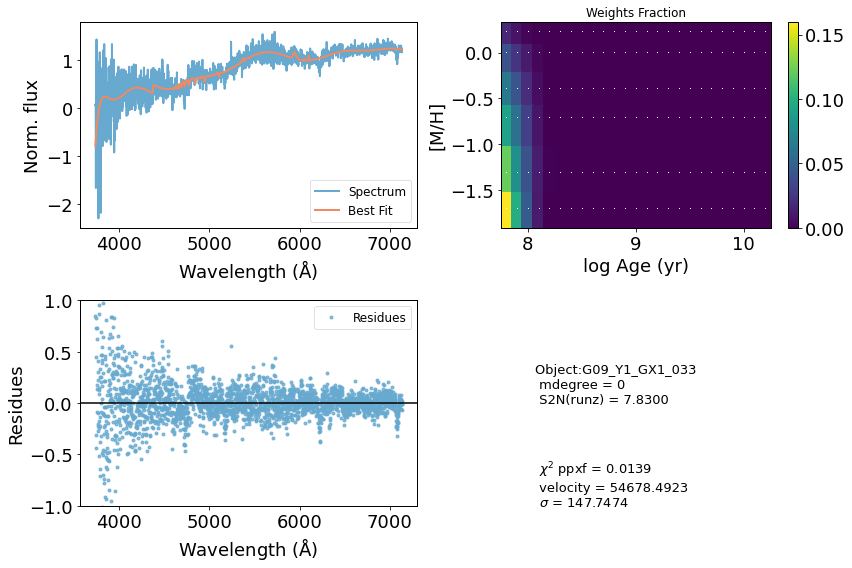

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53231       232     0.001    -0.001
 comp.  1:     53108      1000
 comp.  2:     54092       426
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00454
method = capfit; Jac calls: 10; Func calls: 107; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.48        11   53108  1000
Comp:  2       Unknown          0        12   54092   426
Comp:  2       Unknown          0        12   54092   426
Comp:  2       Unknown      1.078       4.3   54092   426
---------------------------------------------------------
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -0.0828
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -0.0828
M/L_r: 0.1842
Current $\chi^2$: 0.0045
Elapsed time in PPXF: 0.82 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


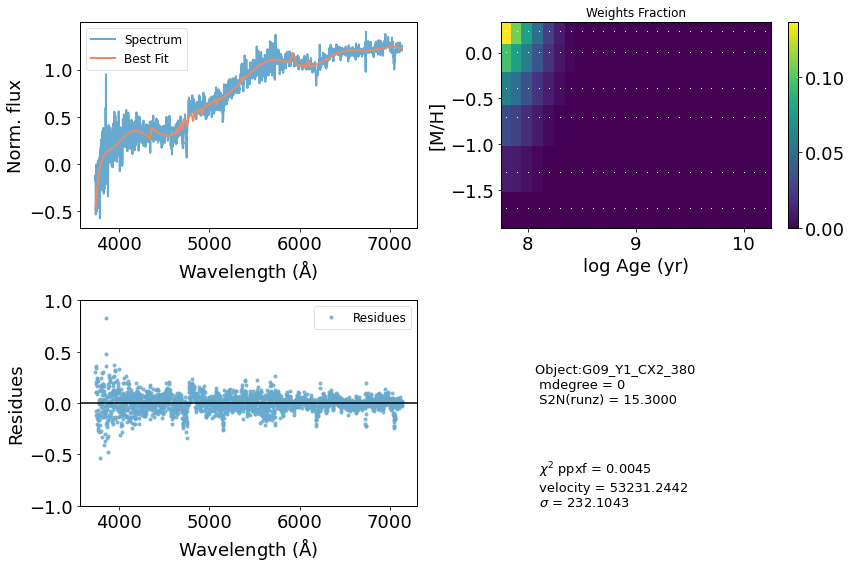

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56200       420    -0.004    -0.009
 comp.  1:     56636      1000
 comp.  2:     56814       182
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006756
method = capfit; Jac calls: 6; Func calls: 66; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.88        12   56636  1000
Comp:  2       Unknown          0       4.7   56814   182
Comp:  2       Unknown    0.01679       4.7   56814   182
Comp:  2       Unknown          0       2.8   56814   182
---------------------------------------------------------
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -0.0947
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -0.0947
M/L_r: 0.1822
Current $\chi^2$: 0.0068
Elapsed time in PPXF: 0.50 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


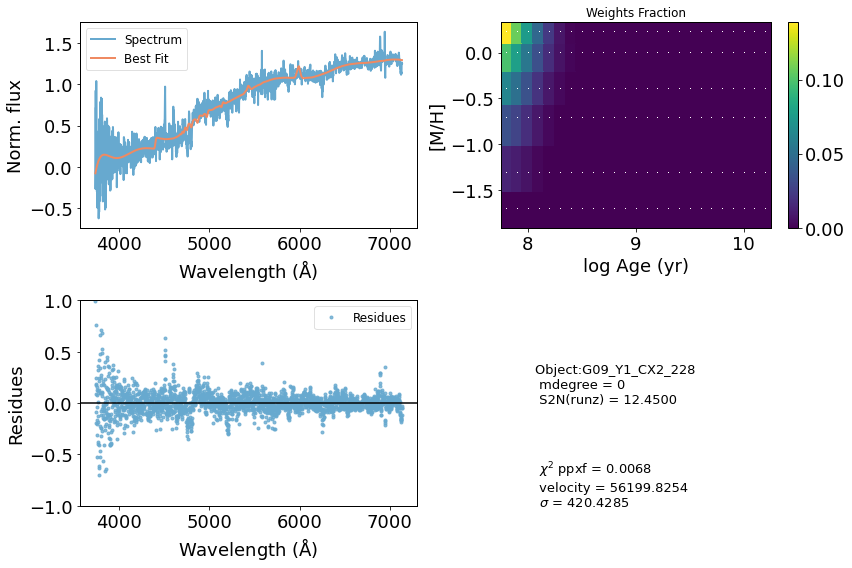

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74743      1000    -0.015    -0.015
 comp.  1:     74781       214
 comp.  2:     74772       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.04138
method = capfit; Jac calls: 1; Func calls: 16; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.696         5   74781   214
Comp:  2       Unknown          0       4.1   74772   180
Comp:  2       Unknown          0       4.1   74772   180
Comp:  2       Unknown          0       2.1   74772   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.92
Weighted <[M/H]>: 0.078
Weighted <logAge> [yr]: 7.92
Weighted <[M/H]>: 0.078
M/L_r: 0.1884
Current $\chi^2$: 0.0414
Elapsed time in PPXF: 0.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


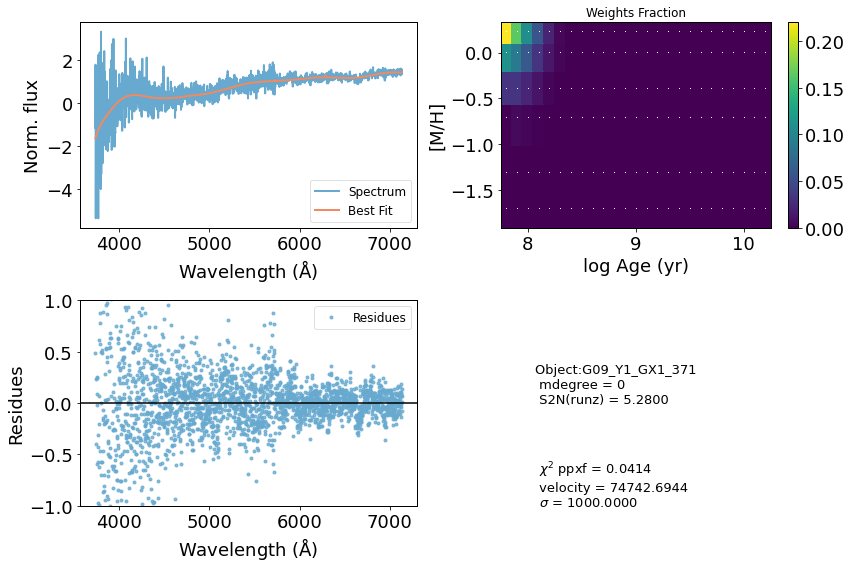

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     20145        48     0.000    -0.000
 comp.  1:     20157       209
 comp.  2:     20114       186
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004724
method = capfit; Jac calls: 4; Func calls: 48; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  49 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.273         5   20157   209
Comp:  2       Unknown          0        14   20114   186
Comp:  2       Unknown          0        14   20114   186
Comp:  2       Unknown     0.1216       2.1   20114   186
Comp:  2       Unknown    0.06955       2.2   20114   186
Comp:  2       Unknown          0       3.4   20114   186
Comp:  2       Unknown          0       2.6   20114   186
Comp:  2       Unknown          0         3   20114   186
------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


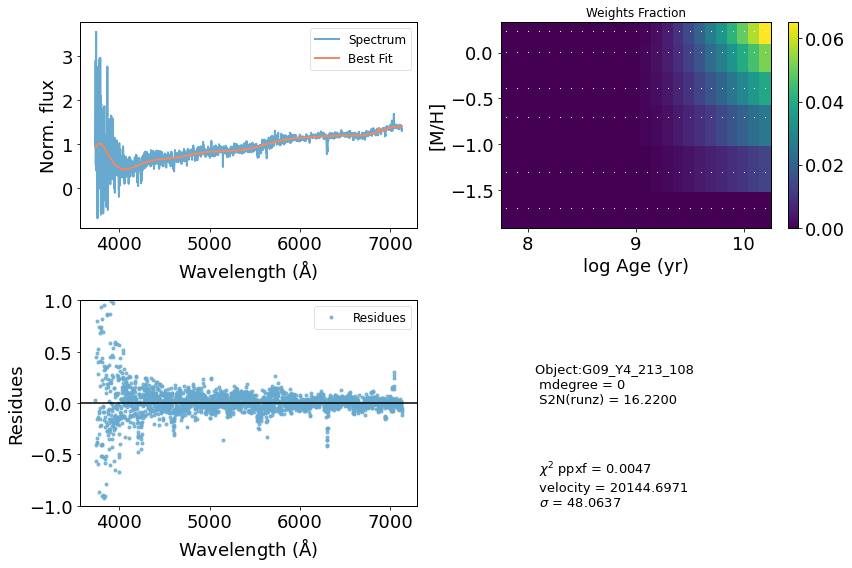

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47551       303     0.001    -0.002
 comp.  1:     47150      1000
 comp.  2:     45680      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00553
method = capfit; Jac calls: 15; Func calls: 156; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.43        16   47150  1000
Comp:  2       Unknown          0        40   45680  1000
Comp:  2       Unknown          0        40   45680  1000
Comp:  2       Unknown      2.149       7.7   45680  1000
Comp:  2       Unknown      5.997       9.7   45680  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.15
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.15
M/L_r: 0.1581
Current $\chi^2$: 0.0055
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


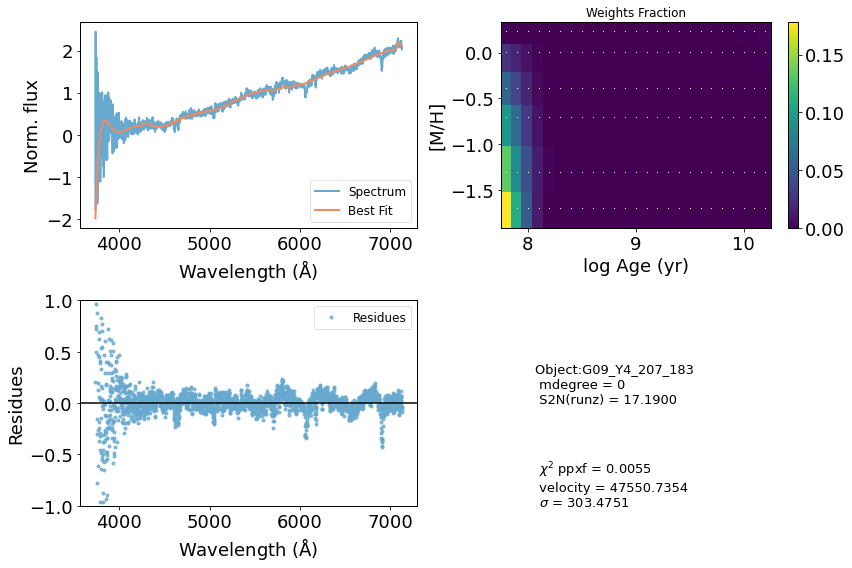

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40512      1000    -0.007    -0.038
 comp.  1:     38512       180
 comp.  2:     38695       454
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006664
method = capfit; Jac calls: 5; Func calls: 57; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  13 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.4   38512   180
Comp:  2       Unknown          0        27   38695   454
Comp:  2       Unknown          0        27   38695   454
Comp:  2       Unknown          0       5.9   38695   454
Comp:  2       Unknown      1.037         4   38695   454
---------------------------------------------------------
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -1.1
M/L_r: 0.1589
Current $\chi^2$: 0.0067
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


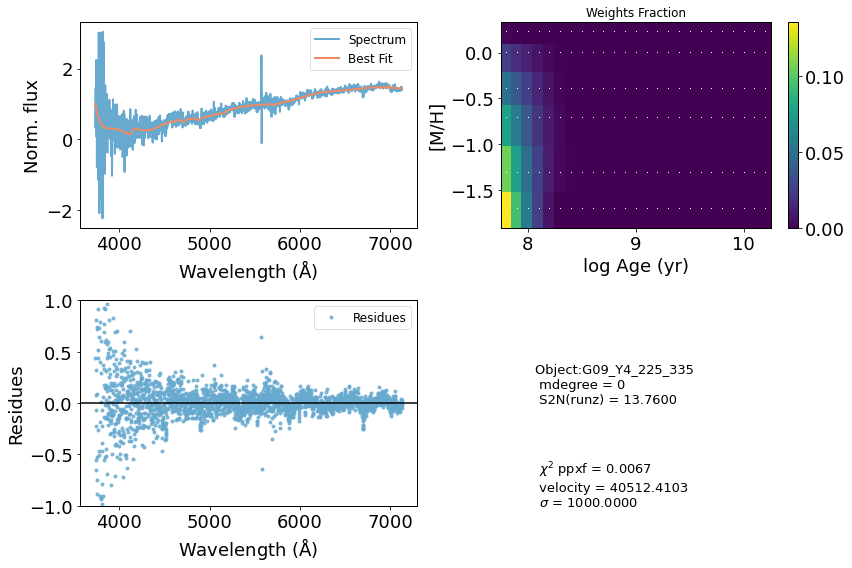

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43388         1    -0.001    -0.002
 comp.  1:     43262       109
 comp.  2:     42046      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.03117
method = capfit; Jac calls: 20; Func calls: 206; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.239       2.6   43262   109
Comp:  2       Unknown          0        69   42046  1000
Comp:  2       Unknown          0        69   42046  1000
Comp:  2       Unknown      1.579       7.2   42046  1000
Comp:  2       Unknown      5.274       4.1   42046  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.314
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.314
M/L_r: 1.776
Current $\chi^2$: 0.0312
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


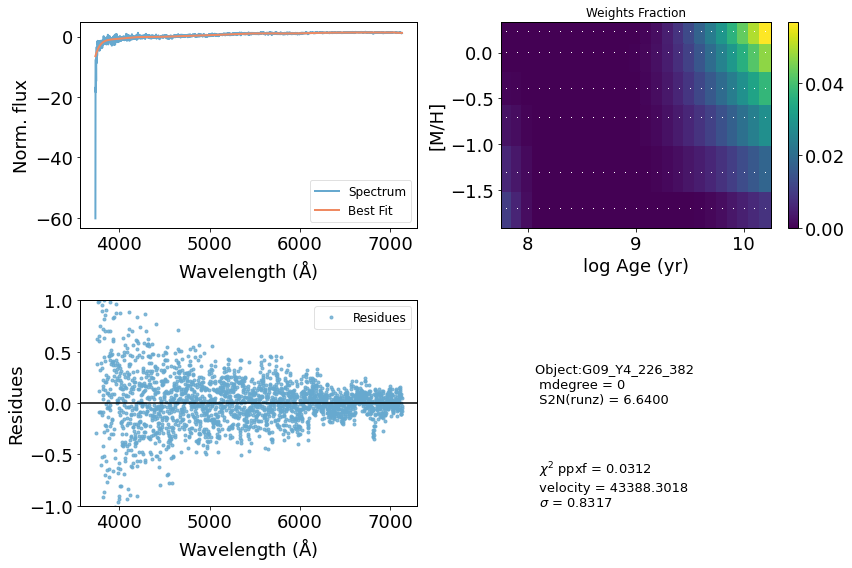

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59725       414    -0.000     0.001
 comp.  1:     60354      1000
 comp.  2:     60759       824
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02066
method = capfit; Jac calls: 9; Func calls: 98; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  23 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.97       9.8   60354  1000
Comp:  2       Unknown          0        41   60759   824
Comp:  2       Unknown     0.7767        41   60759   824
Comp:  2       Unknown       2.29       4.9   60759   824
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.188
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.188
M/L_r: 1.495
Current $\chi^2$: 0.0207
Elapsed time in PPXF: 0.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


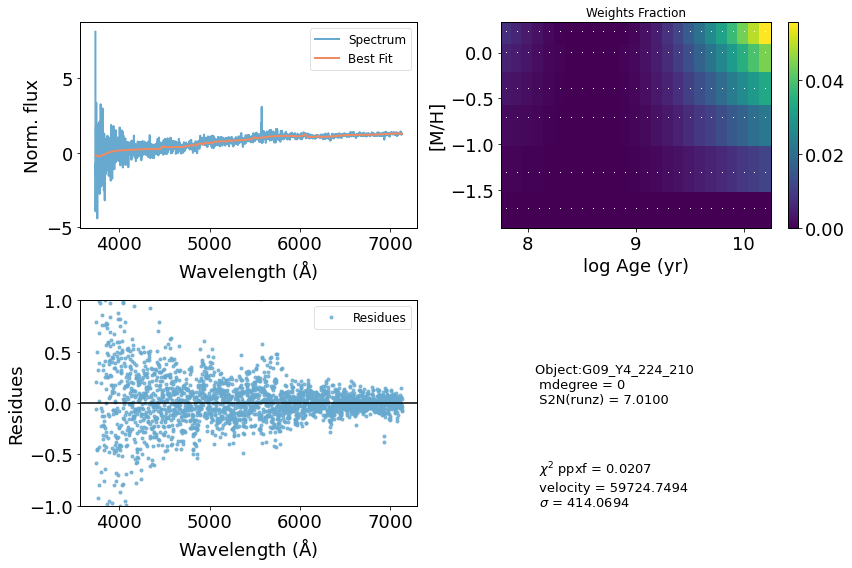

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43028       109    -0.001    -0.001
 comp.  1:     43396       342
 comp.  2:     42578       311
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006235
method = capfit; Jac calls: 8; Func calls: 86; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.426       4.4   43396   342
Comp:  2       Unknown          0        12   42578   311
Comp:  2       Unknown          0        12   42578   311
Comp:  2       Unknown     0.5464       4.4   42578   311
Comp:  2       Unknown     0.4628       2.7   42578   311
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.35
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.35
M/L_r: 0.158
Current $\chi^2$: 0.0062
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


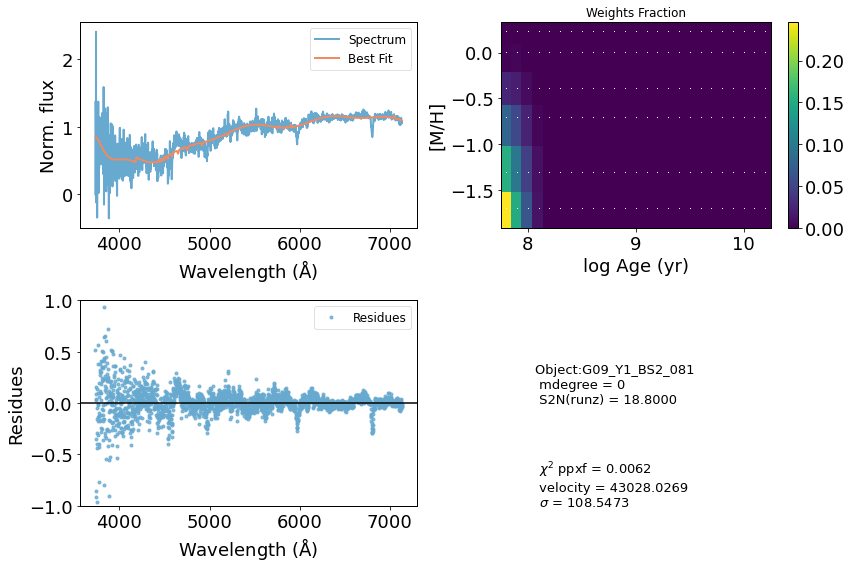

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47321         1    -0.003     0.010
 comp.  1:     47376       180
 comp.  2:     46299      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009009
method = capfit; Jac calls: 11; Func calls: 113; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   47376   180
Comp:  2       Unknown          0        57   46299  1000
Comp:  2       Unknown          0        57   46299  1000
Comp:  2       Unknown      3.427         7   46299  1000
Comp:  2       Unknown      2.599       4.8   46299  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -1.08
M/L_r: 0.161
Current $\chi^2$: 0.0090
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


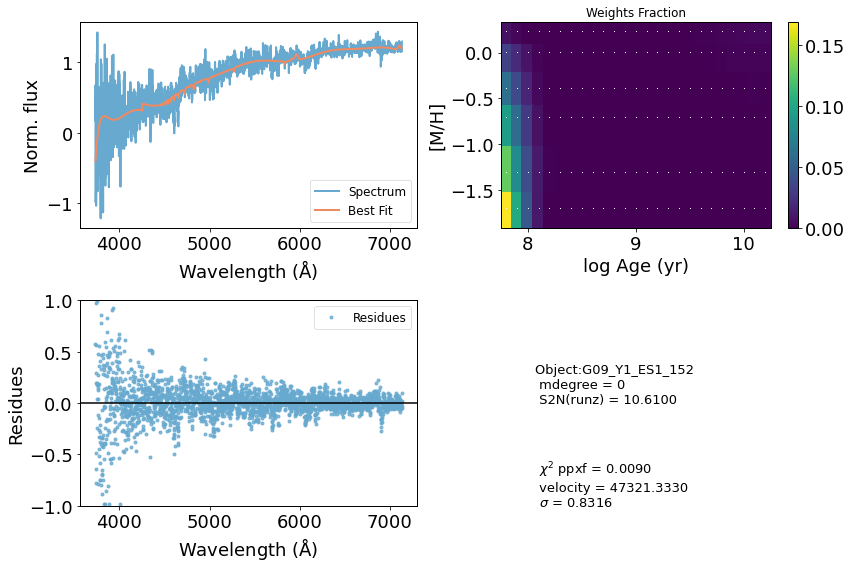

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68253        65    -0.001    -0.003
 comp.  1:     69134       180
 comp.  2:     69078       129
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01037
method = capfit; Jac calls: 8; Func calls: 88; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  32 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9982       4.3   69134   180
Comp:  2       Unknown     0.4396       3.5   69078   129
Comp:  2       Unknown          0       3.4   69078   129
Comp:  2       Unknown     0.6248       2.1   69078   129
---------------------------------------------------------
Weighted <logAge> [yr]: 9.55
Weighted <[M/H]>: -0.158
Weighted <logAge> [yr]: 9.55
Weighted <[M/H]>: -0.158
M/L_r: 0.7182
Current $\chi^2$: 0.0104
Elapsed time in PPXF: 0.75 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


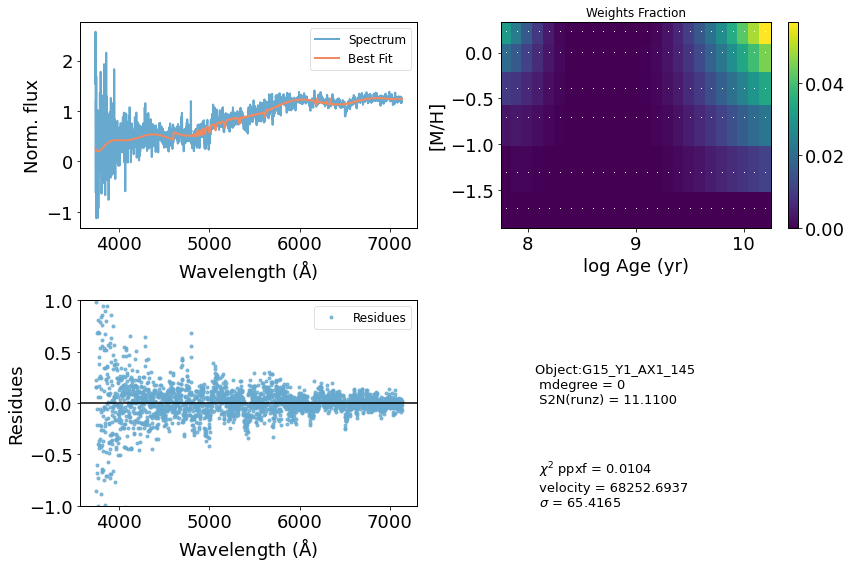

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     25911         1     0.001     0.001
 comp.  1:     25649       567
 comp.  2:     25928       216
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005505
method = capfit; Jac calls: 8; Func calls: 86; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.401       7.3   25649   567
Comp:  2       Unknown      1.257       8.6   25928   216
Comp:  2       Unknown     0.1929       8.6   25928   216
Comp:  2       Unknown          0       2.2   25928   216
Comp:  2       Unknown      0.109       2.2   25928   216
Comp:  2       Unknown     0.5844       4.8   25928   216
Comp:  2       Unknown     0.3354       2.6   25928   216
Comp:  2       Unknown          0       2.8   25928   216
-------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


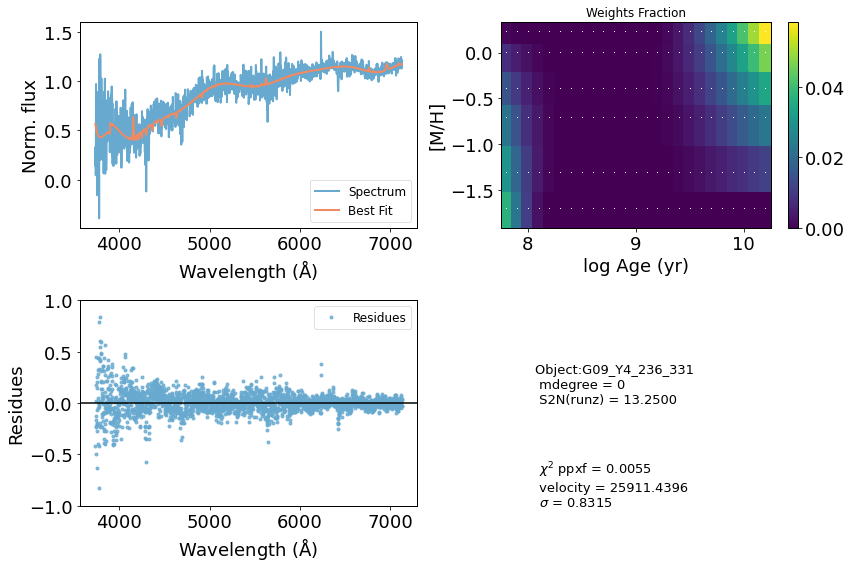

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     69888       183    -0.003    -0.003
 comp.  1:     69890       183
 comp.  2:     69887       183
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01188
method = capfit; Jac calls: 1; Func calls: 18; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.483       4.6   69890   183
Comp:  2       Unknown          0       4.4   69887   183
Comp:  2       Unknown          0       4.3   69887   183
Comp:  2       Unknown     0.7472       2.9   69887   183
---------------------------------------------------------
Weighted <logAge> [yr]: 7.83
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 7.83
Weighted <[M/H]>: -0.198
M/L_r: 0.1741
Current $\chi^2$: 0.0119
Elapsed time in PPXF: 0.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


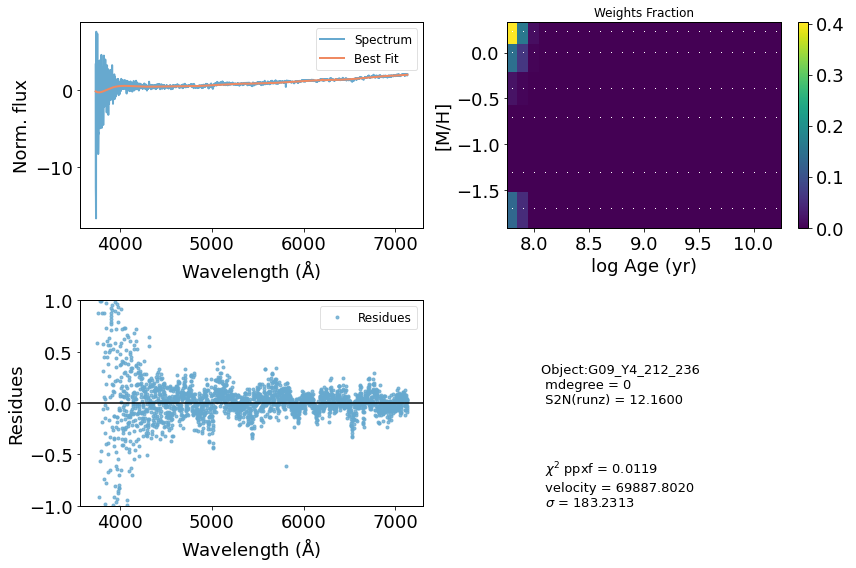

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53010       311    -0.012    -0.011
 comp.  1:     52568      1000
 comp.  2:     53615       180
Gas Reddening E(B-V): 0.005
chi2/DOF: 0.01142
method = capfit; Jac calls: 12; Func calls: 123; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.01       7.4   52568  1000
Comp:  2       Unknown          0       5.4   53615   180
Comp:  2       Unknown          0       5.4   53615   180
Comp:  2       Unknown          0       2.4   53615   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.346
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.346
M/L_r: 0.1731
Current $\chi^2$: 0.0114
Elapsed time in PPXF: 1.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


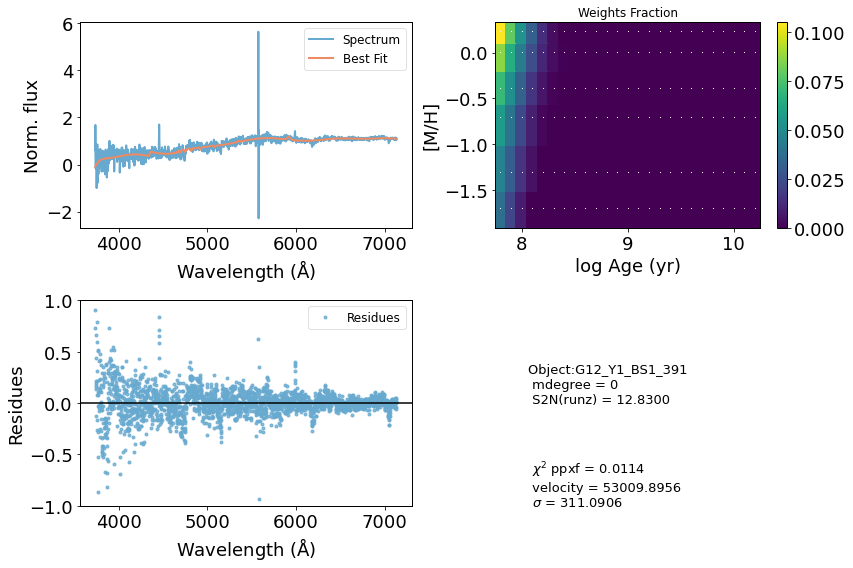

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42781       299     0.002    -0.001
 comp.  1:     42838       268
 comp.  2:     42760       115
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02208
method = capfit; Jac calls: 5; Func calls: 56; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.403       4.6   42838   268
Comp:  2       Unknown          0       5.3   42760   115
Comp:  2       Unknown     0.5331       5.4   42760   115
Comp:  2       Unknown     0.8536       2.6   42760   115
Comp:  2       Unknown     0.3002       1.7   42760   115
---------------------------------------------------------
Weighted <logAge> [yr]: 8.01
Weighted <[M/H]>: -1.04
Weighted <logAge> [yr]: 8.01
Weighted <[M/H]>: -1.04
M/L_r: 0.1662
Current $\chi^2$: 0.0221
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


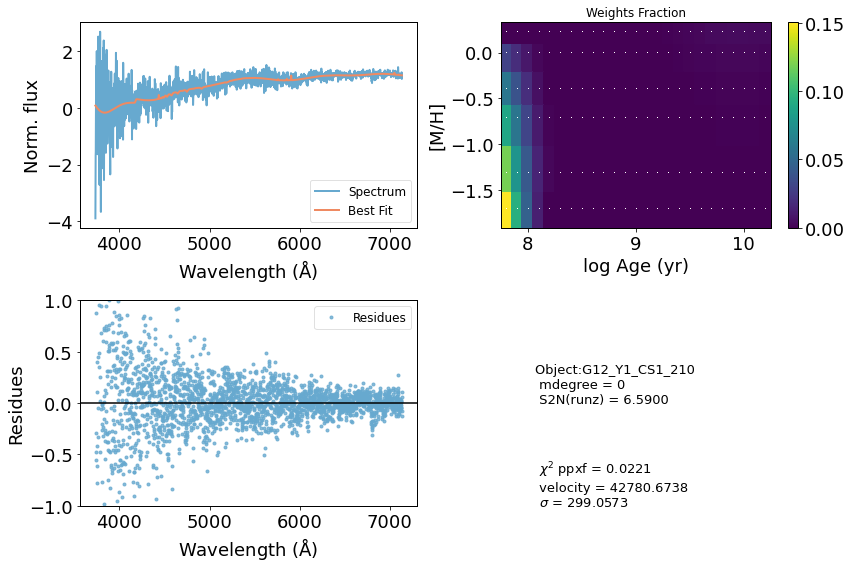

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30945       602     0.002    -0.008
 comp.  1:     30424       180
 comp.  2:     30409       122
Gas Reddening E(B-V): 7.714
chi2/DOF: 0.01392
method = capfit; Jac calls: 5; Func calls: 55; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.4   30424   180
Comp:  2       Unknown          0       5.9   30409   122
Comp:  2       Unknown      1.367       6.1   30409   122
Comp:  2       Unknown          0       3.6   30409   122
Comp:  2       Unknown     0.2207       1.7   30409   122
Comp:  2       Unknown     0.1879       1.4   30409   122
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.195
Weighted <logAge> [yr]: 9.85
Weighted <[M/

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


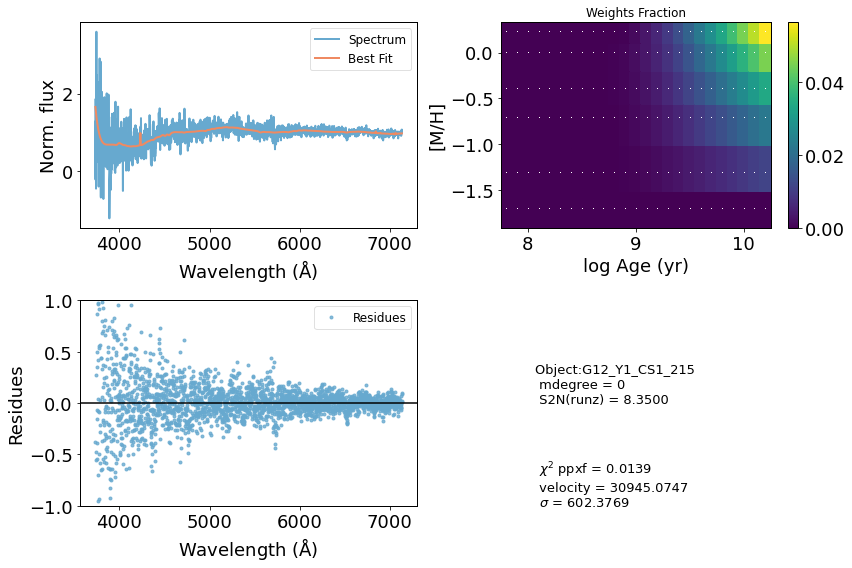

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74343        82    -0.000     0.005
 comp.  1:     75942      1000
 comp.  2:     75271       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008942
method = capfit; Jac calls: 11; Func calls: 117; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.439        12   75942  1000
Comp:  2       Unknown          0       4.3   75271   180
Comp:  2       Unknown          0       4.3   75271   180
Comp:  2       Unknown          0       2.7   75271   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.11
Weighted <[M/H]>: -0.00455
Weighted <logAge> [yr]: 8.11
Weighted <[M/H]>: -0.00455
M/L_r: 0.226
Current $\chi^2$: 0.0089
Elapsed time in PPXF: 0.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


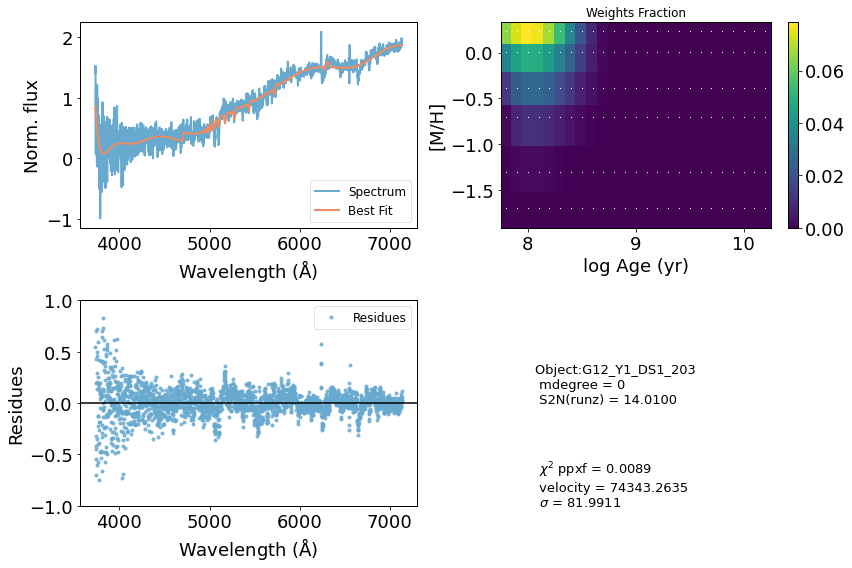

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58535       371    -0.002     0.001
 comp.  1:     58977       714
 comp.  2:     59094       141
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01581
method = capfit; Jac calls: 7; Func calls: 75; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.908       9.5   58977   714
Comp:  2       Unknown      0.451       3.7   59094   141
Comp:  2       Unknown          0       3.7   59094   141
Comp:  2       Unknown     0.4882       2.6   59094   141
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -0.185
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -0.185
M/L_r: 0.1716
Current $\chi^2$: 0.0158
Elapsed time in PPXF: 0.59 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


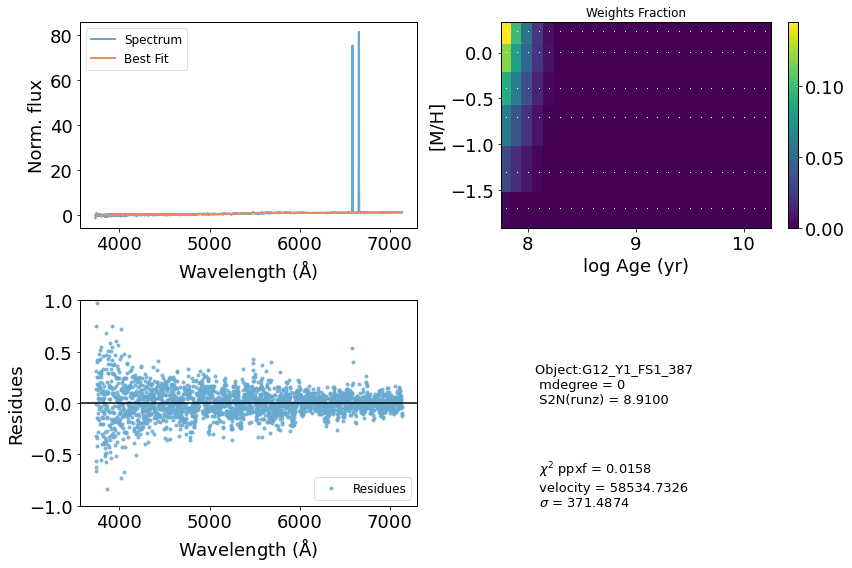

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45857         1    -0.001     0.001
 comp.  1:     46020       394
 comp.  2:     45994       142
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.0111
method = capfit; Jac calls: 7; Func calls: 77; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.246       5.2   46020   394
Comp:  2       Unknown     0.8358       5.1   45994   142
Comp:  2       Unknown          0         5   45994   142
Comp:  2       Unknown      1.319       2.9   45994   142
Comp:  2       Unknown     0.4058       1.8   45994   142
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -0.285
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -0.285
M/L_r: 0.1688
Current $\chi^2$: 0.0111
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


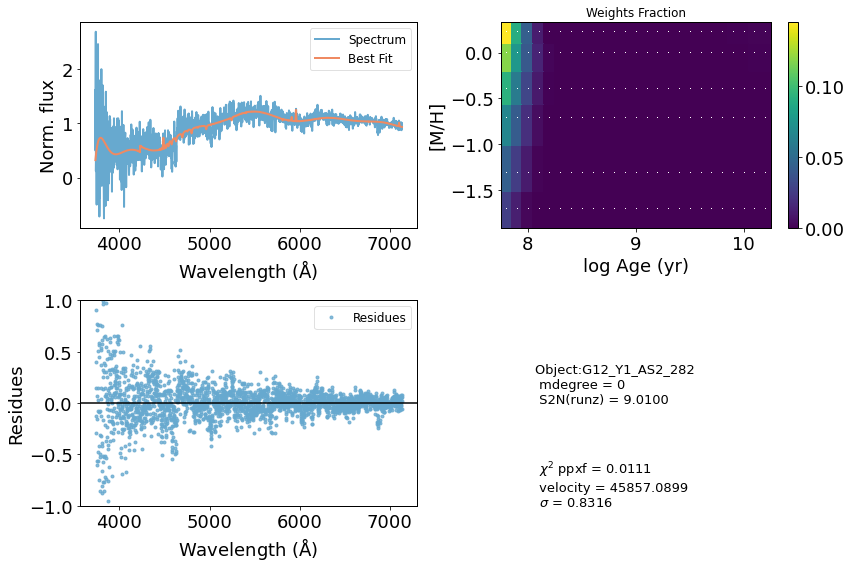

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53816       190     0.001    -0.001
 comp.  1:     53759      1000
 comp.  2:     54284       205
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006612
method = capfit; Jac calls: 10; Func calls: 107; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.769        12   53759  1000
Comp:  2       Unknown          0       6.5   54284   205
Comp:  2       Unknown      0.302       6.6   54284   205
Comp:  2       Unknown     0.5224       2.9   54284   205
---------------------------------------------------------
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -0.106
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -0.106
M/L_r: 0.1828
Current $\chi^2$: 0.0066
Elapsed time in PPXF: 0.91 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


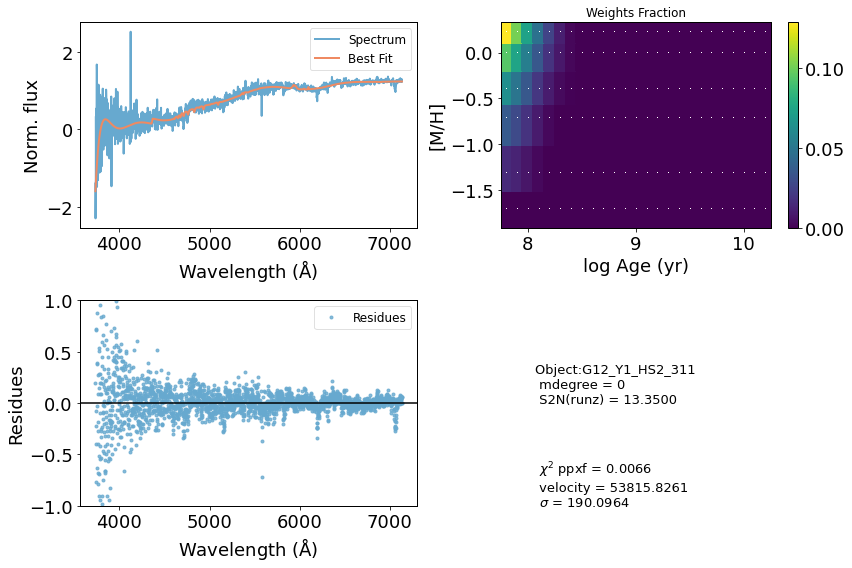

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41147      1000    -0.001    -0.000
 comp.  1:     38866       716
 comp.  2:     39097         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005798
method = capfit; Jac calls: 8; Func calls: 87; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.645       7.8   38866   716
Comp:  2       Unknown          0       2.6   39097     1
Comp:  2       Unknown          0       2.6   39097     1
Comp:  2       Unknown     0.1279         2   39097     1
Comp:  2       Unknown     0.1277       1.2   39097     1
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -0.99
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -0.99
M/L_r: 0.1593
Current $\chi^2$: 0.0058
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


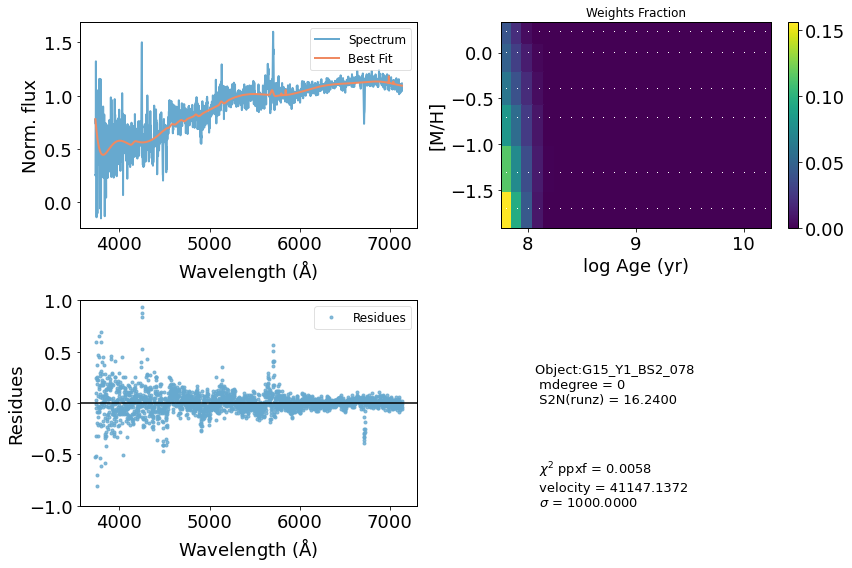

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52210       525     0.000    -0.007
 comp.  1:     52220      1000
 comp.  2:     53557      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01149
method = capfit; Jac calls: 11; Func calls: 117; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  32 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       14.5       6.8   52220  1000
Comp:  2       Unknown          0        71   53557  1000
Comp:  2       Unknown          0        71   53557  1000
Comp:  2       Unknown      2.625       5.5   53557  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.191
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.191
M/L_r: 1.59
Current $\chi^2$: 0.0115
Elapsed time in PPXF: 1.09 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


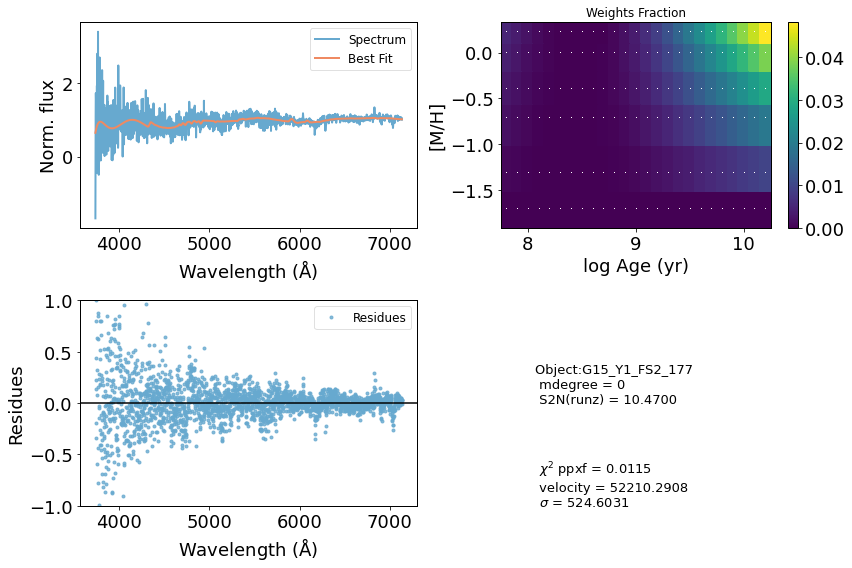

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51581       135    -0.009    -0.009
 comp.  1:     51653       180
 comp.  2:     51631       166
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02556
method = capfit; Jac calls: 1; Func calls: 16; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  14 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.9   51653   180
Comp:  2       Unknown     0.3051       6.6   51631   166
Comp:  2       Unknown      1.265       6.6   51631   166
Comp:  2       Unknown      1.008       2.4   51631   166
---------------------------------------------------------
Weighted <logAge> [yr]: 9.95
Weighted <[M/H]>: -0.187
Weighted <logAge> [yr]: 9.95
Weighted <[M/H]>: -0.187
M/L_r: 3.681
Current $\chi^2$: 0.0256
Elapsed time in PPXF: 0.15 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


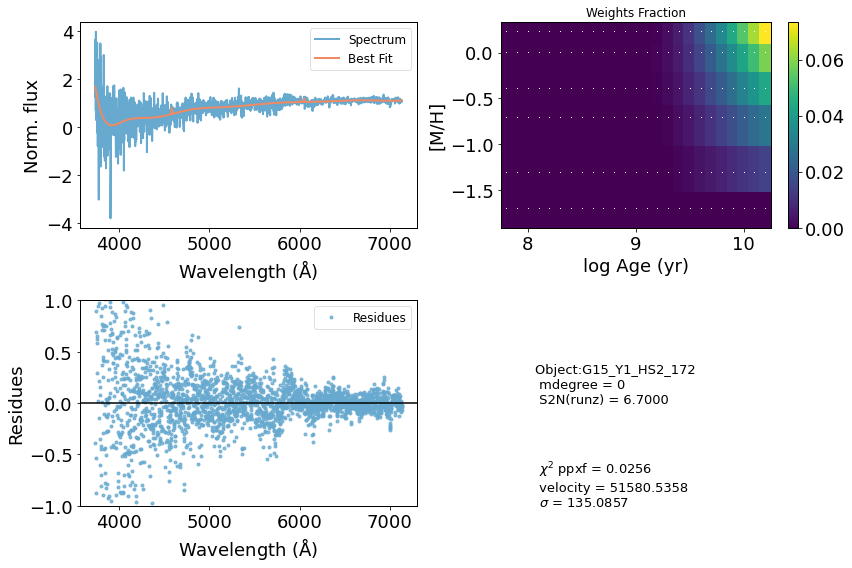

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45338        72    -0.001     0.000
 comp.  1:     45582       323
 comp.  2:     45705       166
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009828
method = capfit; Jac calls: 6; Func calls: 66; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  46 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.778       3.7   45582   323
Comp:  2       Unknown          0       8.8   45705   166
Comp:  2       Unknown      1.333         9   45705   166
Comp:  2       Unknown     0.4425       2.7   45705   166
Comp:  2       Unknown    0.02942       1.5   45705   166
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.213
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.213
M/L_r: 2.301
Current $\chi^2$: 0.0098
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


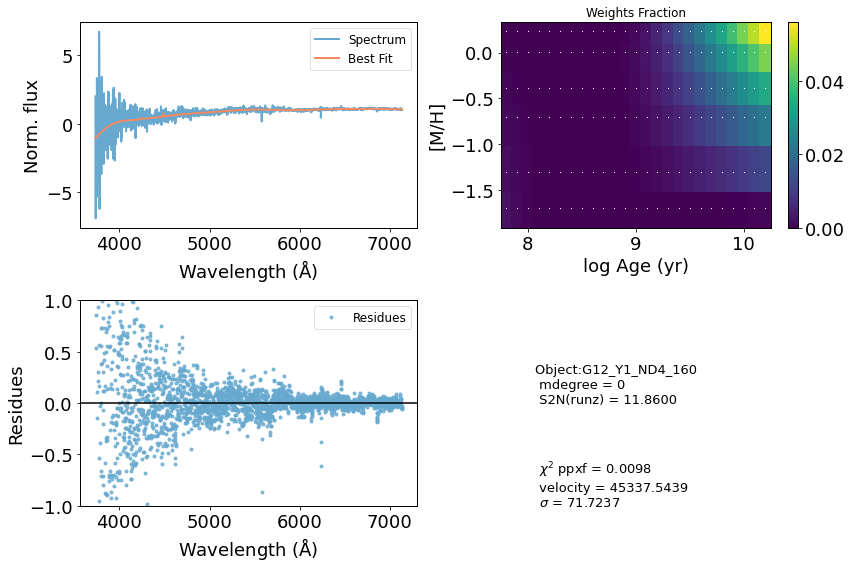

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49449       363    -0.000    -0.001
 comp.  1:     49227       212
 comp.  2:     48902       390
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01085
method = capfit; Jac calls: 6; Func calls: 67; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  12 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.524       4.1   49227   212
Comp:  2       Unknown          0        15   48902   390
Comp:  2       Unknown          0        15   48902   390
Comp:  2       Unknown     0.3583         4   48902   390
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.15
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.15
M/L_r: 0.157
Current $\chi^2$: 0.0108
Elapsed time in PPXF: 0.57 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


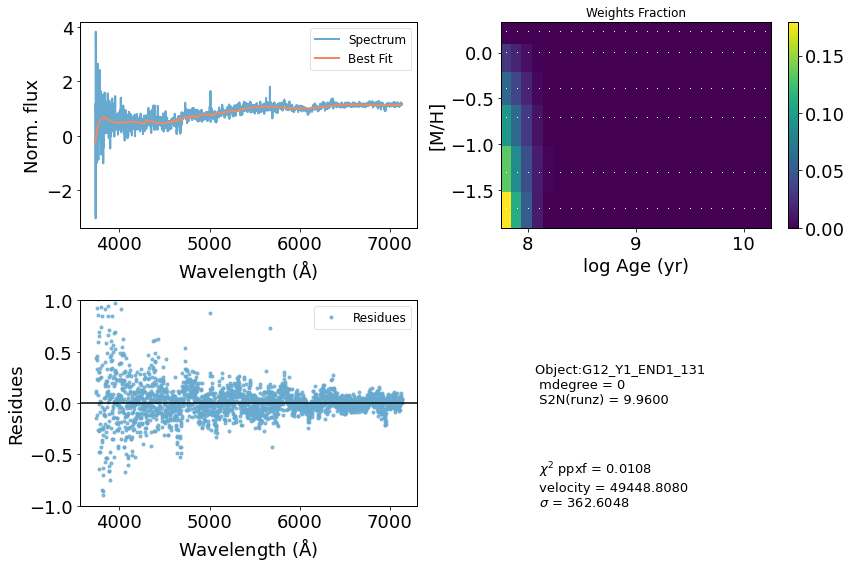

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54862       414     0.003    -0.007
 comp.  1:     55108      1000
 comp.  2:     55532       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01212
method = capfit; Jac calls: 8; Func calls: 85; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.03        11   55108  1000
Comp:  2       Unknown          0       5.1   55532   180
Comp:  2       Unknown          0         5   55532   180
Comp:  2       Unknown          0       2.4   55532   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -0.153
Weighted <logAge> [yr]: 7.93
Weighted <[M/H]>: -0.153
M/L_r: 0.1793
Current $\chi^2$: 0.0121
Elapsed time in PPXF: 0.75 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


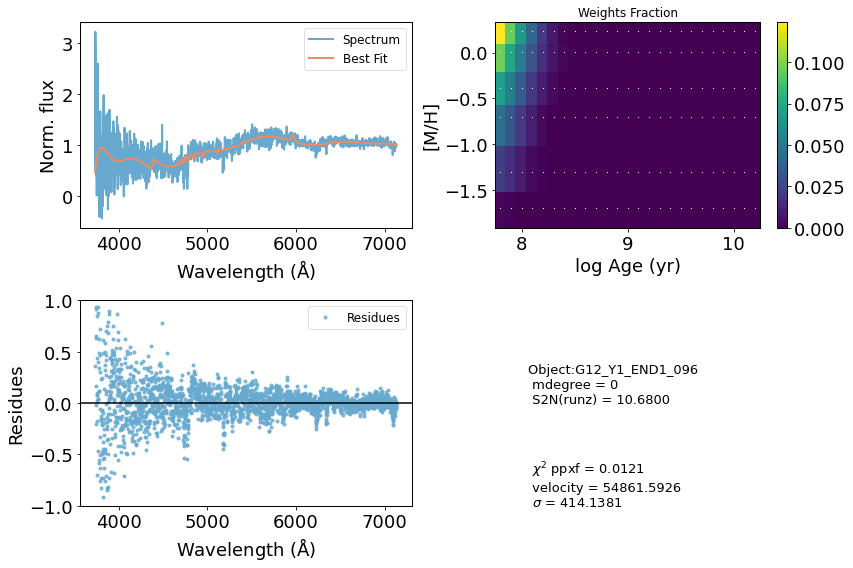

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54564       371    -0.002    -0.019
 comp.  1:     54600      1000
 comp.  2:     55010       181
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006934
method = capfit; Jac calls: 9; Func calls: 96; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.34        13   54600  1000
Comp:  2       Unknown          0       4.2   55010   181
Comp:  2       Unknown          0       4.2   55010   181
Comp:  2       Unknown    0.03291       2.9   55010   181
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -0.351
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -0.351
M/L_r: 0.1708
Current $\chi^2$: 0.0069
Elapsed time in PPXF: 0.81 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


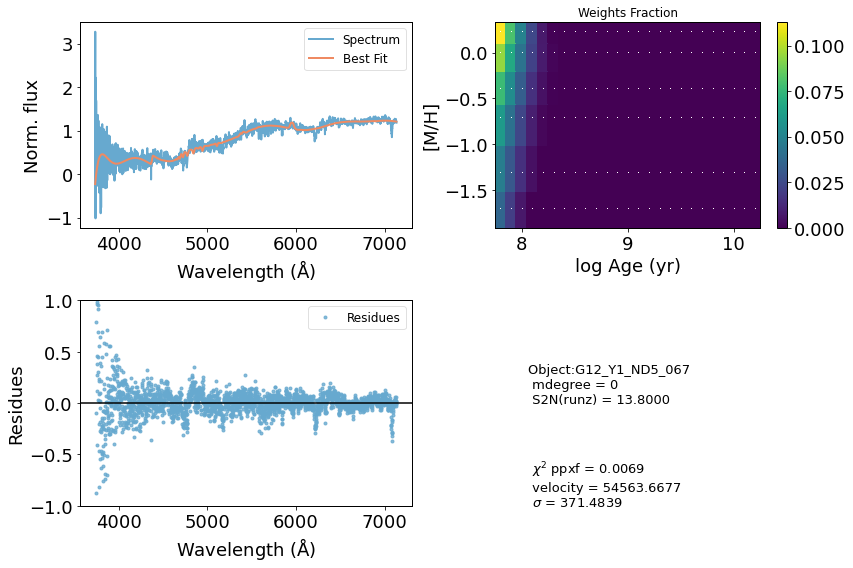

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39673         1    -0.002    -0.002
 comp.  1:     41673       179
 comp.  2:     41673       181
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009042
method = capfit; Jac calls: 1; Func calls: 18; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  11 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8738       3.1   41673   179
Comp:  2       Unknown          0        10   41673   181
Comp:  2       Unknown      1.562        10   41673   181
Comp:  2       Unknown     0.6528       3.5   41673   181
Comp:  2       Unknown          0       1.7   41673   181
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.183
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.183
M/L_r: 2.798
Current $\chi^2$: 0.0090
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


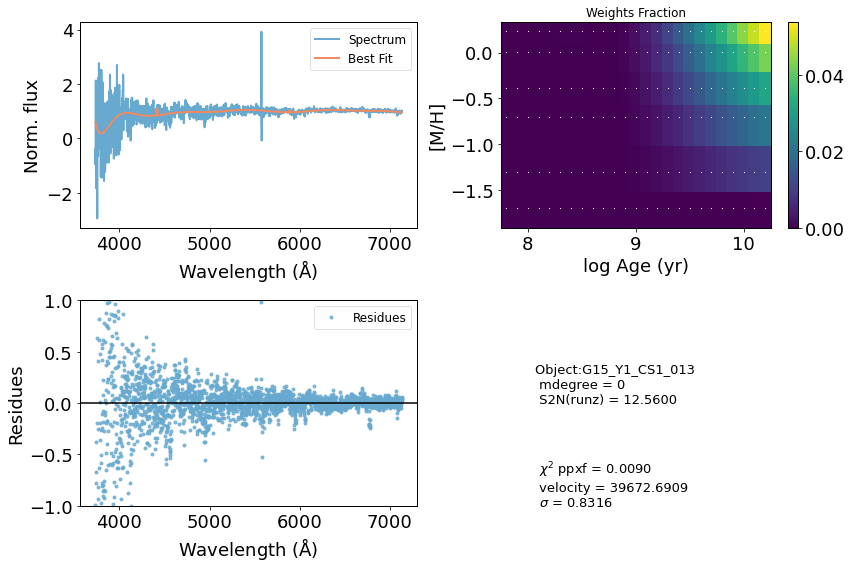

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     73983        31    -0.006    -0.005
 comp.  1:     74635       373
 comp.  2:     74456       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02753
method = capfit; Jac calls: 6; Func calls: 63; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  13 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.466       5.8   74635   373
Comp:  2       Unknown          0       4.9   74456   180
Comp:  2       Unknown          0       4.9   74456   180
Comp:  2       Unknown          0         2   74456   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: 0.0282
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: 0.0282
M/L_r: 0.2417
Current $\chi^2$: 0.0275
Elapsed time in PPXF: 0.55 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


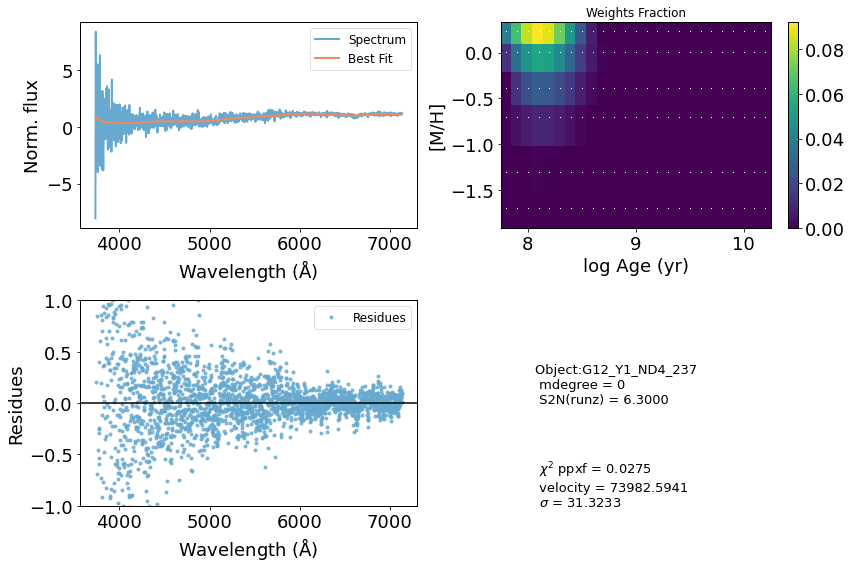

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59969       270     0.007    -0.000
 comp.  1:     60484      1000
 comp.  2:     60209      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007319
method = capfit; Jac calls: 11; Func calls: 116; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.79        11   60484  1000
Comp:  2       Unknown          0        63   60209  1000
Comp:  2       Unknown          0        63   60209  1000
Comp:  2       Unknown      3.842       5.8   60209  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -0.0933
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -0.0933
M/L_r: 0.1849
Current $\chi^2$: 0.0073
Elapsed time in PPXF: 1.06 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


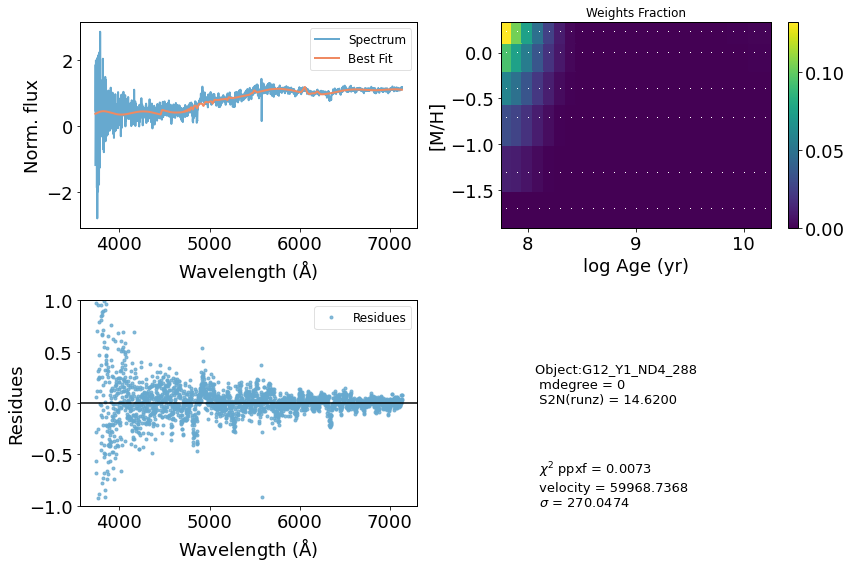

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50251         1    -0.001    -0.001
 comp.  1:     51117      1000
 comp.  2:     51594       886
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01016
method = capfit; Jac calls: 12; Func calls: 126; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.457        11   51117  1000
Comp:  2       Unknown          0        40   51594   886
Comp:  2       Unknown          0        40   51594   886
Comp:  2       Unknown      1.946       6.5   51594   886
---------------------------------------------------------
Weighted <logAge> [yr]: 8.04
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 8.04
Weighted <[M/H]>: -1.11
M/L_r: 0.1681
Current $\chi^2$: 0.0102
Elapsed time in PPXF: 0.92 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


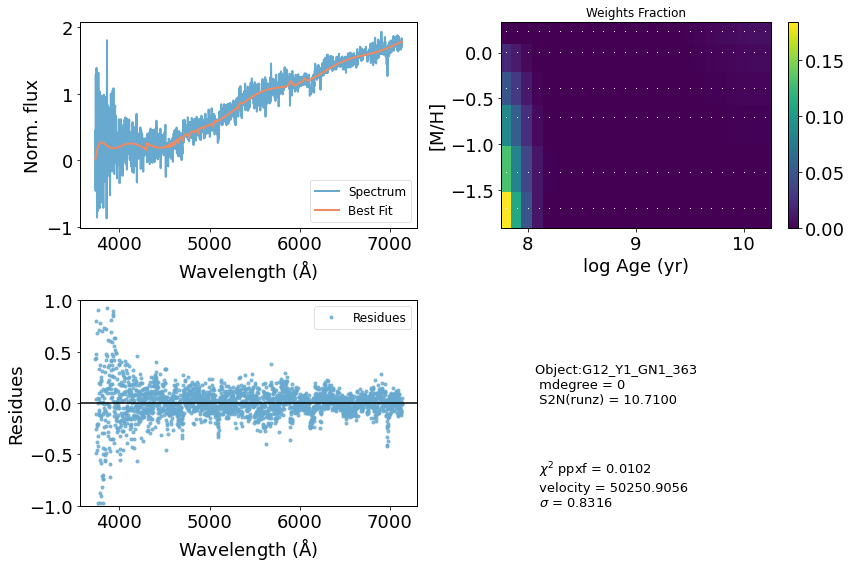

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50748       115    -0.005    -0.006
 comp.  1:     50953       180
 comp.  2:     51033        95
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01453
method = capfit; Jac calls: 4; Func calls: 46; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         4   50953   180
Comp:  2       Unknown     0.3179       3.2   51033    95
Comp:  2       Unknown          0       3.2   51033    95
Comp:  2       Unknown    0.03165       2.2   51033    95
---------------------------------------------------------
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.241
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.241
M/L_r: 1.555
Current $\chi^2$: 0.0145
Elapsed time in PPXF: 0.40 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


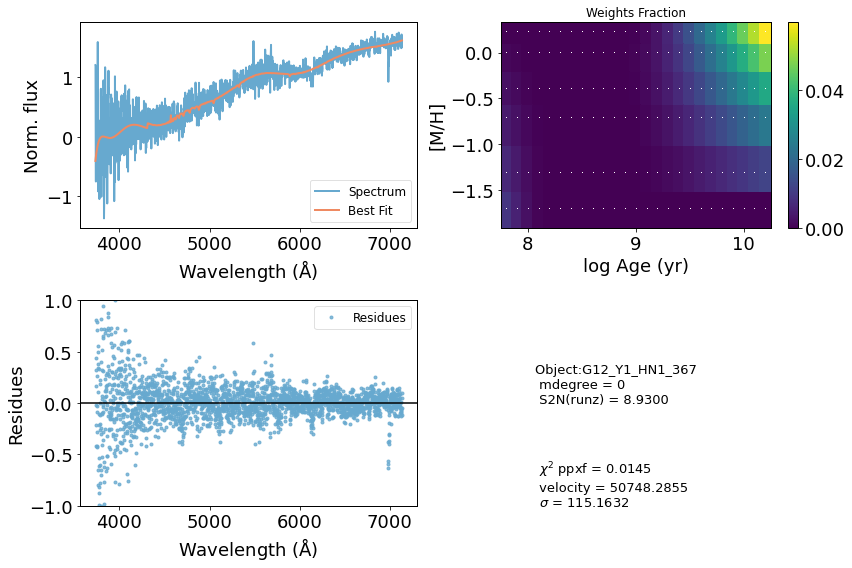

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     67673       100     0.003     0.001
 comp.  1:     68589        53
 comp.  2:     68695        42
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01942
method = capfit; Jac calls: 15; Func calls: 154; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  13 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4988       2.7   68589    53
Comp:  2       Unknown     0.3265       2.2   68695    42
Comp:  2       Unknown          0       2.2   68695    42
Comp:  2       Unknown     0.2659       1.5   68695    42
---------------------------------------------------------
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -0.00709
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -0.00709
M/L_r: 0.1881
Current $\chi^2$: 0.0194
Elapsed time in PPXF: 1.36 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


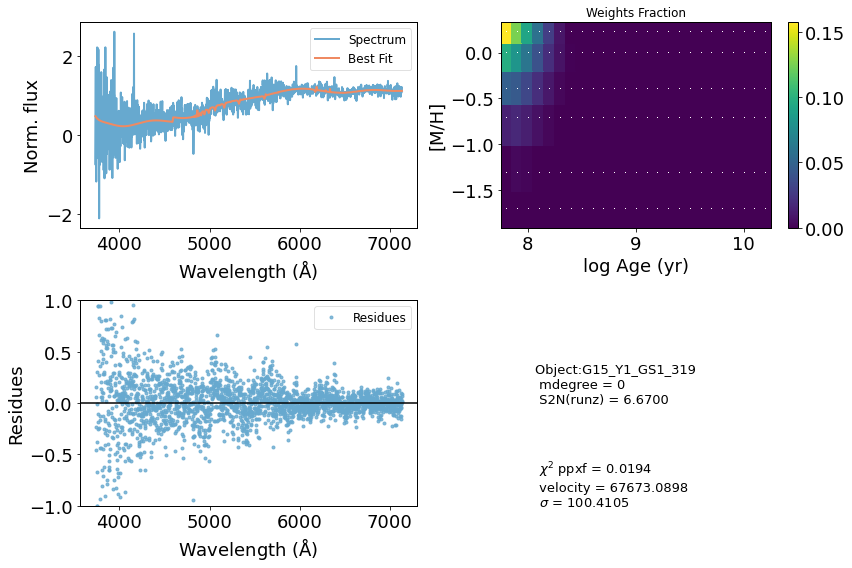

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     65920      1000     0.113     0.082
 comp.  1:     65125       724
 comp.  2:     65920      1000
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.07712
method = capfit; Jac calls: 26; Func calls: 264; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.102       3.5   65125   724
Comp:  2       Unknown          0        55   65920  1000
Comp:  2       Unknown      27.31        55   65920  1000
Comp:  2       Unknown          0       4.8   65920  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.853
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.853
M/L_r: 2.087
Current $\chi^2$: 0.0771
Elapsed time in PPXF: 2.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


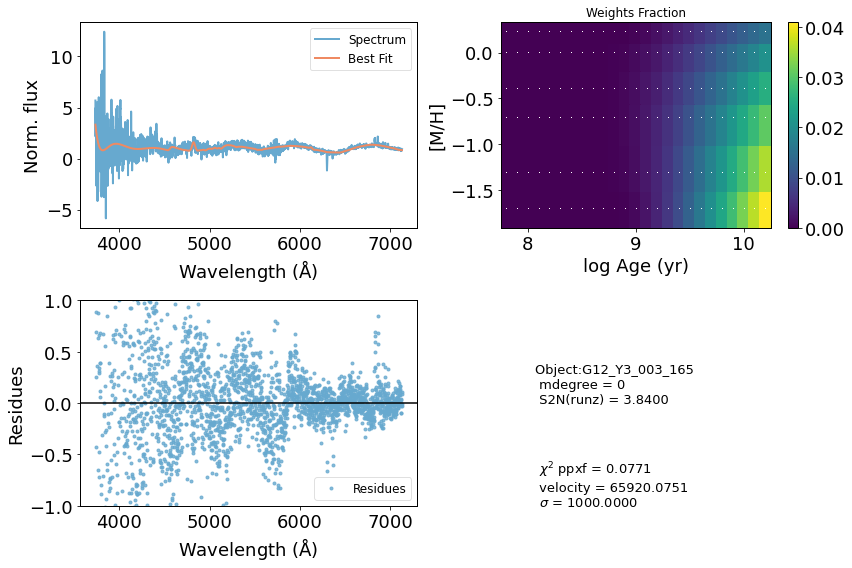

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47168         1     0.001     0.001
 comp.  1:     47667      1000
 comp.  2:     46777       418
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006628
method = capfit; Jac calls: 10; Func calls: 106; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.458       9.1   47667  1000
Comp:  2       Unknown          0        16   46777   418
Comp:  2       Unknown          0        16   46777   418
Comp:  2       Unknown     0.8538       4.5   46777   418
Comp:  2       Unknown     0.6051       3.3   46777   418
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.21
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.21
M/L_r: 0.1571
Current $\chi^2$: 0.0066
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


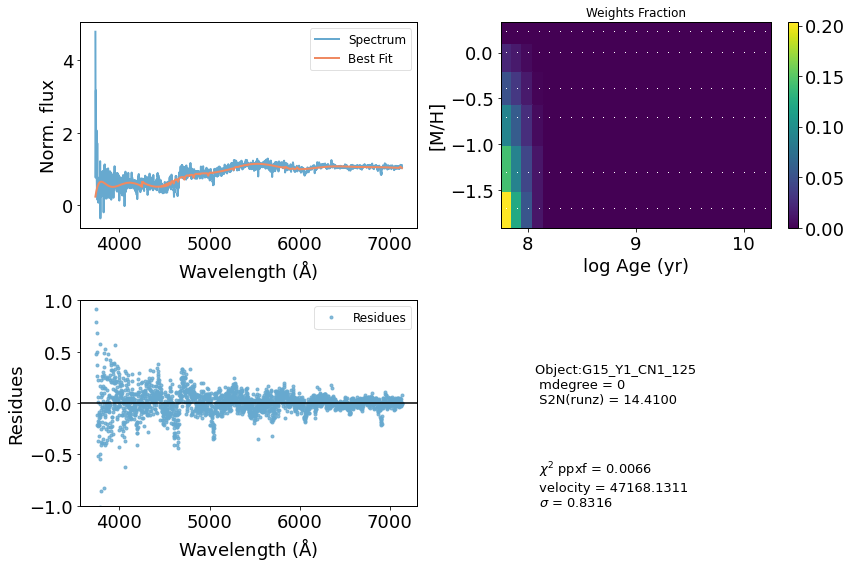

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37052      1000     0.003    -0.008
 comp.  1:     35077       382
 comp.  2:     34932       125
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007178
method = capfit; Jac calls: 4; Func calls: 48; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  12 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1606       5.3   35077   382
Comp:  2       Unknown          0       4.5   34932   125
Comp:  2       Unknown          0       4.5   34932   125
Comp:  2       Unknown      0.758       3.5   34932   125
Comp:  2       Unknown          0       2.2   34932   125
Comp:  2       Unknown          0         2   34932   125
---------------------------------------------------------
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -0.835
Weighted <logAge> [yr]: 7.88
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


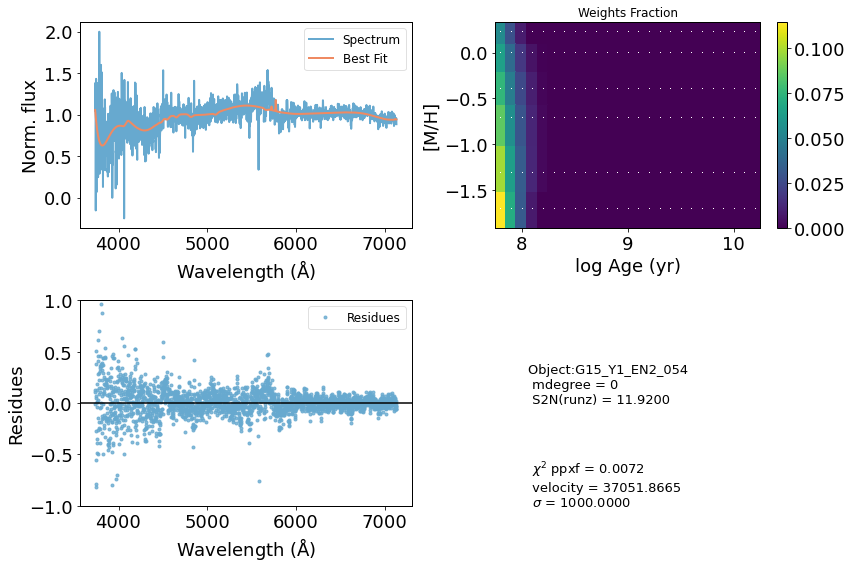

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39373       180     0.000     0.000
 comp.  1:     39373       180
 comp.  2:     39373       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005756
method = capfit; Jac calls: 1; Func calls: 18; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2399       3.9   39373   180
Comp:  2       Unknown          0       5.3   39373   180
Comp:  2       Unknown          0       5.4   39373   180
Comp:  2       Unknown          0       3.5   39373   180
Comp:  2       Unknown     0.1483       2.2   39373   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.82
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.82
Weighted <[M/H]>: -1.71
M/L_r: 0.1668
Current $\chi^2$: 0.0058
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


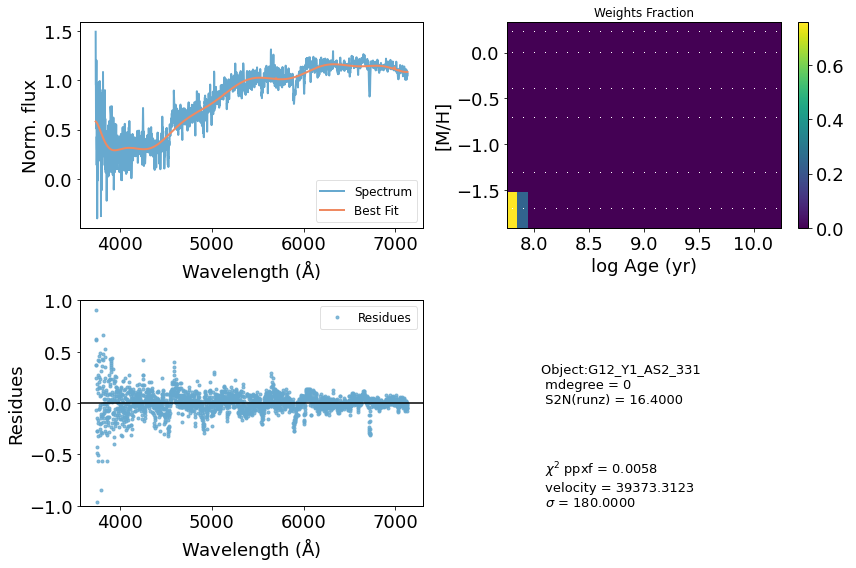

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49800       180     0.000     0.000
 comp.  1:     49800       180
 comp.  2:     49800       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00657
method = capfit; Jac calls: 1; Func calls: 18; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  8 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.056         5   49800   180
Comp:  2       Unknown     0.1338         5   49800   180
Comp:  2       Unknown          0       4.9   49800   180
Comp:  2       Unknown     0.1896       3.1   49800   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.21
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.21
M/L_r: 0.1593
Current $\chi^2$: 0.0066
Elapsed time in PPXF: 0.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


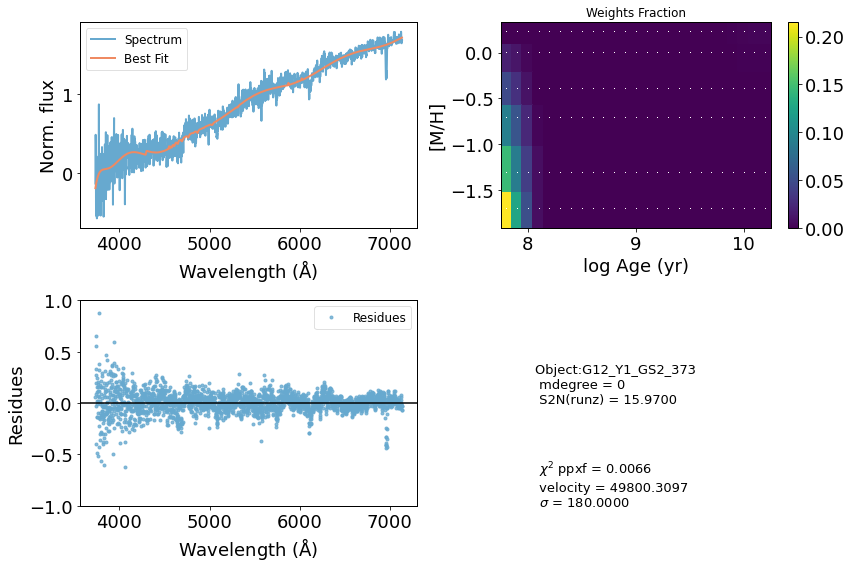

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53117       380    -0.001    -0.003
 comp.  1:     53050      1000
 comp.  2:     54198        15
Gas Reddening E(B-V): 0.562
chi2/DOF: 0.01236
method = capfit; Jac calls: 15; Func calls: 158; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.726       7.8   53050  1000
Comp:  2       Unknown          0       2.3   54198    15
Comp:  2       Unknown     0.3353       2.4   54198    15
Comp:  2       Unknown     0.2409       1.4   54198    15
---------------------------------------------------------
Weighted <logAge> [yr]: 8.01
Weighted <[M/H]>: -0.0574
Weighted <logAge> [yr]: 8.01
Weighted <[M/H]>: -0.0574
M/L_r: 0.1988
Current $\chi^2$: 0.0124
Elapsed time in PPXF: 1.52 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


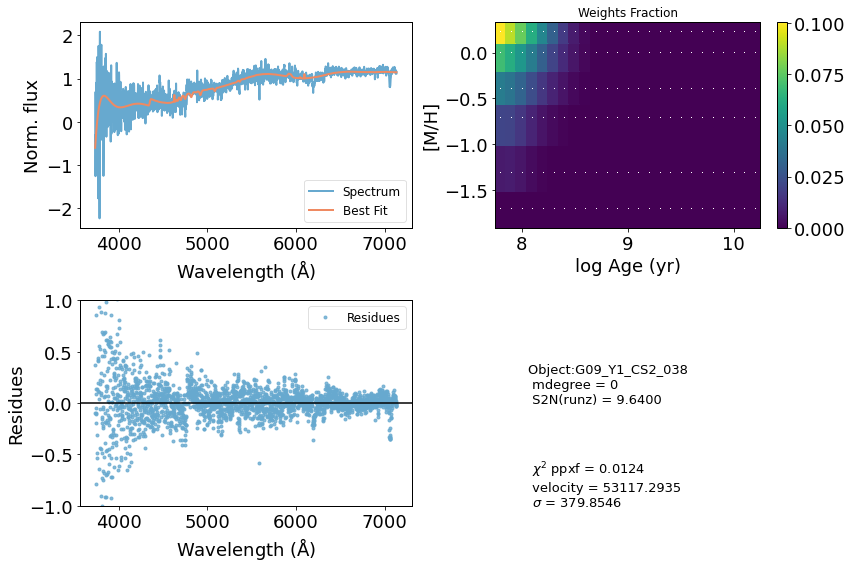

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47344         1    -0.001     0.001
 comp.  1:     47325       126
 comp.  2:     47550        14
Gas Reddening E(B-V): 0.067
chi2/DOF: 0.007311
method = capfit; Jac calls: 6; Func calls: 67; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  10 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1929         4   47325   126
Comp:  2       Unknown          0       2.2   47550    14
Comp:  2       Unknown    0.02936       2.2   47550    14
Comp:  2       Unknown          0       1.8   47550    14
Comp:  2       Unknown     0.1877       1.4   47550    14
---------------------------------------------------------
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.21
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.21
M/L_r: 0.1576
Current $\chi^2$: 0.0073
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


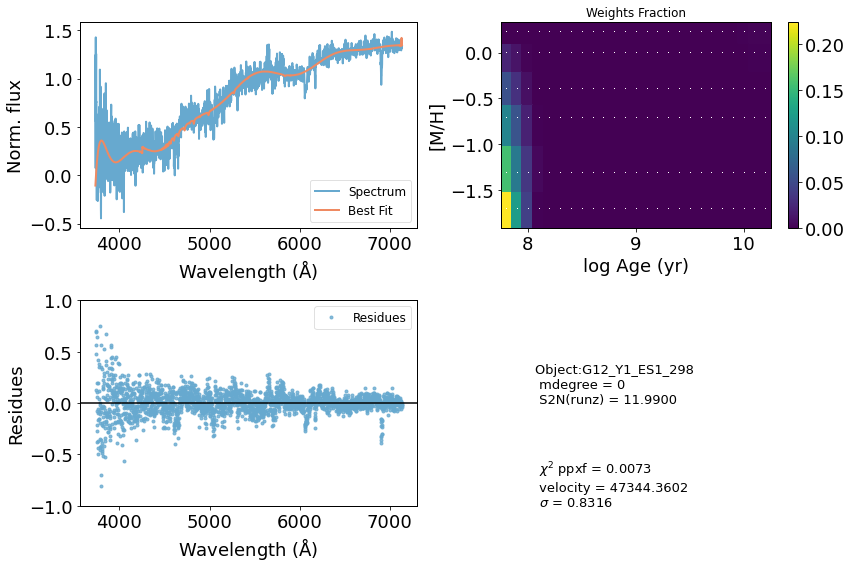

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46397         1    -0.001    -0.003
 comp.  1:     46524        46
 comp.  2:     46500         1
Gas Reddening E(B-V): 1.070
chi2/DOF: 0.01786
method = capfit; Jac calls: 7; Func calls: 75; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8599         2   46524    46
Comp:  2       Unknown   0.008131       2.7   46500     1
Comp:  2       Unknown    0.08398       2.7   46500     1
Comp:  2       Unknown          0       1.5   46500     1
Comp:  2       Unknown     0.1762         1   46500     1
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.15
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.15
M/L_r: 0.1585
Current $\chi^2$: 0.0179
Elapsed tim

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


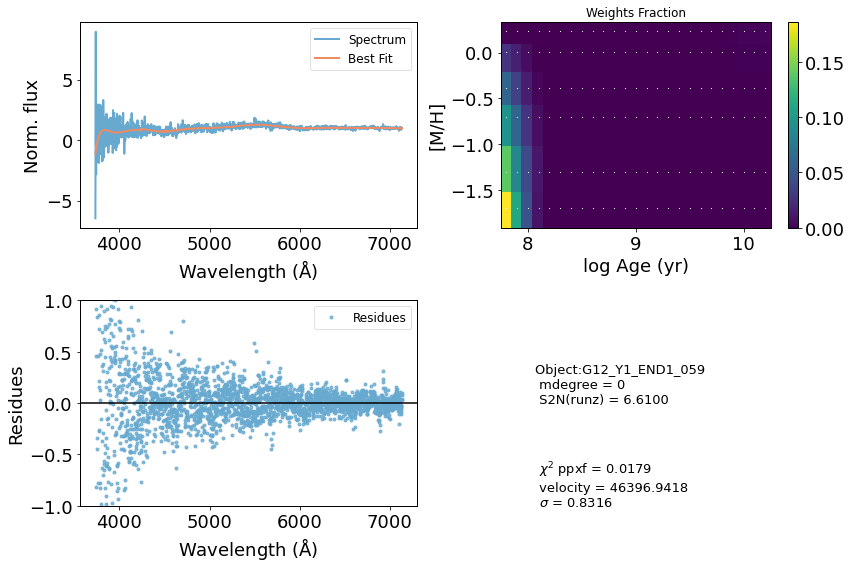

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42741       222     0.001     0.000
 comp.  1:     42696      1000
 comp.  2:     42382        79
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005882
method = capfit; Jac calls: 10; Func calls: 107; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       4.81       9.2   42696  1000
Comp:  2       Unknown          0       3.4   42382    79
Comp:  2       Unknown          0       3.5   42382    79
Comp:  2       Unknown          0       2.6   42382    79
Comp:  2       Unknown     0.2105       1.5   42382    79
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.3
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.3
M/L_r: 0.1575
Current $\chi^2$: 0.0059
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


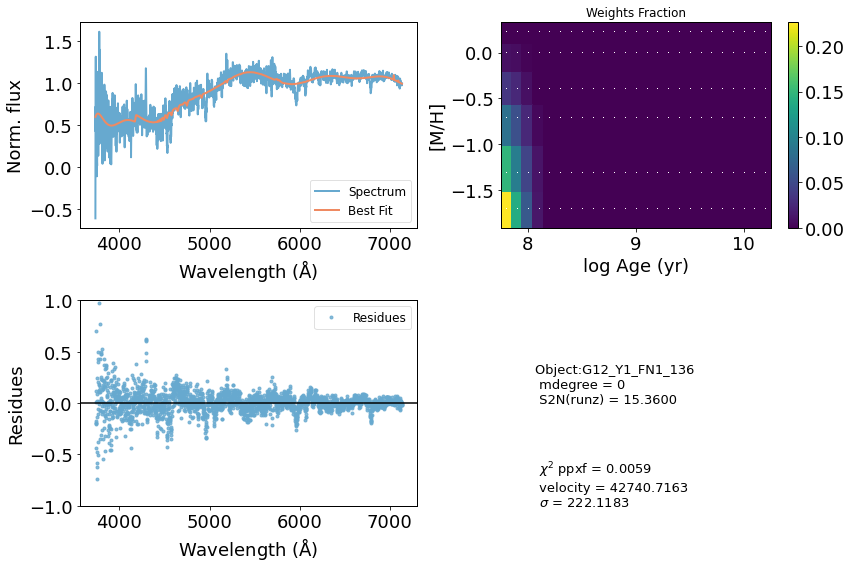

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34112       180     0.000     0.000
 comp.  1:     34112       180
 comp.  2:     34112       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005688
method = capfit; Jac calls: 1; Func calls: 16; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1468       3.1   34112   180
Comp:  2       Unknown          0       7.1   34112   180
Comp:  2       Unknown          0         7   34112   180
Comp:  2       Unknown          0       3.6   34112   180
Comp:  2       Unknown          0       2.2   34112   180
Comp:  2       Unknown          0         2   34112   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>:

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide


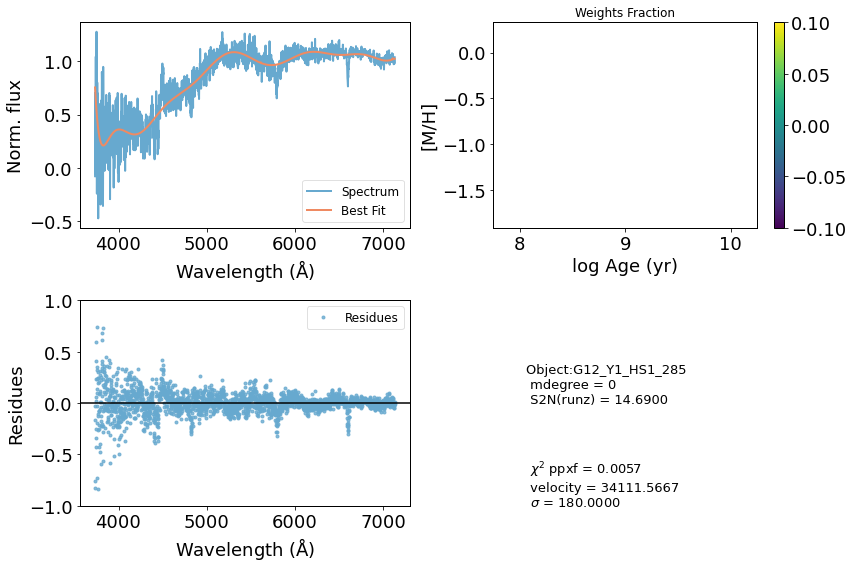

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39186       934     0.004    -0.003
 comp.  1:     37433       219
 comp.  2:     37448       232
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03631
method = capfit; Jac calls: 5; Func calls: 57; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  11 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.211       2.8   37433   219
Comp:  2       Unknown          0        11   37448   232
Comp:  2       Unknown          0        11   37448   232
Comp:  2       Unknown          0       3.7   37448   232
Comp:  2       Unknown     0.5079       1.8   37448   232
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.17
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.17
M/L_r: 0.1582
Current $\chi^2$: 0.0363
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


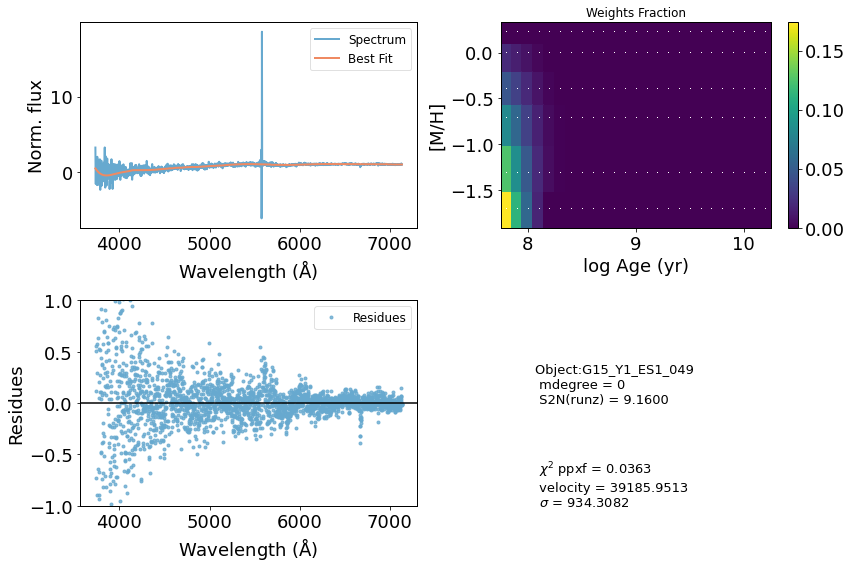

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68190       252    -0.004    -0.019
 comp.  1:     68627      1000
 comp.  2:     70784      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00606
method = capfit; Jac calls: 21; Func calls: 215; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.109        12   68627  1000
Comp:  2       Unknown          0        42   70784  1000
Comp:  2       Unknown     0.1851        42   70784  1000
Comp:  2       Unknown      5.713       7.1   70784  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 8.18
Weighted <[M/H]>: -0.0506
Weighted <logAge> [yr]: 8.18
Weighted <[M/H]>: -0.0506
M/L_r: 0.2396
Current $\chi^2$: 0.0061
Elapsed time in PPXF: 1.74 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


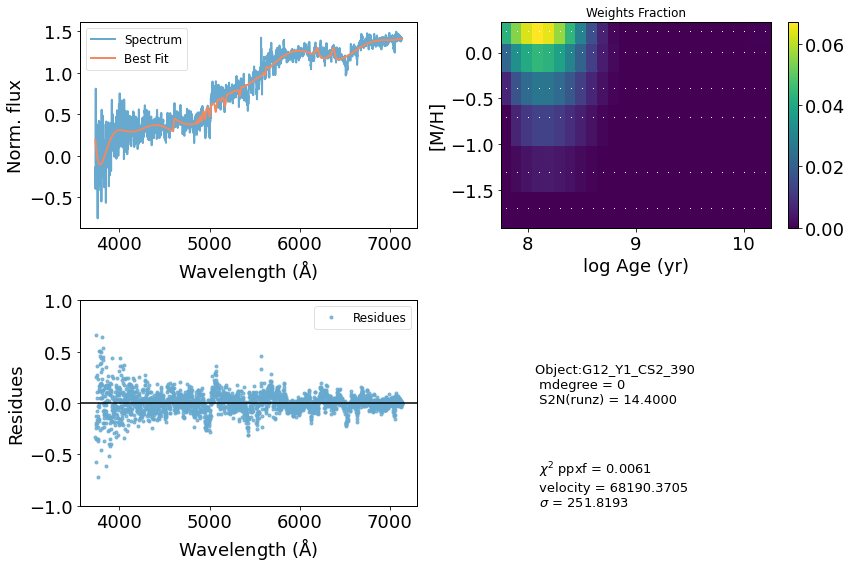

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     65128       289     0.003    -0.002
 comp.  1:     65858       183
 comp.  2:     66654      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.0089
method = capfit; Jac calls: 10; Func calls: 107; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  18 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.482       4.6   65858   183
Comp:  2       Unknown          0        51   66654  1000
Comp:  2       Unknown          0        51   66654  1000
Comp:  2       Unknown      3.457         6   66654  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.176
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.176
M/L_r: 1.228
Current $\chi^2$: 0.0089
Elapsed time in PPXF: 0.91 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


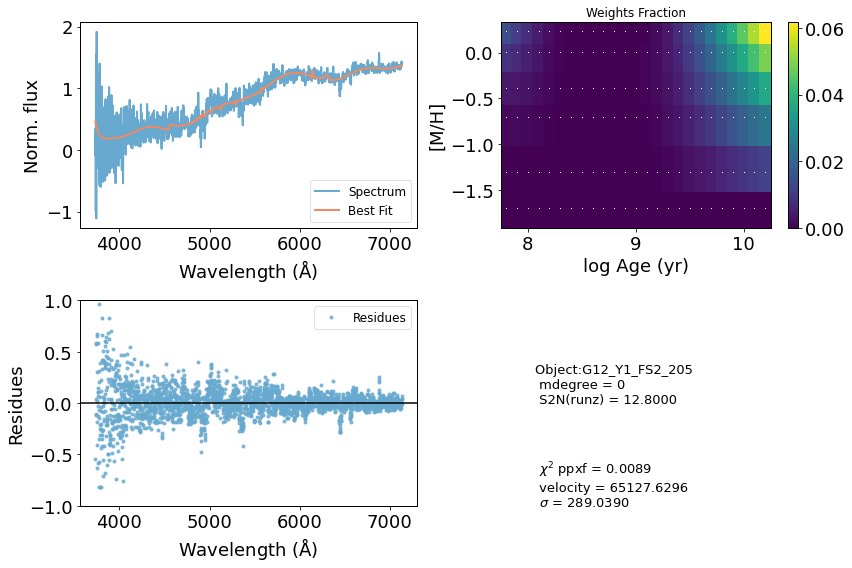

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64068       174     0.001    -0.001
 comp.  1:     65004      1000
 comp.  2:     64436      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007854
method = capfit; Jac calls: 11; Func calls: 117; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.039        11   65004  1000
Comp:  2       Unknown          0        45   64436  1000
Comp:  2       Unknown     0.7507        45   64436  1000
Comp:  2       Unknown      4.237       6.7   64436  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -0.168
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -0.168
M/L_r: 1.076
Current $\chi^2$: 0.0079
Elapsed time in PPXF: 0.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


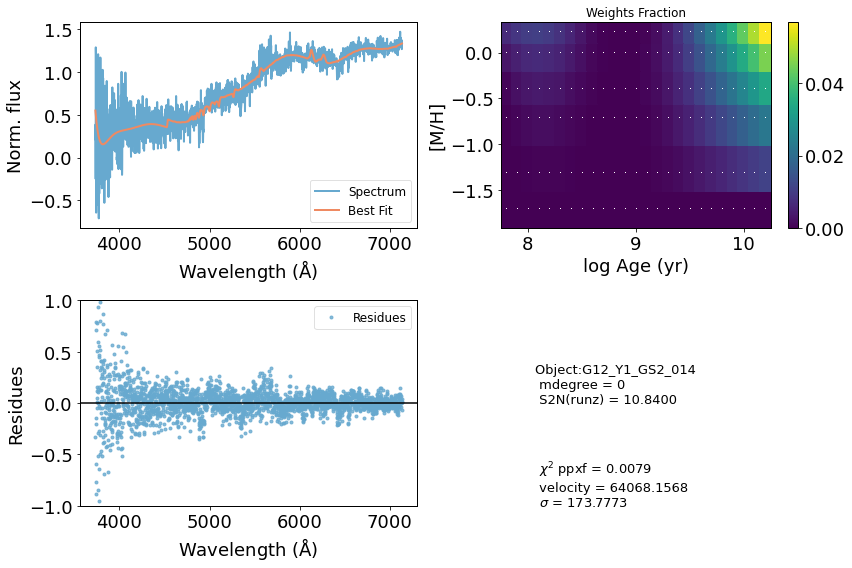

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47868       100    -0.000    -0.000
 comp.  1:     47977       234
 comp.  2:     47829       271
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009471
method = capfit; Jac calls: 7; Func calls: 77; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  11 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7784       4.3   47977   234
Comp:  2       Unknown          0       9.4   47829   271
Comp:  2       Unknown          0       9.3   47829   271
Comp:  2       Unknown     0.1403       3.4   47829   271
Comp:  2       Unknown     0.4653       2.3   47829   271
---------------------------------------------------------
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -1.13
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -1.13
M/L_r: 0.161
Current $\chi^2$: 0.0095
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


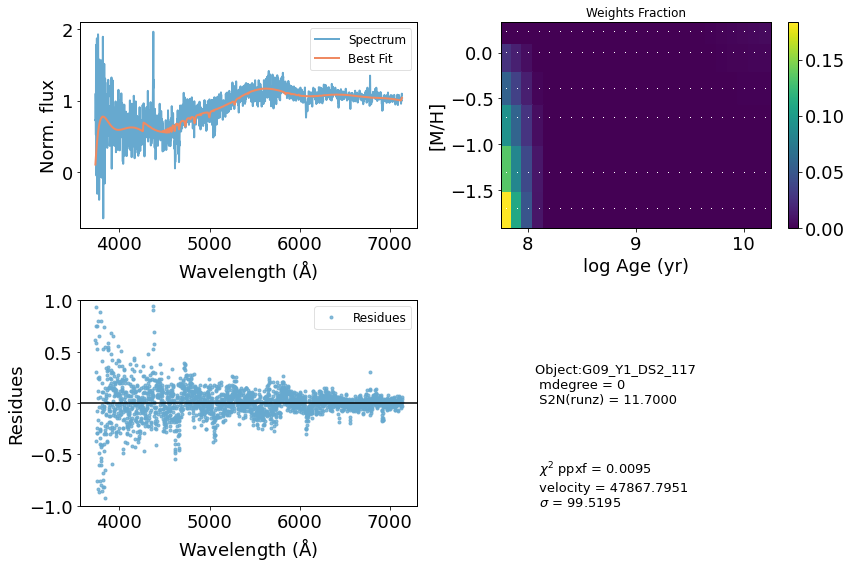

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50048       225    -0.001     0.001
 comp.  1:     50073      1000
 comp.  2:     50171       393
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006736
method = capfit; Jac calls: 8; Func calls: 88; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.136        10   50073  1000
Comp:  2       Unknown          0        12   50171   393
Comp:  2       Unknown          0        11   50171   393
Comp:  2       Unknown      1.202       4.6   50171   393
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.18
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.18
M/L_r: 0.1571
Current $\chi^2$: 0.0067
Elapsed time in PPXF: 0.61 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


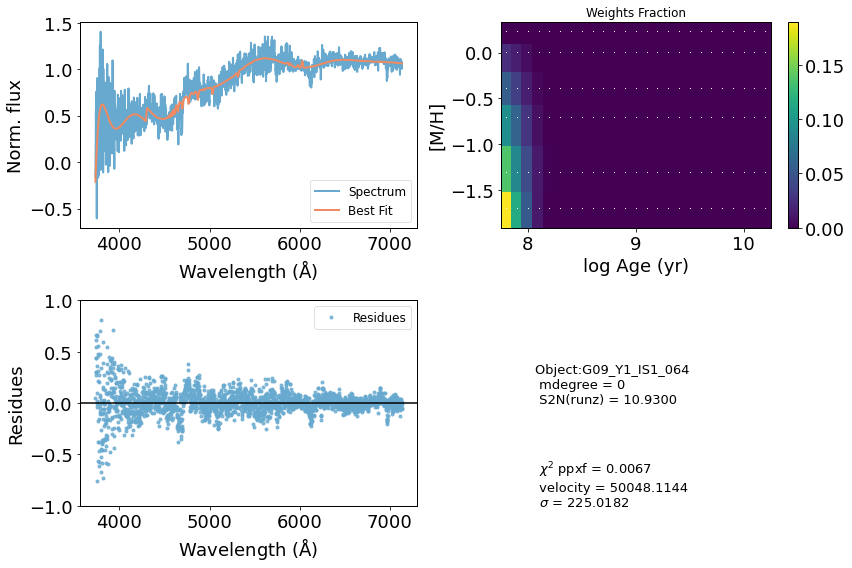

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     63247       381     0.004    -0.005
 comp.  1:     63656       299
 comp.  2:     64173       567
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008141
method = capfit; Jac calls: 9; Func calls: 99; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.282       6.4   63656   299
Comp:  2       Unknown          0        18   64173   567
Comp:  2       Unknown     0.2578        18   64173   567
Comp:  2       Unknown        1.6       5.7   64173   567
---------------------------------------------------------
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -0.0999
Weighted <logAge> [yr]: 7.94
Weighted <[M/H]>: -0.0999
M/L_r: 0.1829
Current $\chi^2$: 0.0081
Elapsed time in PPXF: 0.68 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


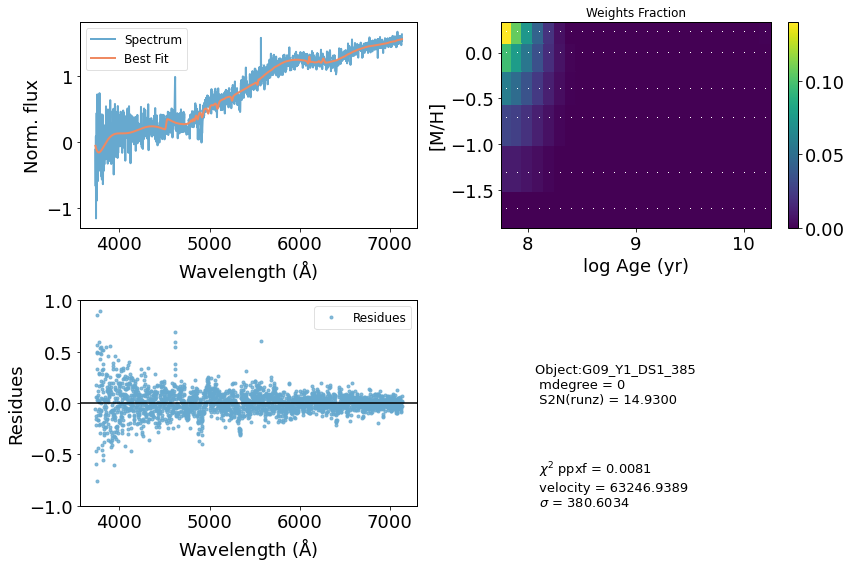

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59807       168     0.001    -0.000
 comp.  1:     60019       198
 comp.  2:     60190       190
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02228
method = capfit; Jac calls: 5; Func calls: 56; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  50 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.376         5   60019   198
Comp:  2       Unknown          0       4.8   60190   190
Comp:  2       Unknown     0.2284       4.8   60190   190
Comp:  2       Unknown      1.379       2.9   60190   190
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.192
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.192
M/L_r: 2.291
Current $\chi^2$: 0.0223
Elapsed time in PPXF: 0.44 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


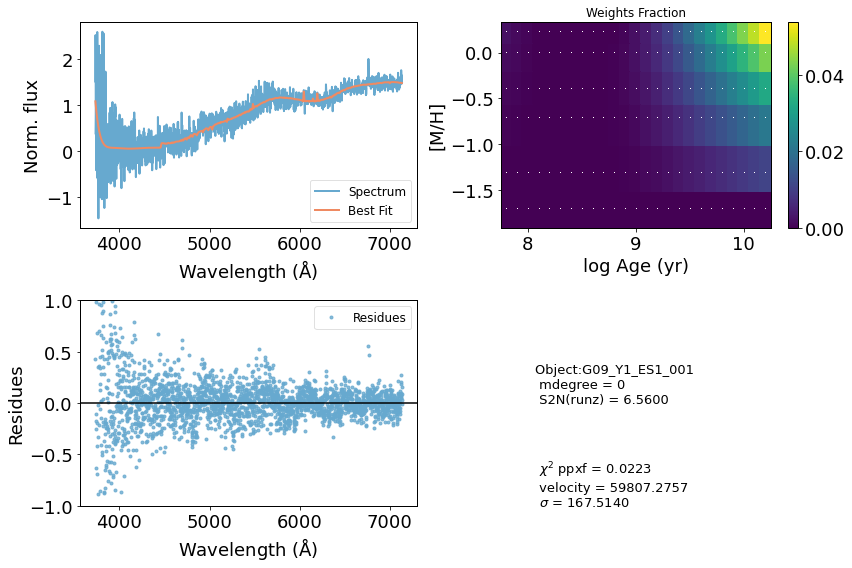

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37981       919     0.014    -0.055
 comp.  1:     35962       117
 comp.  2:     36302       158
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01761
method = capfit; Jac calls: 7; Func calls: 75; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  15 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8692       2.8   35962   117
Comp:  2       Unknown     0.2505       5.9   36302   158
Comp:  2       Unknown    0.02975       6.1   36302   158
Comp:  2       Unknown     0.5079       3.4   36302   158
Comp:  2       Unknown     0.2986       2.2   36302   158
---------------------------------------------------------
Weighted <logAge> [yr]: 8.3
Weighted <[M/H]>: -1.19
Weighted <logAge> [yr]: 8.3
Weighted <[M/H]>: -1.19
M/L_r: 0.1999
Current $\chi^2$: 0.0176
Elapsed ti

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


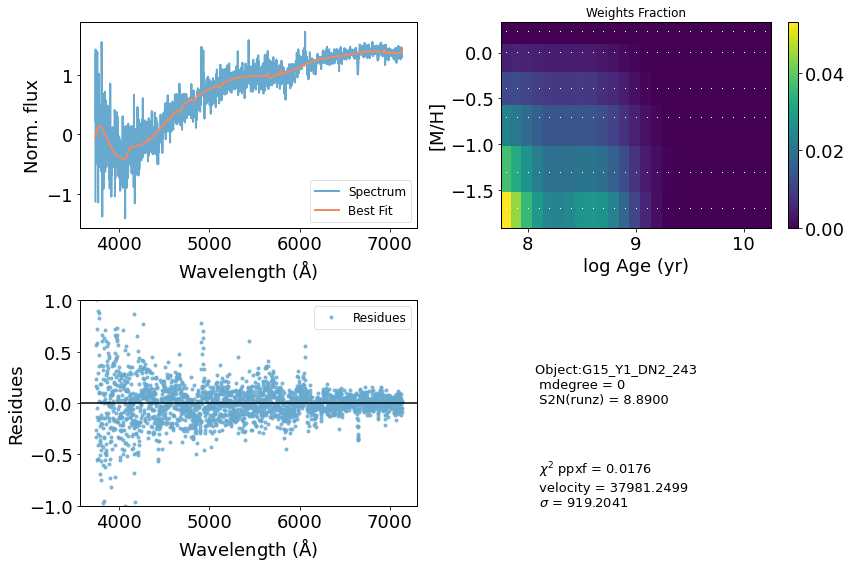

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33998         1     0.001    -0.002
 comp.  1:     33184       758
 comp.  2:     33811        59
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00554
method = capfit; Jac calls: 11; Func calls: 115; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  45 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.117       7.4   33184   758
Comp:  2       Unknown          0       3.4   33811    59
Comp:  2       Unknown          0       3.3   33811    59
Comp:  2       Unknown    0.08734       2.4   33811    59
Comp:  2       Unknown      0.153       1.6   33811    59
Comp:  2       Unknown     0.1846       1.5   33811    59
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.192
Weighted <logAge> [yr]: 9.87
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


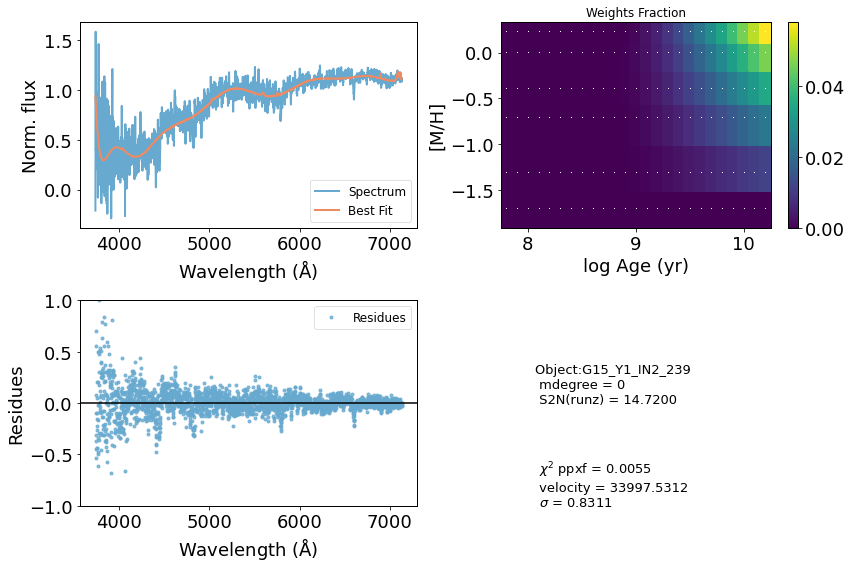

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38939       180     0.000     0.000
 comp.  1:     38939       180
 comp.  2:     38939       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08148
method = capfit; Jac calls: 1; Func calls: 18; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.334       2.9   38939   180
Comp:  2       Unknown          0       6.7   38939   180
Comp:  2       Unknown          0       6.7   38939   180
Comp:  2       Unknown      0.255       3.6   38939   180
Comp:  2       Unknown          0       1.7   38939   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.85
Weighted <[M/H]>: -1.65
Weighted <logAge> [yr]: 7.85
Weighted <[M/H]>: -1.65
M/L_r: 0.1672
Current $\chi^2$: 0.0815
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


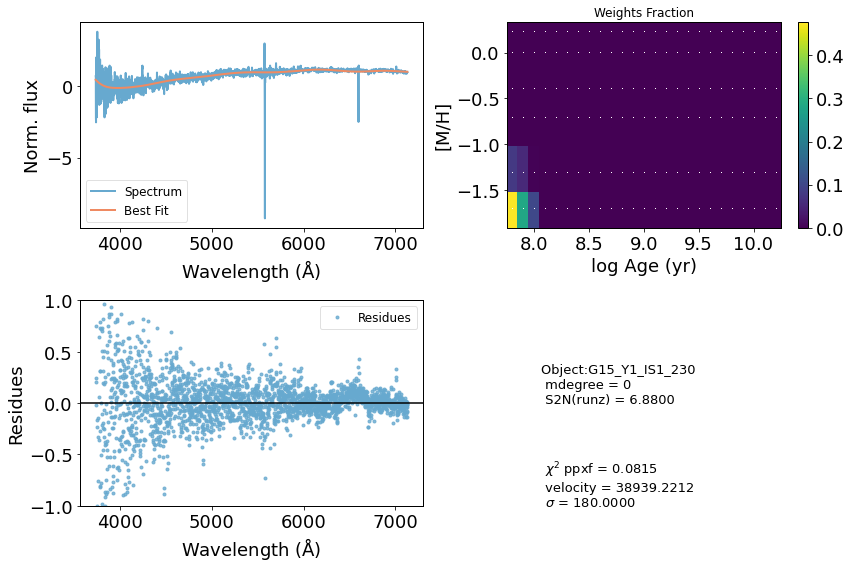

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45645       139    -0.003     0.003
 comp.  1:     46140      1000
 comp.  2:     46065       172
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004761
method = capfit; Jac calls: 10; Func calls: 106; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  23 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.681        11   46140  1000
Comp:  2       Unknown     0.4037       4.8   46065   172
Comp:  2       Unknown          0       4.7   46065   172
Comp:  2       Unknown     0.8721       3.3   46065   172
Comp:  2       Unknown          0       2.4   46065   172
---------------------------------------------------------
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -0.179
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -0.179
M/L_r: 1.131
Current $\chi^2$: 0.0048
Ela

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


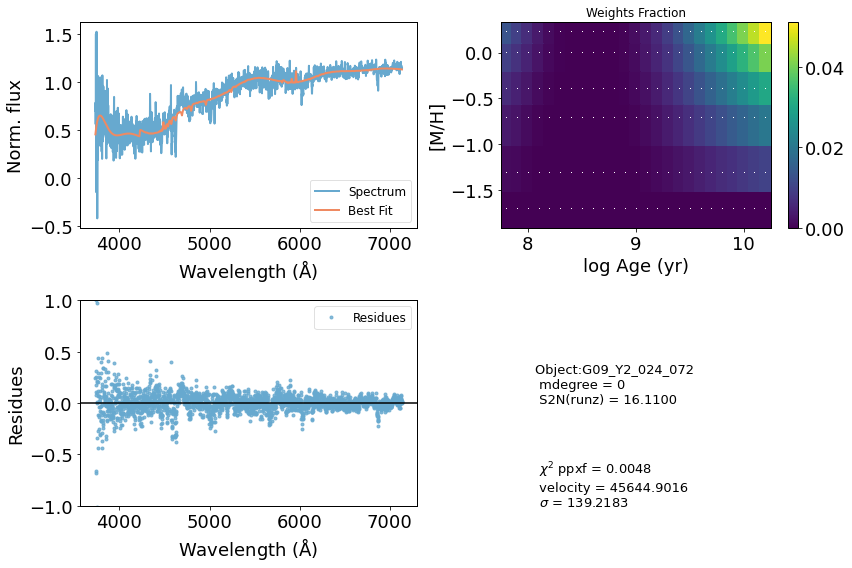

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47381       180     0.000     0.000
 comp.  1:     47381       180
 comp.  2:     47381       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01624
method = capfit; Jac calls: 1; Func calls: 18; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3541         3   47381   180
Comp:  2       Unknown     0.1243       6.7   47381   180
Comp:  2       Unknown          0       6.6   47381   180
Comp:  2       Unknown     0.1823       2.6   47381   180
Comp:  2       Unknown     0.1365       1.7   47381   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.204
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.204
M/L_r: 2.563
Current $\chi^2$: 0.0162
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


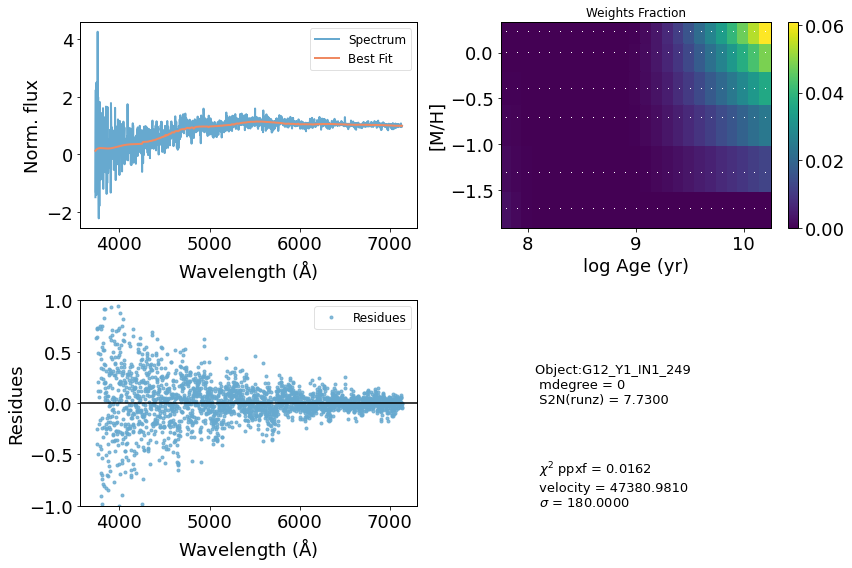

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43949       180     0.000     0.000
 comp.  1:     43949       180
 comp.  2:     43949       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007539
method = capfit; Jac calls: 1; Func calls: 19; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.234       4.1   43949   180
Comp:  2       Unknown          0       4.8   43949   180
Comp:  2       Unknown          0       4.8   43949   180
Comp:  2       Unknown     0.3585       3.2   43949   180
Comp:  2       Unknown     0.1734       2.3   43949   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.37
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.37
M/L_r: 0.1582
Current $\chi^2$: 0.0075
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


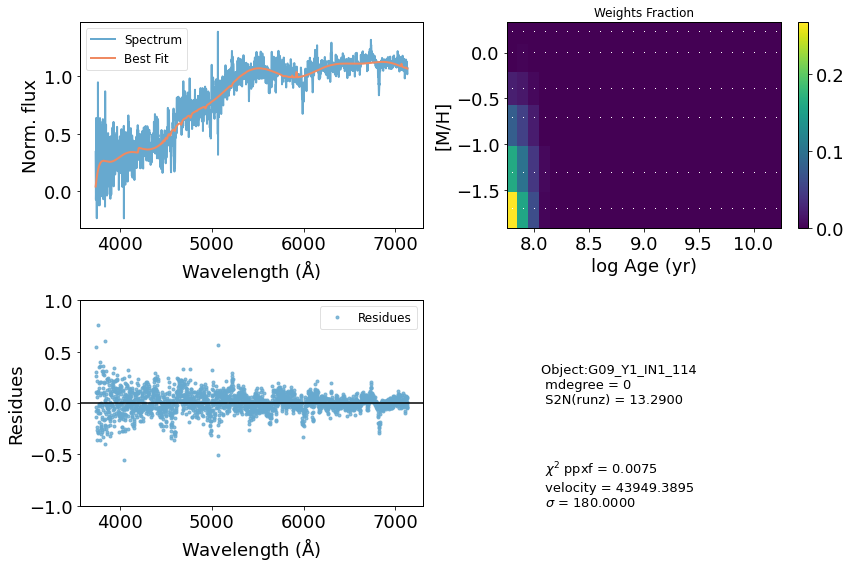

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51723       165     0.001     0.002
 comp.  1:     51983      1000
 comp.  2:     50312      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006848
method = capfit; Jac calls: 14; Func calls: 148; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.36       9.4   51983  1000
Comp:  2       Unknown          0        51   50312  1000
Comp:  2       Unknown          0        50   50312  1000
Comp:  2       Unknown      3.689       6.4   50312  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.99
Weighted <[M/H]>: -0.0822
Weighted <logAge> [yr]: 7.99
Weighted <[M/H]>: -0.0822
M/L_r: 0.1913
Current $\chi^2$: 0.0068
Elapsed time in PPXF: 1.19 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


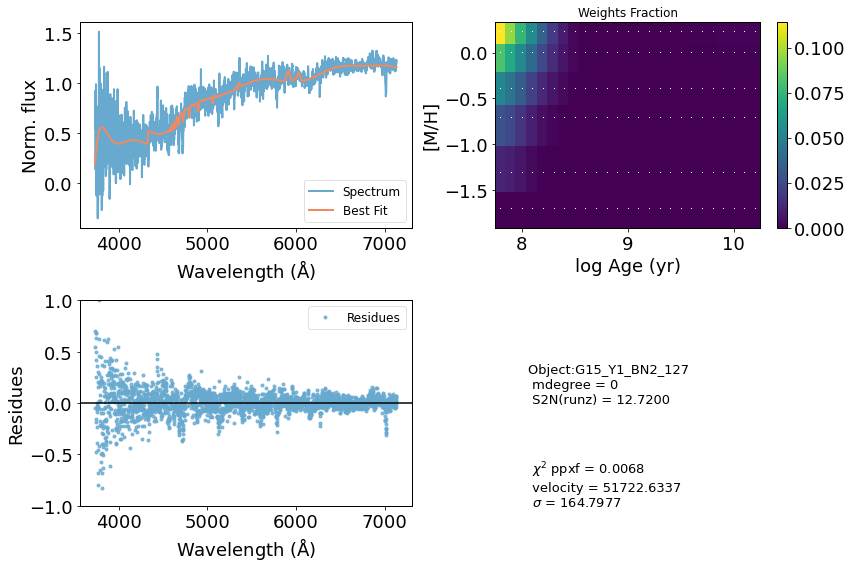

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36043         1     0.002     0.000
 comp.  1:     35639        42
 comp.  2:     35333       128
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01542
method = capfit; Jac calls: 11; Func calls: 116; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5729       1.9   35639    42
Comp:  2       Unknown          0       5.6   35333   128
Comp:  2       Unknown          0       5.6   35333   128
Comp:  2       Unknown      1.258       3.2   35333   128
Comp:  2       Unknown          0       2.3   35333   128
---------------------------------------------------------
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.23
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.23
M/L_r: 0.1579
Current $\chi^2$: 0.0154
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


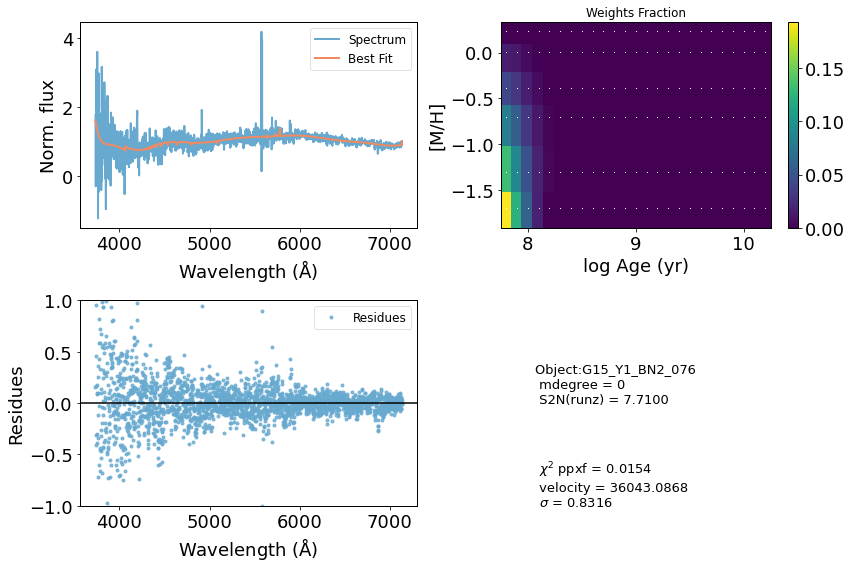

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46878         1    -0.001     0.000
 comp.  1:     47148      1000
 comp.  2:     46977        63
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01134
method = capfit; Jac calls: 10; Func calls: 106; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.621        10   47148  1000
Comp:  2       Unknown          0       2.4   46977    63
Comp:  2       Unknown          0       2.5   46977    63
Comp:  2       Unknown          0       2.4   46977    63
Comp:  2       Unknown     0.3788       1.5   46977    63
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -0.804
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -0.804
M/L_r: 0.1599
Current $\chi^2$: 0.0113
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


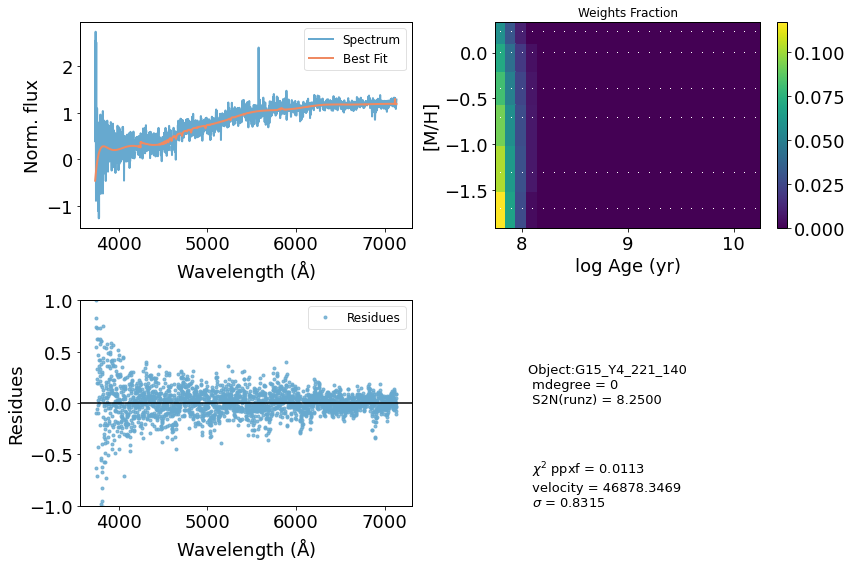

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24599       124    -0.001     0.001
 comp.  1:     24713       115
 comp.  2:     24380       126
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01032
method = capfit; Jac calls: 9; Func calls: 97; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8761       2.7   24713   115
Comp:  2       Unknown          0        11   24380   126
Comp:  2       Unknown    0.01386        11   24380   126
Comp:  2       Unknown     0.1829       1.1   24380   126
Comp:  2       Unknown     0.2335       1.1   24380   126
Comp:  2       Unknown          0       3.2   24380   126
Comp:  2       Unknown          0       1.4   24380   126
Comp:  2       Unknown          0       1.4   24380   126
-------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


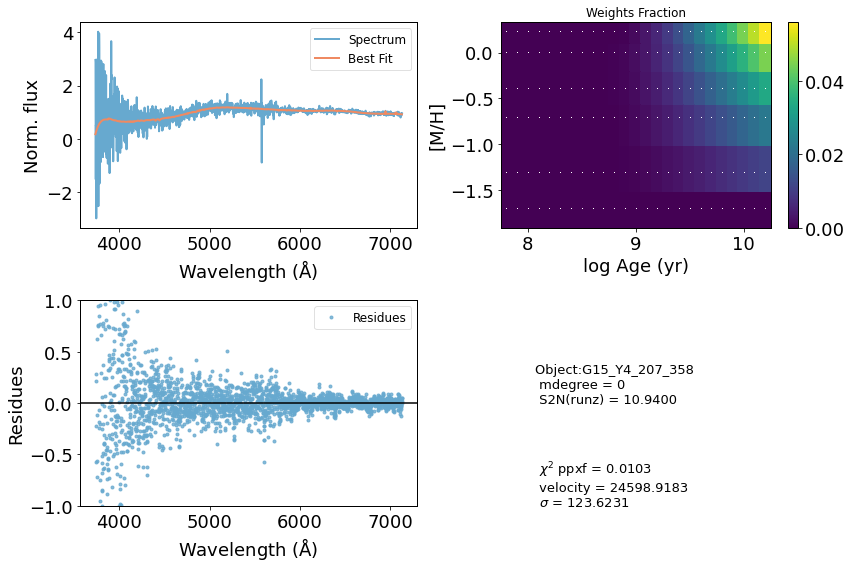

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46015         1    -0.002     0.005
 comp.  1:     45978        62
 comp.  2:     46143       234
Gas Reddening E(B-V): 1.928
chi2/DOF: 0.007692
method = capfit; Jac calls: 9; Func calls: 94; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2156       1.6   45978    62
Comp:  2       Unknown          0       7.4   46143   234
Comp:  2       Unknown     0.6094       7.4   46143   234
Comp:  2       Unknown     0.7361       3.6   46143   234
Comp:  2       Unknown     0.1144       2.6   46143   234
---------------------------------------------------------
Weighted <logAge> [yr]: 9.58
Weighted <[M/H]>: -0.307
Weighted <logAge> [yr]: 9.58
Weighted <[M/H]>: -0.307
M/L_r: 0.6757
Current $\chi^2$: 0.0077
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


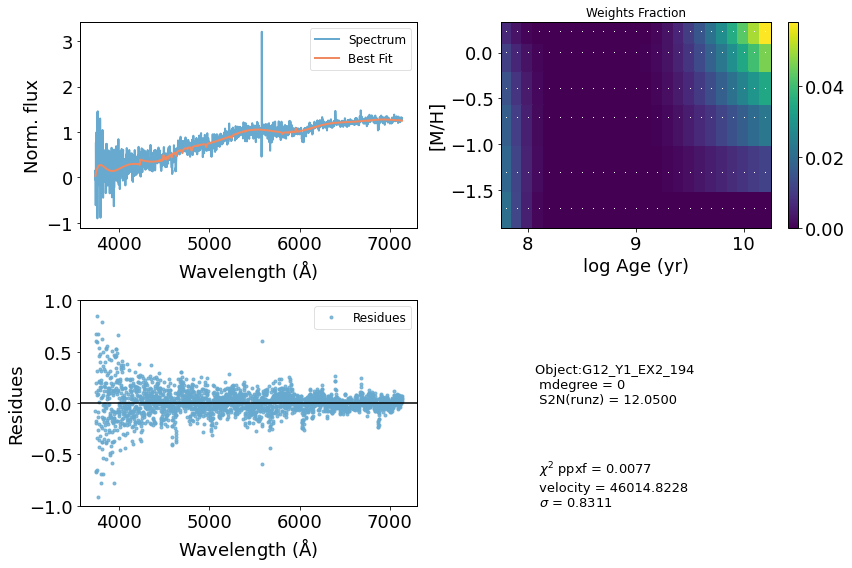

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53829       153     0.001     0.011
 comp.  1:     53932       417
 comp.  2:     54583       593
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008653
method = capfit; Jac calls: 10; Func calls: 111; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.091       7.7   53932   417
Comp:  2       Unknown       3.54        24   54583   593
Comp:  2       Unknown          0        24   54583   593
Comp:  2       Unknown          0       4.7   54583   593
---------------------------------------------------------
Weighted <logAge> [yr]: 8.11
Weighted <[M/H]>: -0.0869
Weighted <logAge> [yr]: 8.11
Weighted <[M/H]>: -0.0869
M/L_r: 0.2181
Current $\chi^2$: 0.0087
Elapsed time in PPXF: 1.02 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


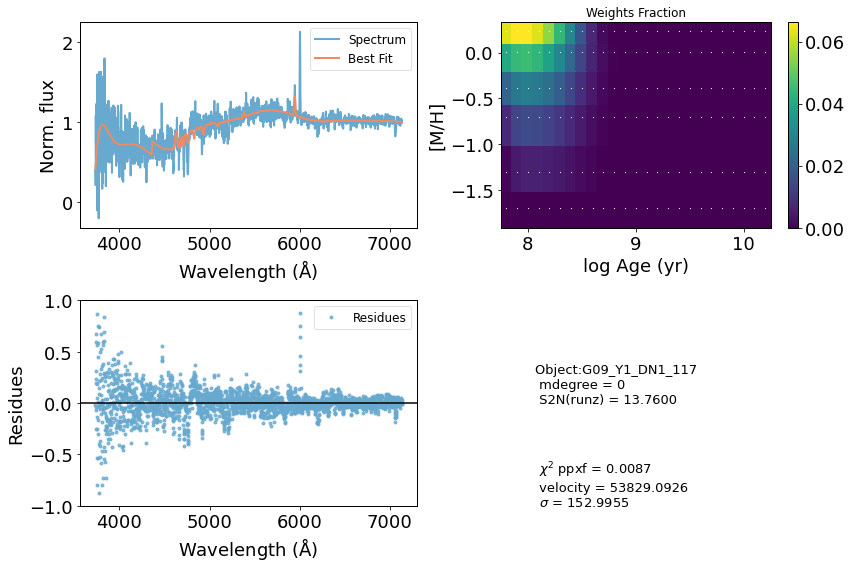

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42886         1     0.000     0.000
 comp.  1:     40880       184
 comp.  2:     40895       173
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01079
method = capfit; Jac calls: 2; Func calls: 28; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.01482       2.7   40880   184
Comp:  2       Unknown          0       7.6   40895   173
Comp:  2       Unknown     0.5613       7.8   40895   173
Comp:  2       Unknown          0       3.1   40895   173
Comp:  2       Unknown          0       1.7   40895   173
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: 0.0316
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: 0.0316
M/L_r: 0.1799
Current $\chi^2$: 0.0108
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


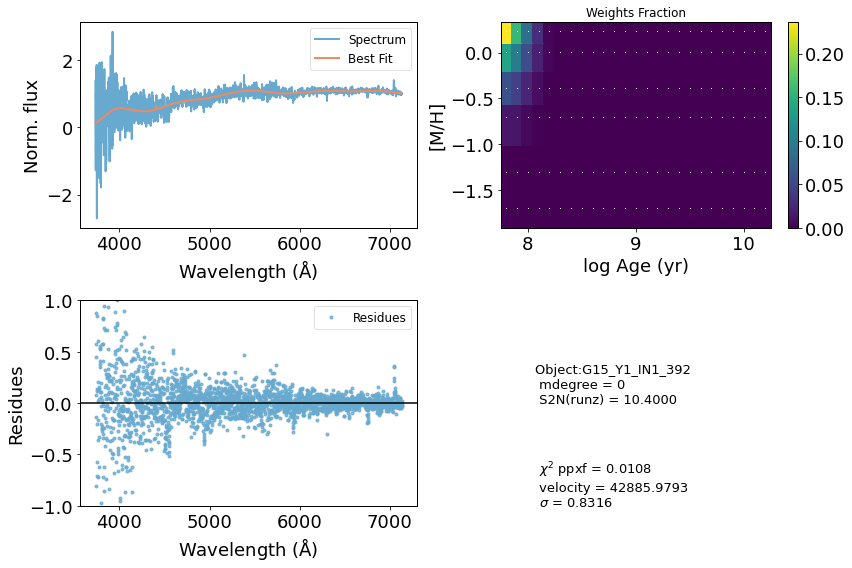

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53629        46     0.013    -0.011
 comp.  1:     52950      1000
 comp.  2:     53968       180
Gas Reddening E(B-V): 0.136
chi2/DOF: 0.005394
method = capfit; Jac calls: 11; Func calls: 115; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.747       9.4   52950  1000
Comp:  2       Unknown          0       4.9   53968   180
Comp:  2       Unknown          0       4.9   53968   180
Comp:  2       Unknown          0       2.9   53968   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.1
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.1
M/L_r: 0.1783
Current $\chi^2$: 0.0054
Elapsed time in PPXF: 0.93 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


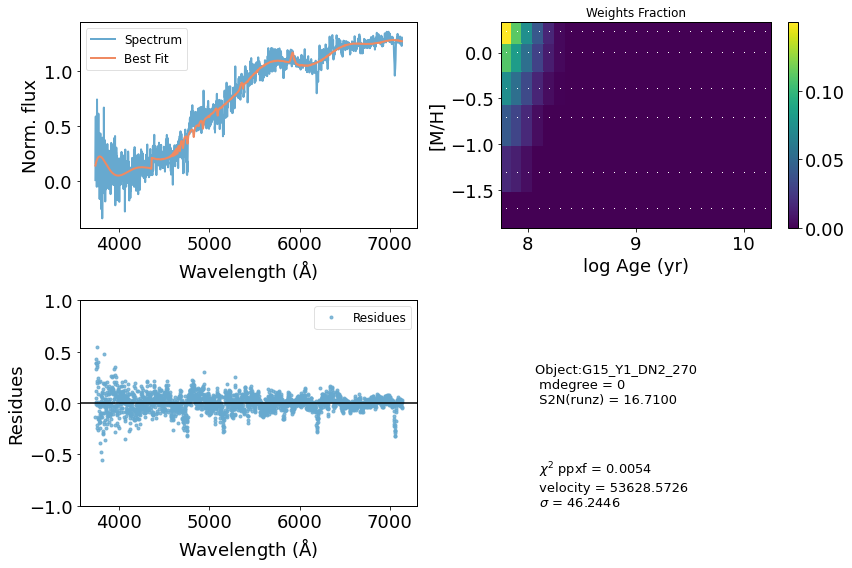

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54208       422    -0.001    -0.013
 comp.  1:     54161      1000
 comp.  2:     54704       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00888
method = capfit; Jac calls: 8; Func calls: 85; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.52        12   54161  1000
Comp:  2       Unknown          0       5.7   54704   180
Comp:  2       Unknown          0       5.6   54704   180
Comp:  2       Unknown          0       2.8   54704   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.14
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.14
M/L_r: 0.1572
Current $\chi^2$: 0.0089
Elapsed time in PPXF: 0.72 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


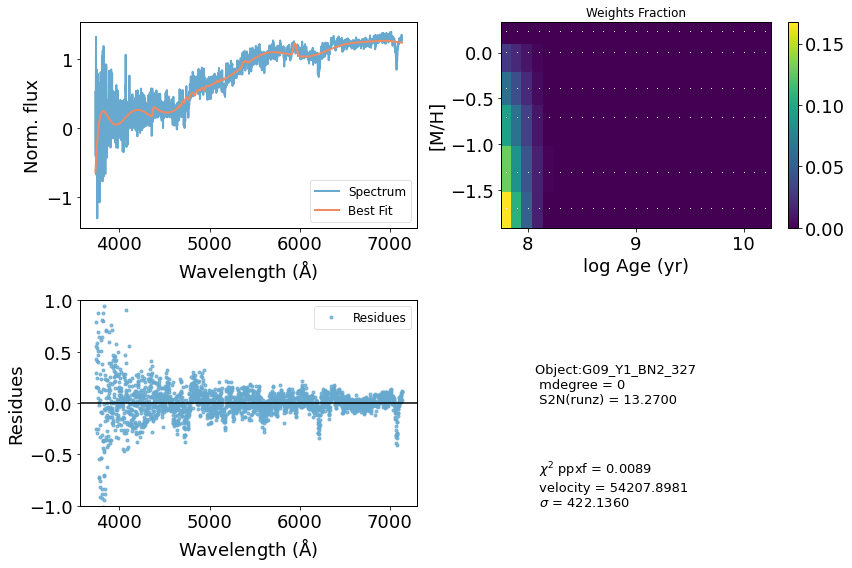

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51771         1    -0.003    -0.002
 comp.  1:     52043        35
 comp.  2:     51706       884
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01411
method = capfit; Jac calls: 11; Func calls: 115; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5272       2.1   52043    35
Comp:  2       Unknown          0        59   51706   884
Comp:  2       Unknown          0        59   51706   884
Comp:  2       Unknown      2.822       5.6   51706   884
---------------------------------------------------------
Weighted <logAge> [yr]: 8.78
Weighted <[M/H]>: -0.607
Weighted <logAge> [yr]: 8.78
Weighted <[M/H]>: -0.607
M/L_r: 0.2515
Current $\chi^2$: 0.0141
Elapsed time in PPXF: 1.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


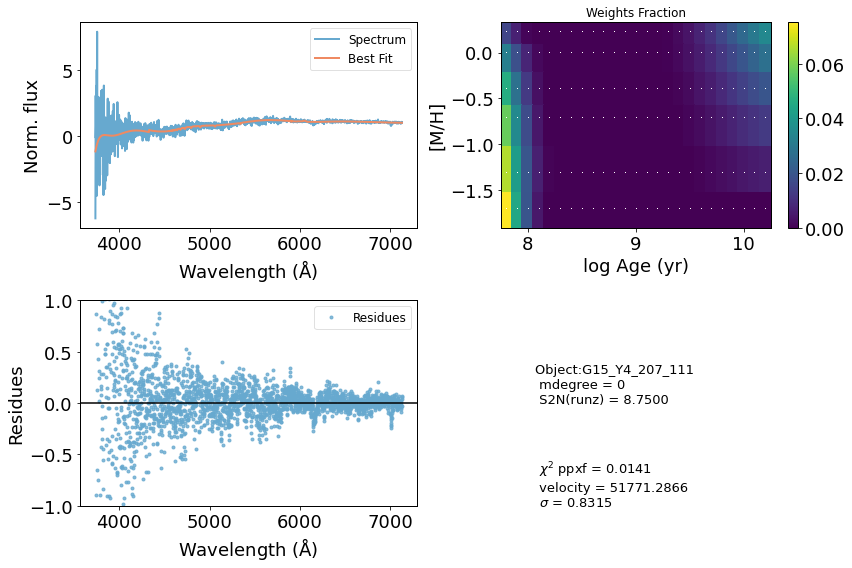

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     25851         1     0.001    -0.002
 comp.  1:     25638       509
 comp.  2:     26504        61
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004851
method = capfit; Jac calls: 12; Func calls: 127; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.838       6.3   25638   509
Comp:  2       Unknown     0.3889       3.8   26504    61
Comp:  2       Unknown     0.5467       3.8   26504    61
Comp:  2       Unknown          0       1.2   26504    61
Comp:  2       Unknown          0       1.2   26504    61
Comp:  2       Unknown     0.3389       2.6   26504    61
Comp:  2       Unknown    0.08003       1.5   26504    61
Comp:  2       Unknown     0.1329       1.5   26504    61
----------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


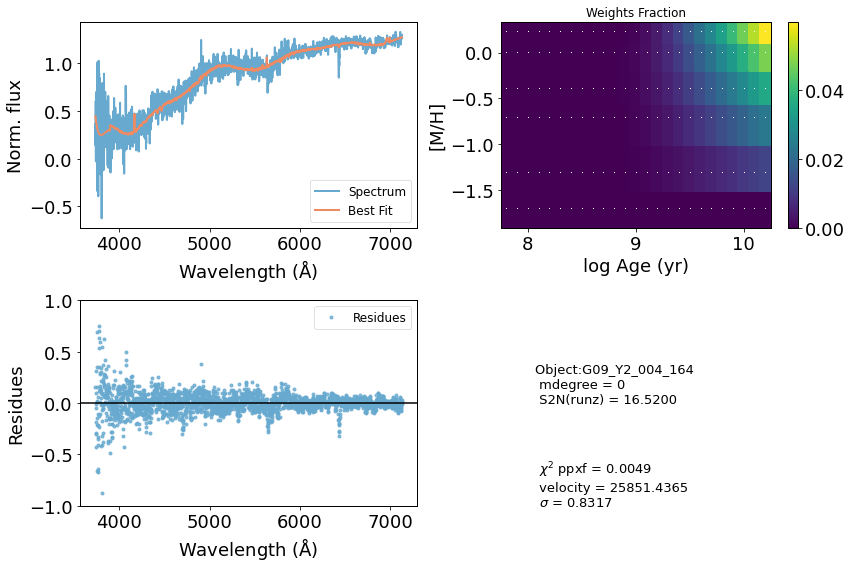

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59189         1    -0.003     0.005
 comp.  1:     59413      1000
 comp.  2:     60370      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.03723
method = capfit; Jac calls: 14; Func calls: 148; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      20.85        10   59413  1000
Comp:  2       Unknown          0        51   60370  1000
Comp:  2       Unknown      8.901        51   60370  1000
Comp:  2       Unknown      3.374       5.7   60370  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -0.216
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -0.216
M/L_r: 0.1832
Current $\chi^2$: 0.0372
Elapsed time in PPXF: 1.09 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


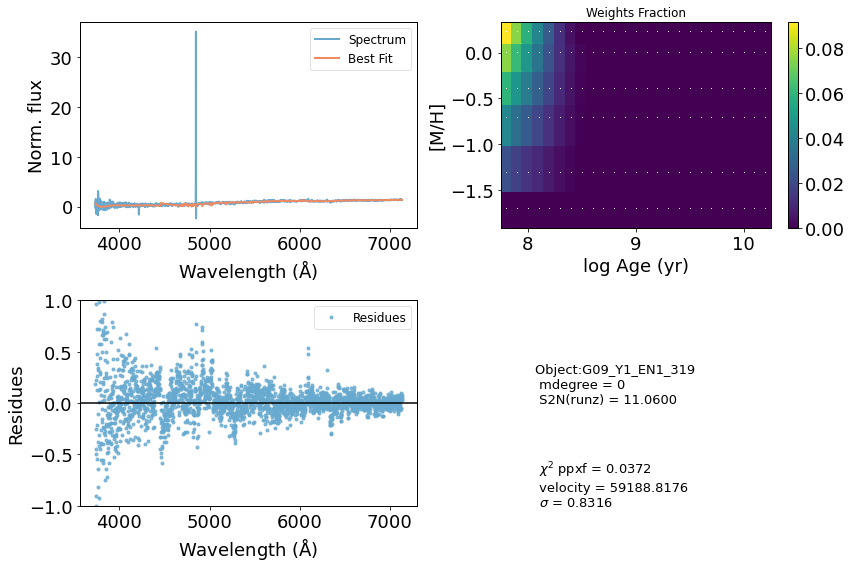

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44420       164     0.003    -0.004
 comp.  1:     45007      1000
 comp.  2:     43328      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00351
method = capfit; Jac calls: 12; Func calls: 127; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.603        12   45007  1000
Comp:  2       Unknown          0        41   43328  1000
Comp:  2       Unknown          0        41   43328  1000
Comp:  2       Unknown       4.28       8.3   43328  1000
Comp:  2       Unknown      1.786       7.1   43328  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.204
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.204
M/L_r: 1.21
Current $\chi^2$: 0.0035
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


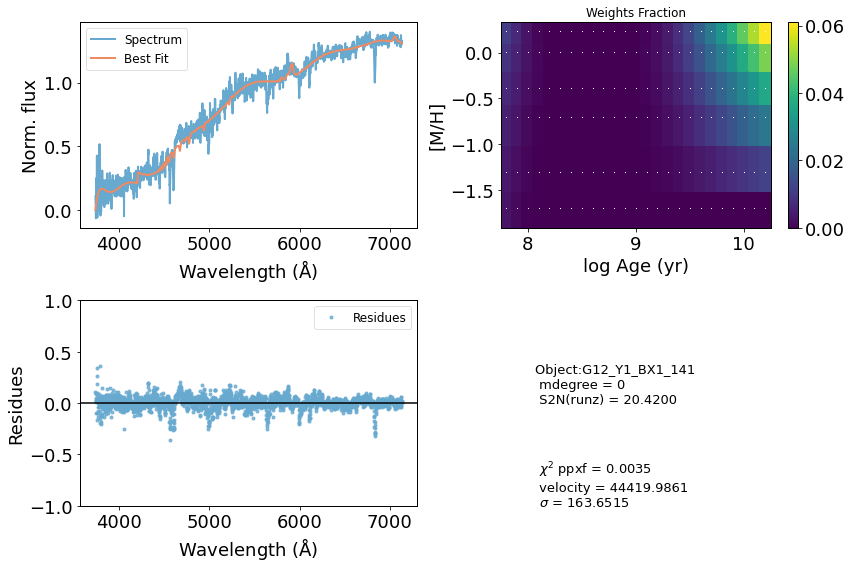

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62058       998     0.025     0.098
 comp.  1:     62327      1000
 comp.  2:     62084      1000
Gas Reddening E(B-V): 2.236
chi2/DOF: 22.52
method = capfit; Jac calls: 9; Func calls: 95; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      111.5       8.6   62327  1000
Comp:  2       Unknown          0        42   62084  1000
Comp:  2       Unknown       33.6        41   62084  1000
Comp:  2       Unknown      37.54       7.5   62084  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.196
M/L_r: 2.641
Current $\chi^2$: 22.5224
Elapsed time in PPXF: 0.71 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


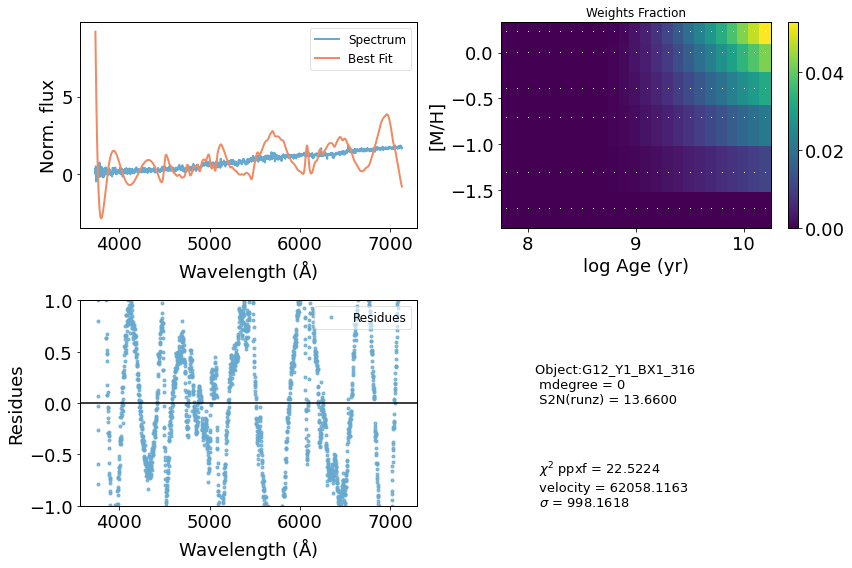

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40759         1    -0.001     0.000
 comp.  1:     40701       137
 comp.  2:     41362       195
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006884
method = capfit; Jac calls: 10; Func calls: 105; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9453       2.9   40701   137
Comp:  2       Unknown          0       7.8   41362   195
Comp:  2       Unknown     0.8536       7.8   41362   195
Comp:  2       Unknown          0       3.4   41362   195
Comp:  2       Unknown          0         2   41362   195
---------------------------------------------------------
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.41
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.41
M/L_r: 0.1583
Current $\chi^2$: 0.0069
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


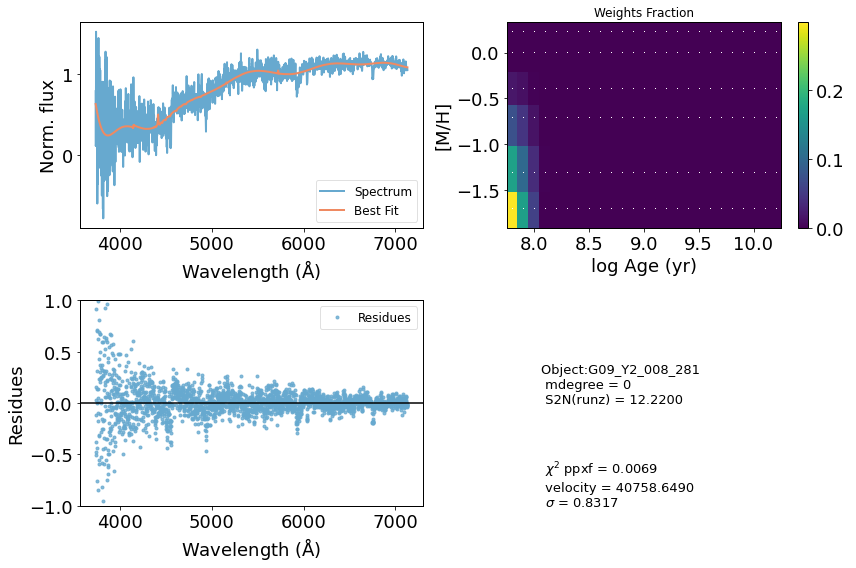

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29496       179    -0.002     0.001
 comp.  1:     29028       559
 comp.  2:     28811       101
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00721
method = capfit; Jac calls: 9; Func calls: 95; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.962       6.7   29028   559
Comp:  2       Unknown     0.5301       6.5   28811   101
Comp:  2       Unknown          0       6.3   28811   101
Comp:  2       Unknown     0.1159       1.4   28811   101
Comp:  2       Unknown          0       1.7   28811   101
Comp:  2       Unknown     0.2586       3.6   28811   101
Comp:  2       Unknown          0       1.8   28811   101
Comp:  2       Unknown    0.06435       1.9   28811   101
------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


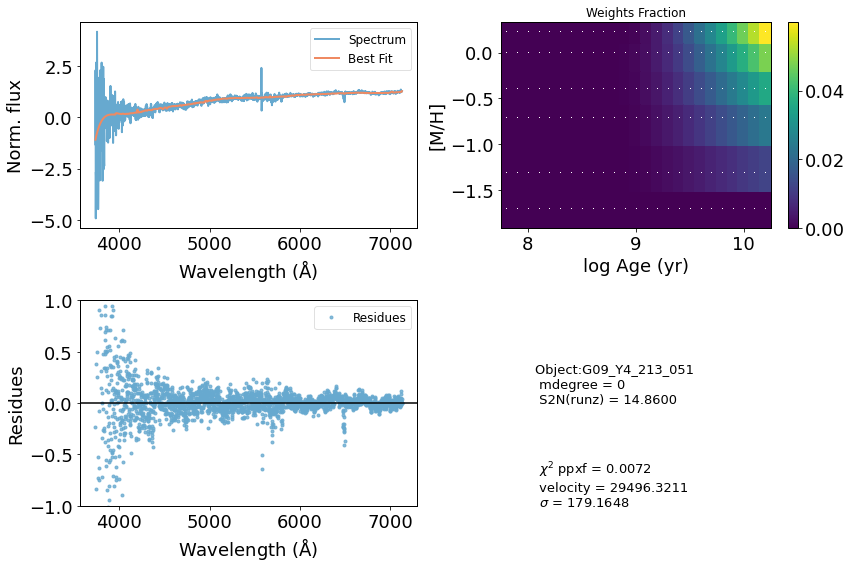

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54404       277     0.011     0.017
 comp.  1:     54397      1000
 comp.  2:     54861       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01043
method = capfit; Jac calls: 10; Func calls: 106; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.83        12   54397  1000
Comp:  2       Unknown          0       4.6   54861   180
Comp:  2       Unknown          0       4.7   54861   180
Comp:  2       Unknown          0       2.7   54861   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -0.101
Weighted <logAge> [yr]: 8
Weighted <[M/H]>: -0.101
M/L_r: 0.1871
Current $\chi^2$: 0.0104
Elapsed time in PPXF: 0.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


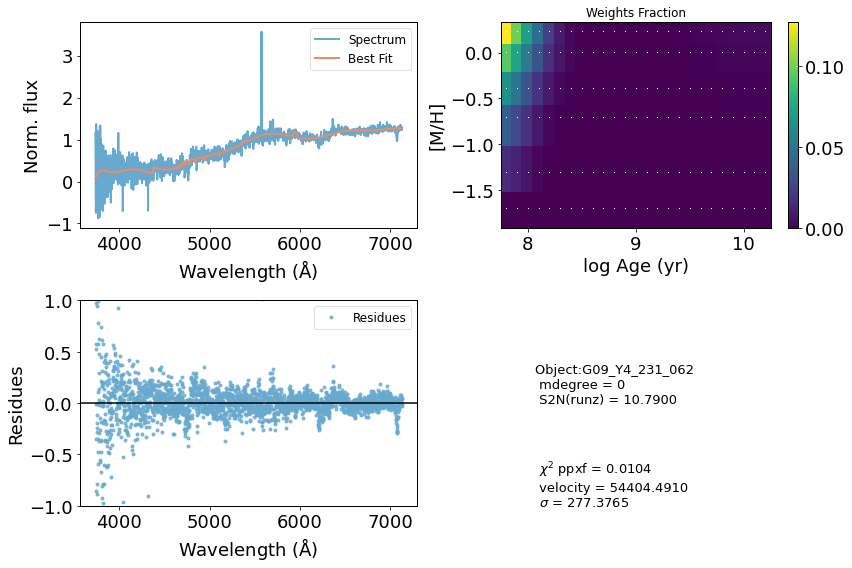

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33150      1000    -0.001    -0.006
 comp.  1:     33180       217
 comp.  2:     33343       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004467
method = capfit; Jac calls: 3; Func calls: 36; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  54 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9569       4.3   33180   217
Comp:  2       Unknown          0         6   33343   180
Comp:  2       Unknown          0       5.9   33343   180
Comp:  2       Unknown          0       3.7   33343   180
Comp:  2       Unknown          0       2.8   33343   180
Comp:  2       Unknown          0       2.4   33343   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.88
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


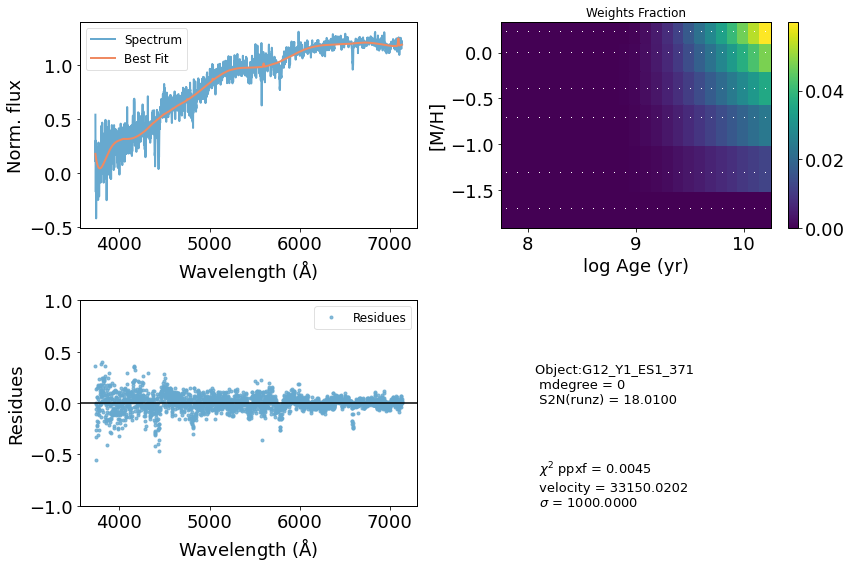

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59032       384     0.003    -0.003
 comp.  1:     59692      1000
 comp.  2:     59632      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01071
method = capfit; Jac calls: 11; Func calls: 118; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      13.07        10   59692  1000
Comp:  2       Unknown          0        50   59632  1000
Comp:  2       Unknown          0        50   59632  1000
Comp:  2       Unknown      4.505         6   59632  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 8.05
Weighted <[M/H]>: -0.0297
Weighted <logAge> [yr]: 8.05
Weighted <[M/H]>: -0.0297
M/L_r: 0.2084
Current $\chi^2$: 0.0107
Elapsed time in PPXF: 0.96 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


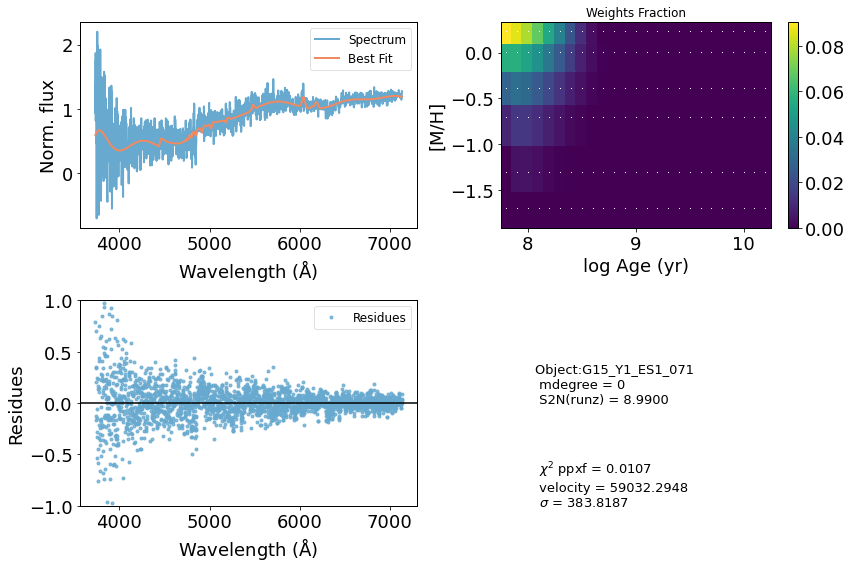

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30516       180     0.000     0.000
 comp.  1:     30516       180
 comp.  2:     30516       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01119
method = capfit; Jac calls: 1; Func calls: 17; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.2   30516   180
Comp:  2       Unknown          0       7.1   30516   180
Comp:  2       Unknown     0.5622       7.1   30516   180
Comp:  2       Unknown          0       4.2   30516   180
Comp:  2       Unknown     0.4292       2.1   30516   180
Comp:  2       Unknown     0.5402         2   30516   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.195
Weighted <logAge> [yr]: 9.87
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


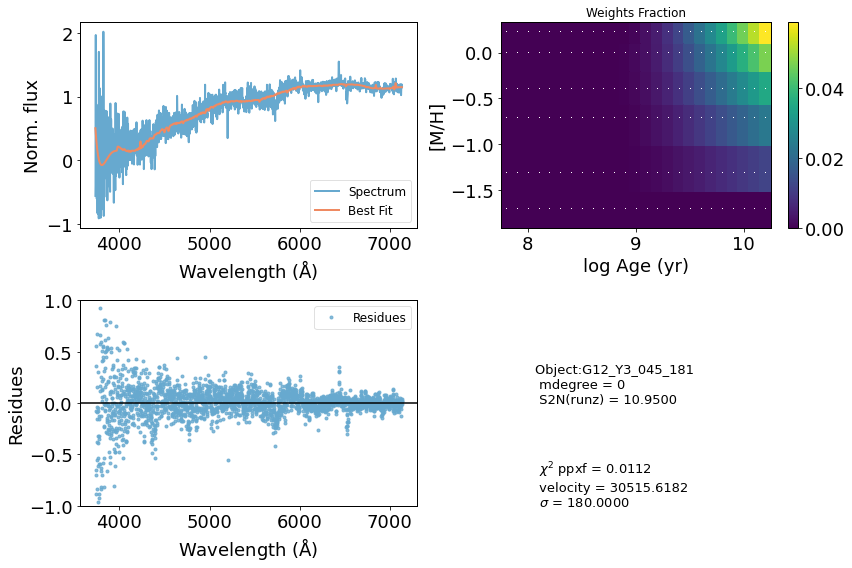

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     66287       180     0.000     0.000
 comp.  1:     66287       180
 comp.  2:     66287       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.032
method = capfit; Jac calls: 1; Func calls: 19; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  51 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1259         5   66287   180
Comp:  2       Unknown          0       5.2   66287   180
Comp:  2       Unknown     0.4852       5.4   66287   180
Comp:  2       Unknown          0       3.7   66287   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.198
M/L_r: 3.196
Current $\chi^2$: 0.0320
Elapsed time in PPXF: 0.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


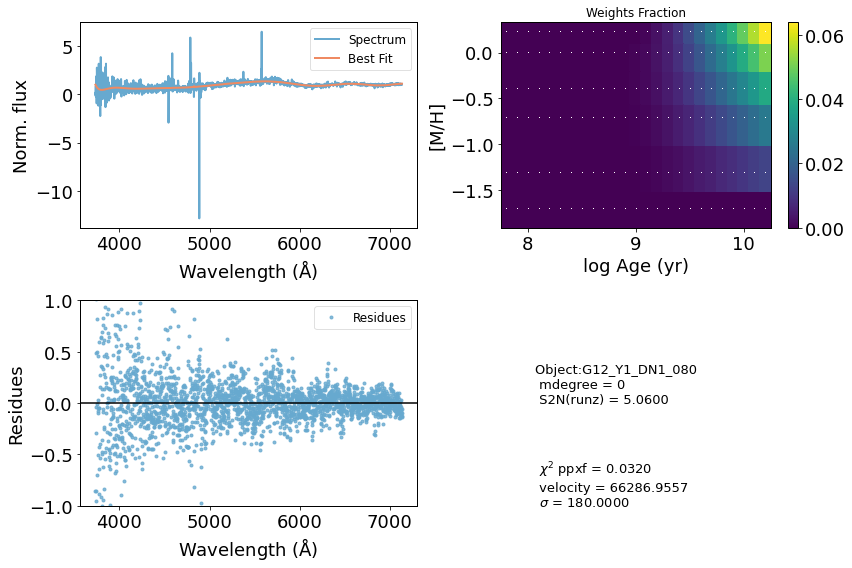

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48050        98     0.000     0.001
 comp.  1:     48185       183
 comp.  2:     48158        67
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007673
method = capfit; Jac calls: 4; Func calls: 47; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  8 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.491       5.2   48185   183
Comp:  2       Unknown     0.1636       2.6   48158    67
Comp:  2       Unknown          0       2.5   48158    67
Comp:  2       Unknown          0       2.2   48158    67
Comp:  2       Unknown    0.01074       1.4   48158    67
---------------------------------------------------------
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.21
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.21
M/L_r: 0.1579
Current $\chi^2$: 0.0077
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


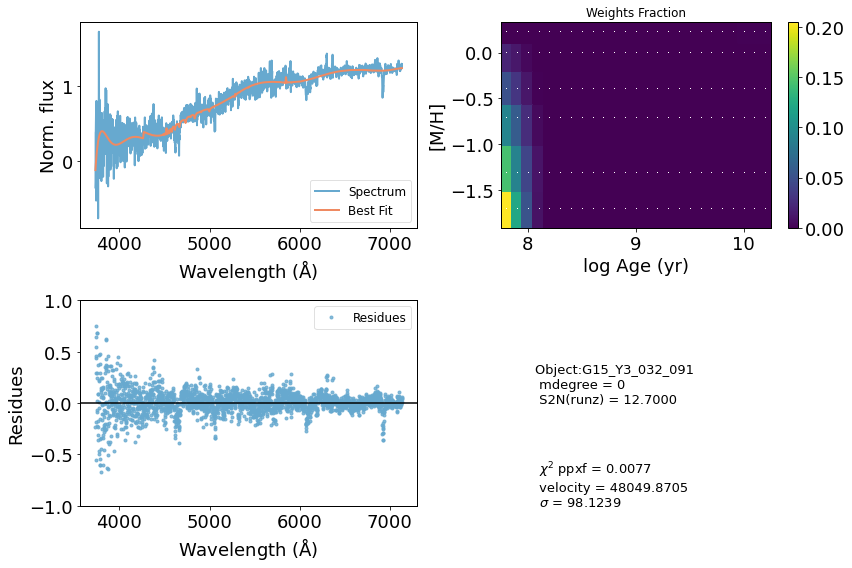

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     73673         1    -0.000    -0.003
 comp.  1:     74906       314
 comp.  2:     74361        29
Gas Reddening E(B-V): 2.113
chi2/DOF: 0.02512
method = capfit; Jac calls: 8; Func calls: 86; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.881       4.8   74906   314
Comp:  2       Unknown          0       1.8   74361    29
Comp:  2       Unknown          0       1.9   74361    29
Comp:  2       Unknown     0.4772       1.5   74361    29
---------------------------------------------------------
Weighted <logAge> [yr]: 9.43
Weighted <[M/H]>: -0.117
Weighted <logAge> [yr]: 9.43
Weighted <[M/H]>: -0.117
M/L_r: 0.799
Current $\chi^2$: 0.0251
Elapsed time in PPXF: 0.69 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


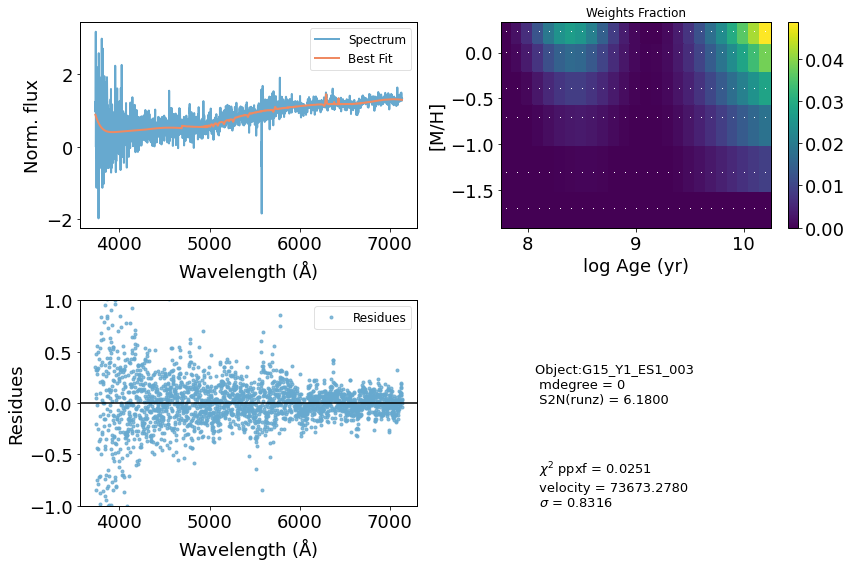

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     32863       999     0.002     0.002
 comp.  1:     34854       180
 comp.  2:     34671        81
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007532
method = capfit; Jac calls: 6; Func calls: 63; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.7   34854   180
Comp:  2       Unknown          0       4.6   34671    81
Comp:  2       Unknown          0       4.5   34671    81
Comp:  2       Unknown          0       2.5   34671    81
Comp:  2       Unknown     0.1885       1.5   34671    81
Comp:  2       Unknown    0.03517       1.2   34671    81
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>:

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide


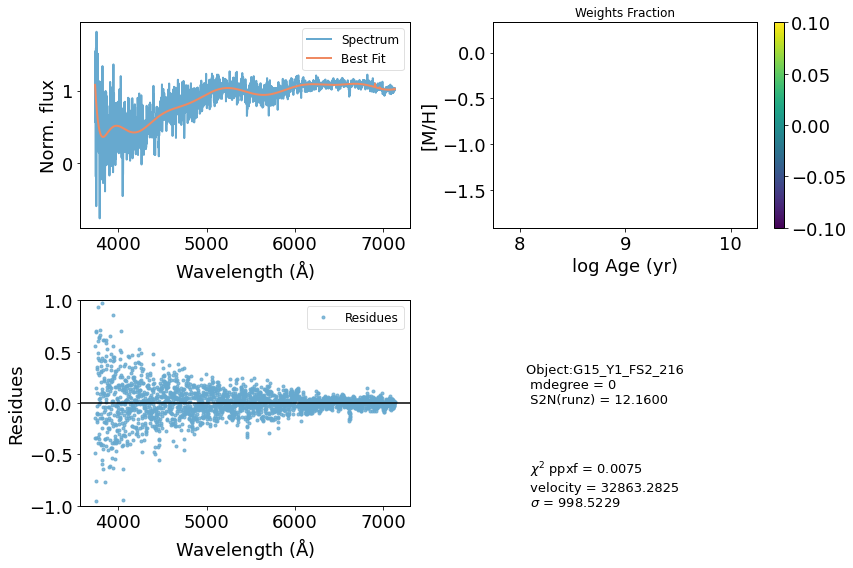

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64122       188     0.000    -0.000
 comp.  1:     64620      1000
 comp.  2:     64807      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01107
method = capfit; Jac calls: 12; Func calls: 130; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  18 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.487        10   64620  1000
Comp:  2       Unknown          0        51   64807  1000
Comp:  2       Unknown          0        51   64807  1000
Comp:  2       Unknown       5.62         6   64807  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.184
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.184
M/L_r: 1.591
Current $\chi^2$: 0.0111
Elapsed time in PPXF: 1.02 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


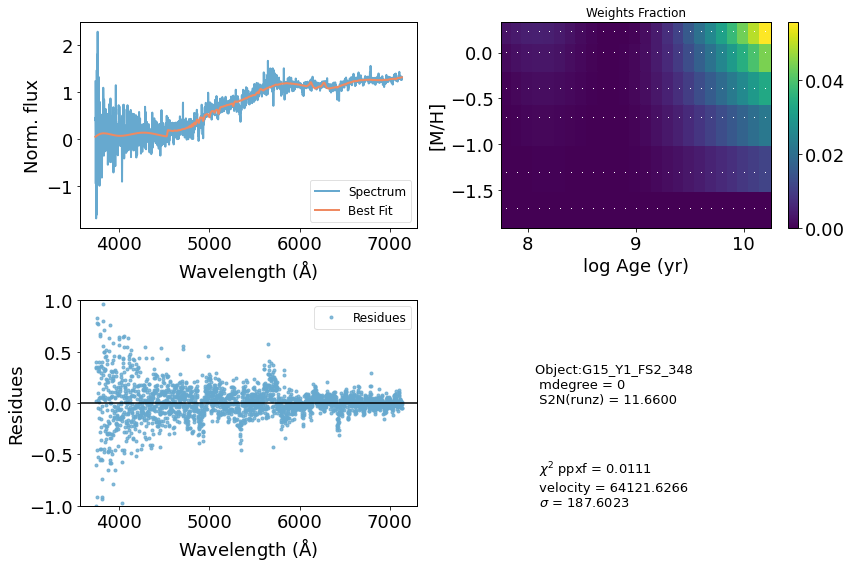

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30438       262     0.001     0.000
 comp.  1:     30587       297
 comp.  2:     29918        84
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009946
method = capfit; Jac calls: 9; Func calls: 98; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.145       4.2   30587   297
Comp:  2       Unknown       1.31       6.2   29918    84
Comp:  2       Unknown          0         6   29918    84
Comp:  2       Unknown          0       3.2   29918    84
Comp:  2       Unknown     0.2731       1.5   29918    84
Comp:  2       Unknown          0       1.4   29918    84
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.83
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


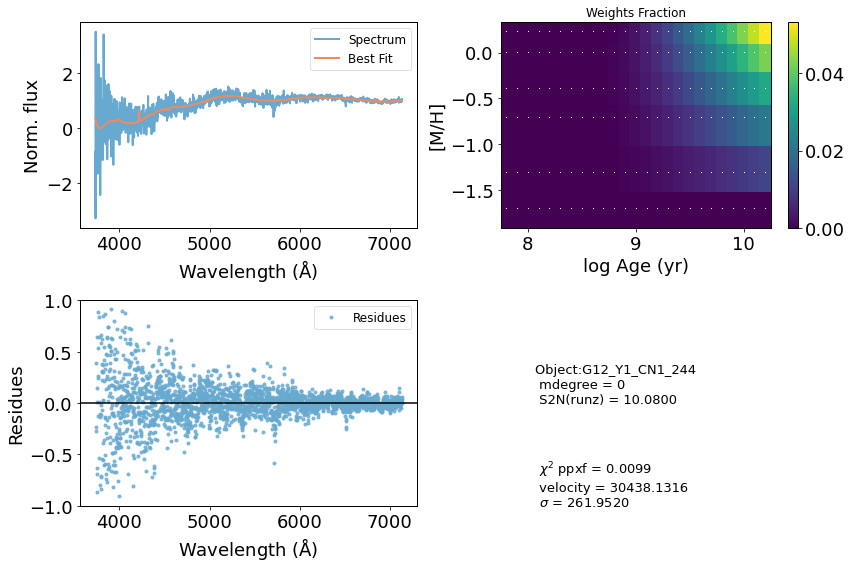

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     71977       139    -0.001    -0.001
 comp.  1:     72243       505
 comp.  2:     72631       119
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01718
method = capfit; Jac calls: 12; Func calls: 128; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.165       8.4   72243   505
Comp:  2       Unknown     0.8992       2.9   72631   119
Comp:  2       Unknown          0       2.8   72631   119
Comp:  2       Unknown          0       2.3   72631   119
---------------------------------------------------------
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: -0.0293
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: -0.0293
M/L_r: 0.2362
Current $\chi^2$: 0.0172
Elapsed time in PPXF: 0.67 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


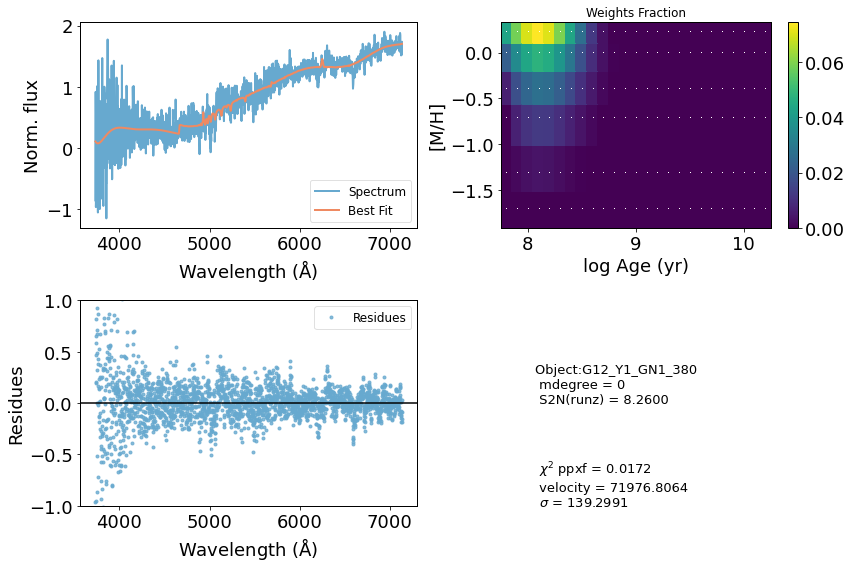

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43111        37     0.004    -0.002
 comp.  1:     41065       309
 comp.  2:     40021       704
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01323
method = capfit; Jac calls: 12; Func calls: 125; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.151       3.9   41065   309
Comp:  2       Unknown      2.246        50   40021   704
Comp:  2       Unknown          0        49   40021   704
Comp:  2       Unknown      2.232       6.3   40021   704
Comp:  2       Unknown     0.4124       3.8   40021   704
---------------------------------------------------------
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.43
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.43
M/L_r: 0.1589
Current $\chi^2$: 0.0132
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


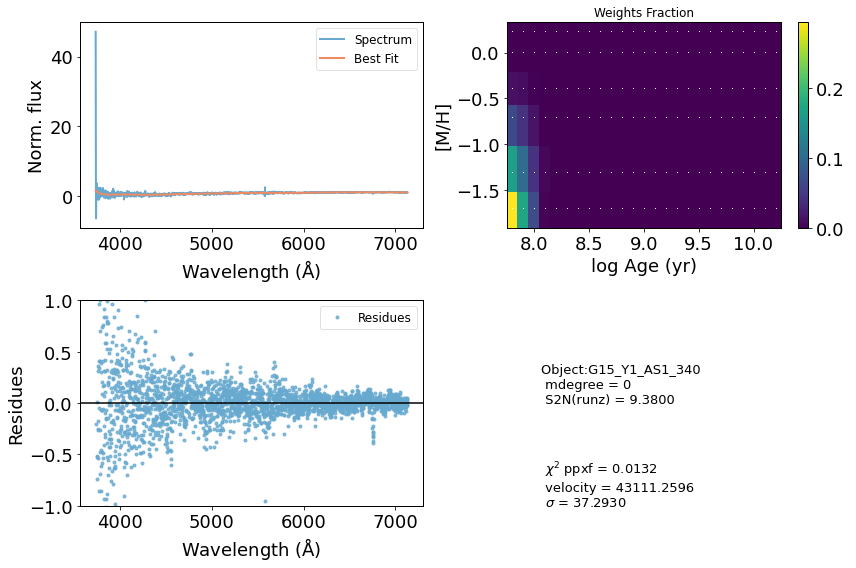

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64819       267     0.000     0.000
 comp.  1:     65875      1000
 comp.  2:     65524       144
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01164
method = capfit; Jac calls: 15; Func calls: 156; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.33        12   65875  1000
Comp:  2       Unknown     0.3897       3.3   65524   144
Comp:  2       Unknown          0       3.3   65524   144
Comp:  2       Unknown     0.9421       2.9   65524   144
---------------------------------------------------------
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: -0.0225
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: -0.0225
M/L_r: 0.2288
Current $\chi^2$: 0.0116
Elapsed time in PPXF: 1.20 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


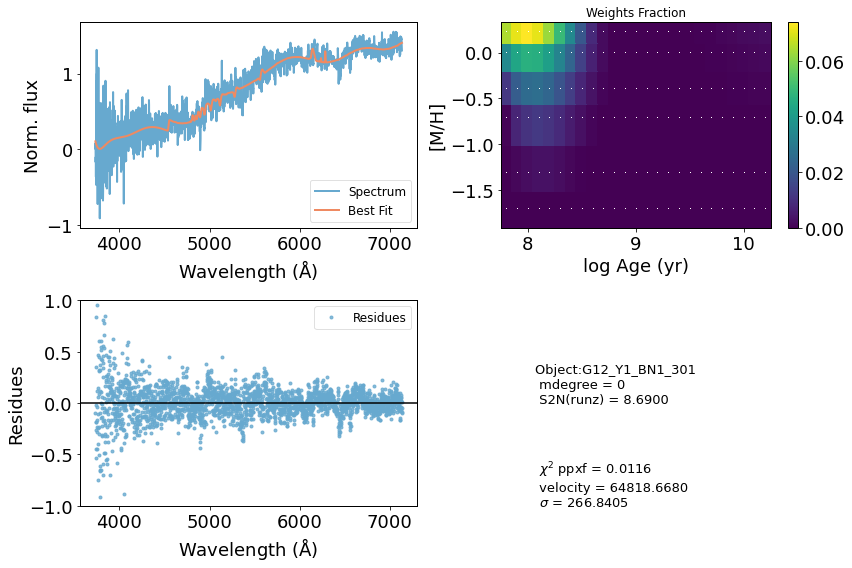

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44883         1    -0.001    -0.002
 comp.  1:     44888       100
 comp.  2:     45060        25
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02658
method = capfit; Jac calls: 6; Func calls: 65; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  8 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.391       3.7   44888   100
Comp:  2       Unknown     0.1462       2.6   45060    25
Comp:  2       Unknown          0       2.6   45060    25
Comp:  2       Unknown          0         2   45060    25
Comp:  2       Unknown     0.2655       1.3   45060    25
---------------------------------------------------------
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.27
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.27
M/L_r: 0.1577
Current $\chi^2$: 0.0266
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


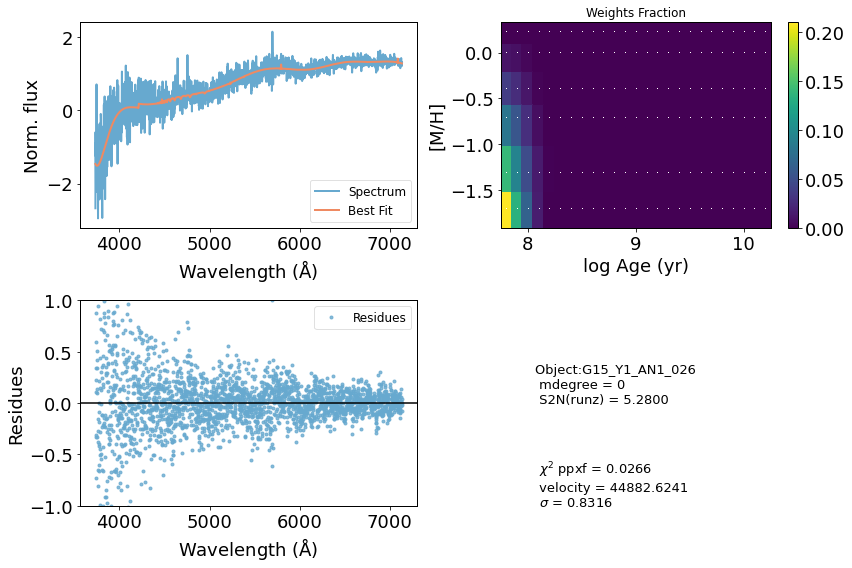

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46995       159    -0.001     0.001
 comp.  1:     47977      1000
 comp.  2:     47469       641
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004092
method = capfit; Jac calls: 12; Func calls: 129; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.323       9.3   47977  1000
Comp:  2       Unknown          0        27   47469   641
Comp:  2       Unknown      1.189        27   47469   641
Comp:  2       Unknown       1.12       5.7   47469   641
Comp:  2       Unknown          0       4.3   47469   641
---------------------------------------------------------
Weighted <logAge> [yr]: 8.92
Weighted <[M/H]>: -0.146
Weighted <logAge> [yr]: 8.92
Weighted <[M/H]>: -0.146
M/L_r: 0.3028
Current $\chi^2$: 0.0041
Ela

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


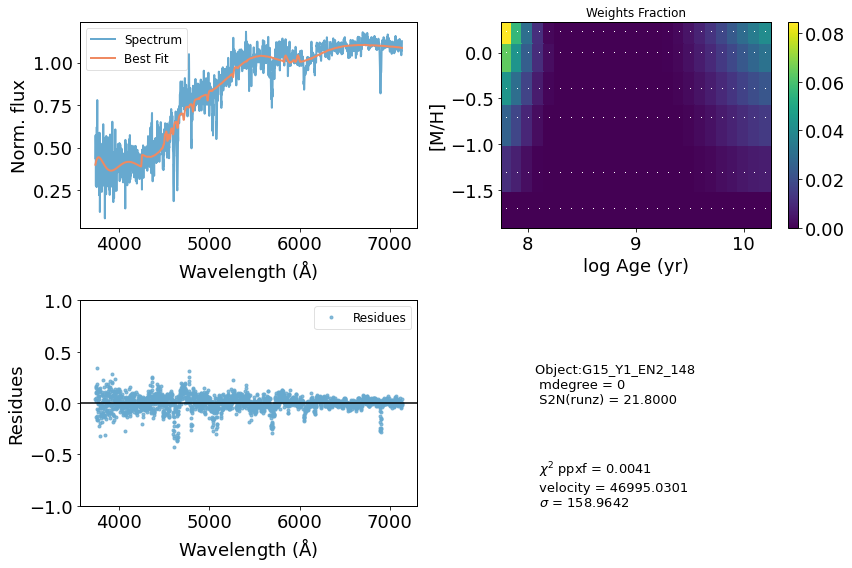

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38088      1000     0.011    -0.015
 comp.  1:     36497        53
 comp.  2:     34088      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006756
method = capfit; Jac calls: 30; Func calls: 307; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3321       1.7   36497    53
Comp:  2       Unknown      2.923        91   34088  1000
Comp:  2       Unknown          0        90   34088  1000
Comp:  2       Unknown      6.313       7.9   34088  1000
Comp:  2       Unknown      0.744         5   34088  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.1
M/L_r: 0.1579
Current $\chi^2$: 0.0068
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


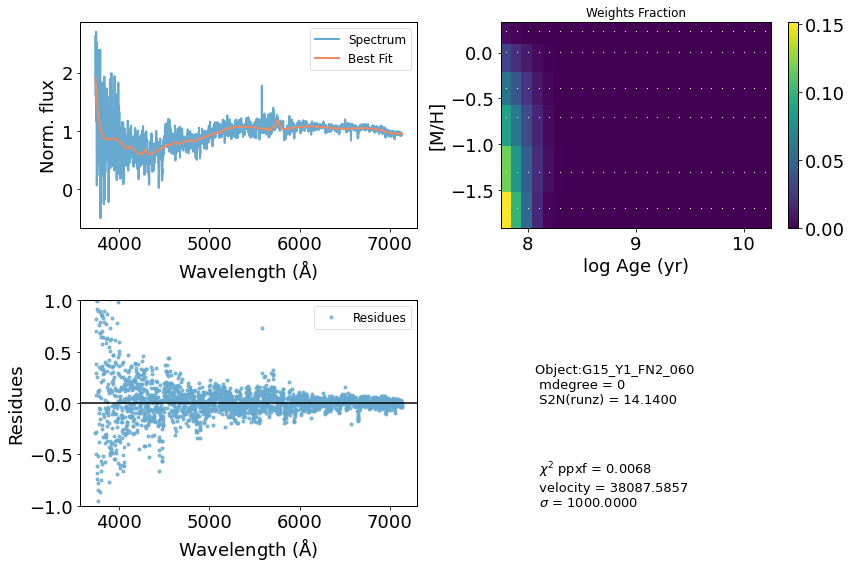

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38762      1000     0.069    -0.040
 comp.  1:     37057       153
 comp.  2:     36932       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006876
method = capfit; Jac calls: 6; Func calls: 66; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  27 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5897       3.2   37057   153
Comp:  2       Unknown          0       6.9   36932   180
Comp:  2       Unknown          0       6.8   36932   180
Comp:  2       Unknown          0       3.5   36932   180
Comp:  2       Unknown          0       2.5   36932   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -1.04
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -1.04
M/L_r: 0.1596
Current $\chi^2$: 0.0069
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


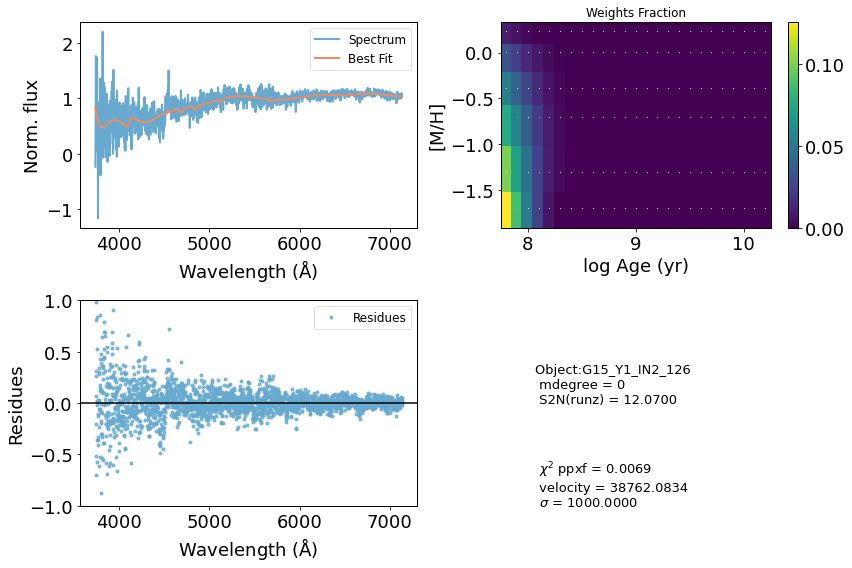

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44519       467    -0.002    -0.001
 comp.  1:     42552       293
 comp.  2:     42499       265
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02229
method = capfit; Jac calls: 4; Func calls: 47; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.608       5.6   42552   293
Comp:  2       Unknown          0       9.9   42499   265
Comp:  2       Unknown    0.06633       9.9   42499   265
Comp:  2       Unknown          0       3.9   42499   265
Comp:  2       Unknown      0.232       2.5   42499   265
---------------------------------------------------------
Weighted <logAge> [yr]: 7.85
Weighted <[M/H]>: -1.55
Weighted <logAge> [yr]: 7.85
Weighted <[M/H]>: -1.55
M/L_r: 0.1605
Current $\chi^2$: 0.0223
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


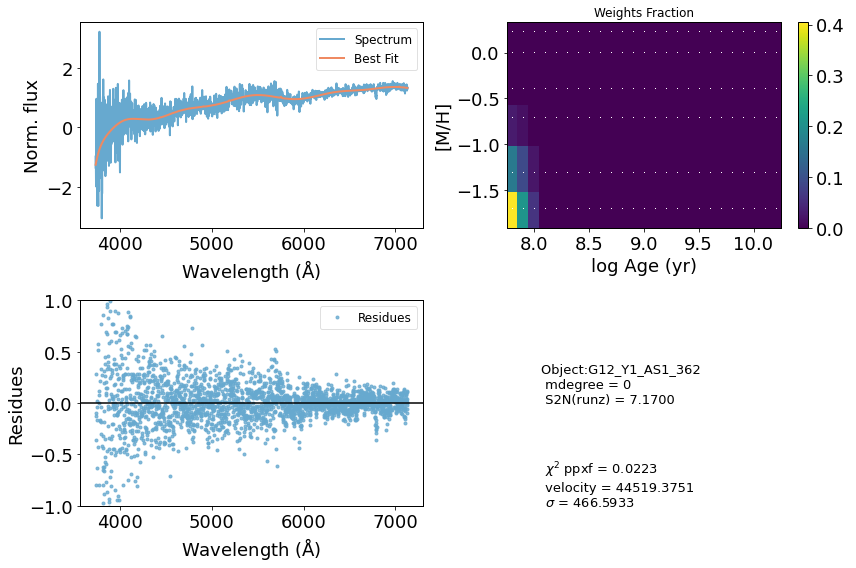

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38309      1000    -0.002    -0.002
 comp.  1:     38291      1000
 comp.  2:     39130       732
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.03599
method = capfit; Jac calls: 12; Func calls: 125; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       5.85       6.7   38291  1000
Comp:  2       Unknown          0        55   39130   732
Comp:  2       Unknown          0        54   39130   732
Comp:  2       Unknown          0       6.1   39130   732
Comp:  2       Unknown      2.093       3.5   39130   732
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.135
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.135
M/L_r: 6.04
Current $\chi^2$: 0.0360
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


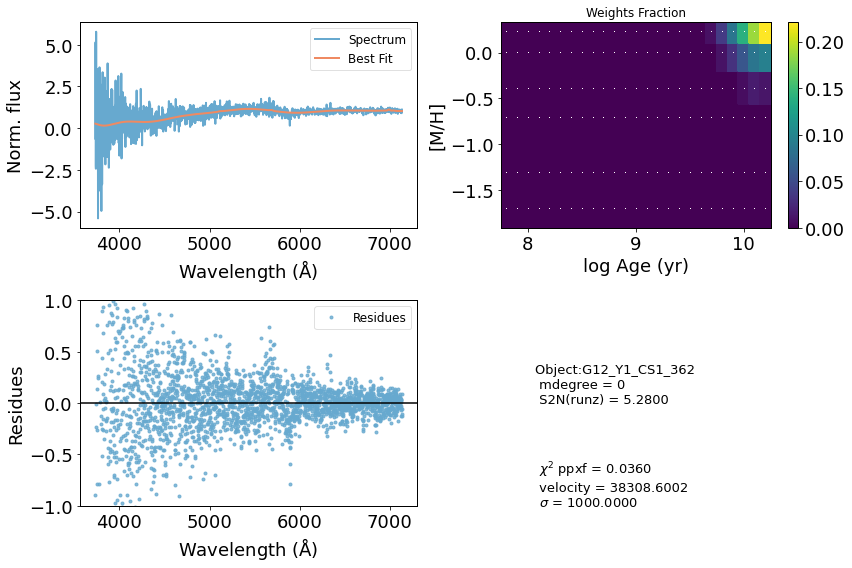

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33833       180     0.000     0.000
 comp.  1:     33833       180
 comp.  2:     33833       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01142
method = capfit; Jac calls: 1; Func calls: 17; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5712       3.1   33833   180
Comp:  2       Unknown          0       7.5   33833   180
Comp:  2       Unknown          0       7.2   33833   180
Comp:  2       Unknown          0       3.6   33833   180
Comp:  2       Unknown          0       2.3   33833   180
Comp:  2       Unknown          0       1.9   33833   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.108
Weighted <logAge> [yr]: 10.1
Weighted <[M/H

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


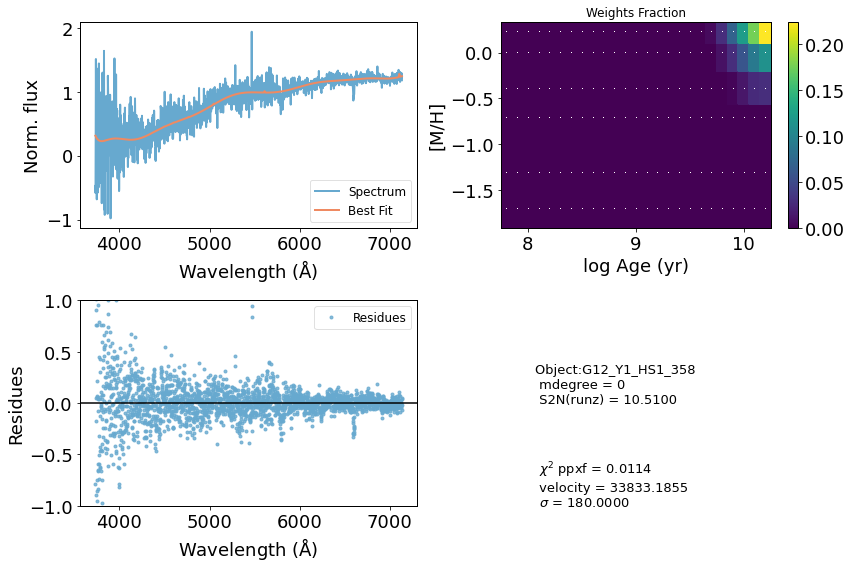

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46899        21    -0.001    -0.002
 comp.  1:     46753      1000
 comp.  2:     46654        92
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005696
method = capfit; Jac calls: 10; Func calls: 107; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  8 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       3.69         7   46753  1000
Comp:  2       Unknown     0.1918       4.1   46654    92
Comp:  2       Unknown     0.0251       4.1   46654    92
Comp:  2       Unknown          0         2   46654    92
Comp:  2       Unknown    0.03979       1.3   46654    92
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.19
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.19
M/L_r: 0.1568
Current $\chi^2$: 0.0057
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


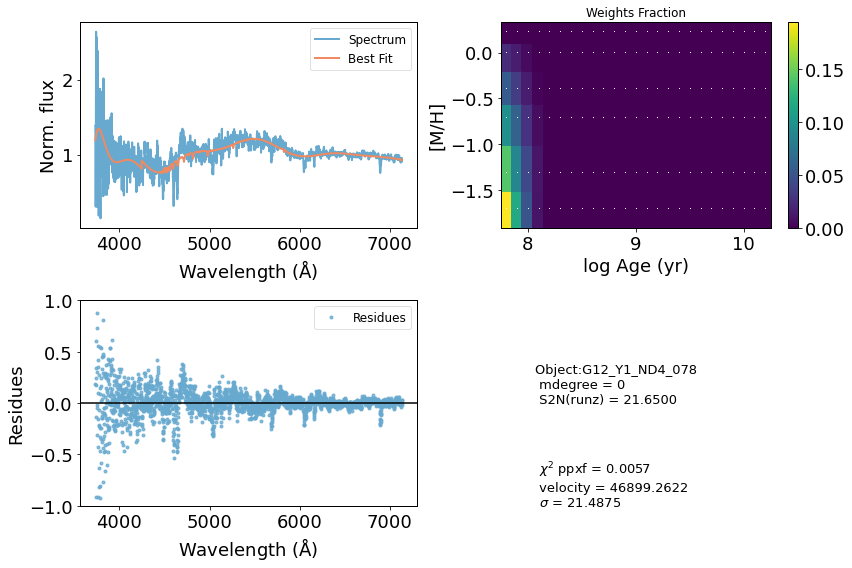

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     57178       607    -0.003     0.000
 comp.  1:     57333      1000
 comp.  2:     57287       357
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02374
method = capfit; Jac calls: 9; Func calls: 97; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  23 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown         14       9.7   57333  1000
Comp:  2       Unknown      1.985        17   57287   357
Comp:  2       Unknown          0        17   57287   357
Comp:  2       Unknown     0.8387         3   57287   357
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.25
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.25
M/L_r: 1.216
Current $\chi^2$: 0.0237
Elapsed time in PPXF: 0.83 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


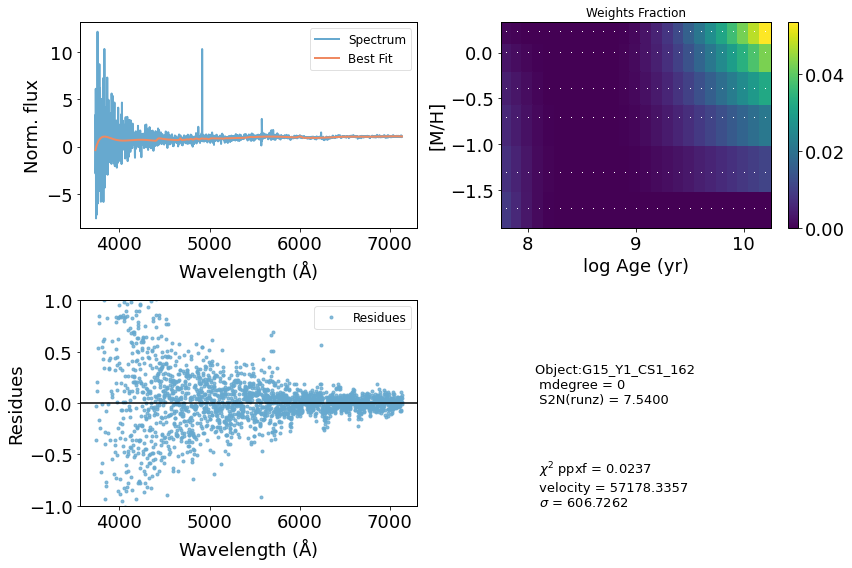

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40904         1     0.000     0.001
 comp.  1:     40205       949
 comp.  2:     38785      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008552
method = capfit; Jac calls: 12; Func calls: 126; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.785       7.4   40205   949
Comp:  2       Unknown          0        69   38785  1000
Comp:  2       Unknown          0        68   38785  1000
Comp:  2       Unknown      1.057       7.6   38785  1000
Comp:  2       Unknown      2.574       4.4   38785  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.37
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.37
M/L_r: 0.1581
Current $\chi^2$: 0.0086
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


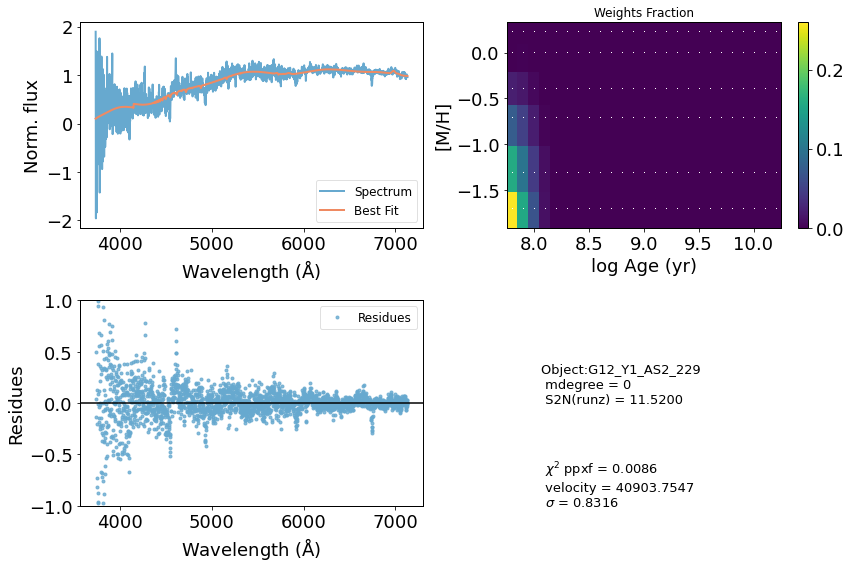

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     70282        47    -0.002     0.007
 comp.  1:     71282       178
 comp.  2:     71515       292
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008936
method = capfit; Jac calls: 13; Func calls: 135; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.8   71282   178
Comp:  2       Unknown          0       7.5   71515   292
Comp:  2       Unknown          0       7.4   71515   292
Comp:  2       Unknown      1.373       3.5   71515   292
---------------------------------------------------------
Weighted <logAge> [yr]: 8.06
Weighted <[M/H]>: 0.0064
Weighted <logAge> [yr]: 8.06
Weighted <[M/H]>: 0.0064
M/L_r: 0.2155
Current $\chi^2$: 0.0089
Elapsed time in PPXF: 1.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


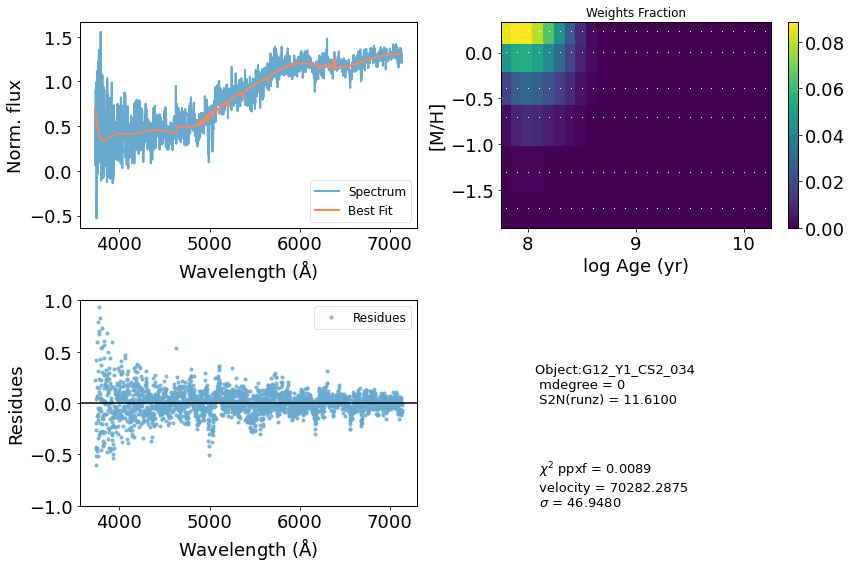

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40035      1000     0.001    -0.009
 comp.  1:     38050       128
 comp.  2:     38164        79
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006287
method = capfit; Jac calls: 7; Func calls: 77; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  12 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7474       3.7   38050   128
Comp:  2       Unknown          0       3.3   38164    79
Comp:  2       Unknown          0       3.3   38164    79
Comp:  2       Unknown          0       2.7   38164    79
Comp:  2       Unknown     0.2507       1.9   38164    79
---------------------------------------------------------
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.0819
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.0819
M/L_r: 0.1793
Current $\chi^2$: 0.0063
Ela

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


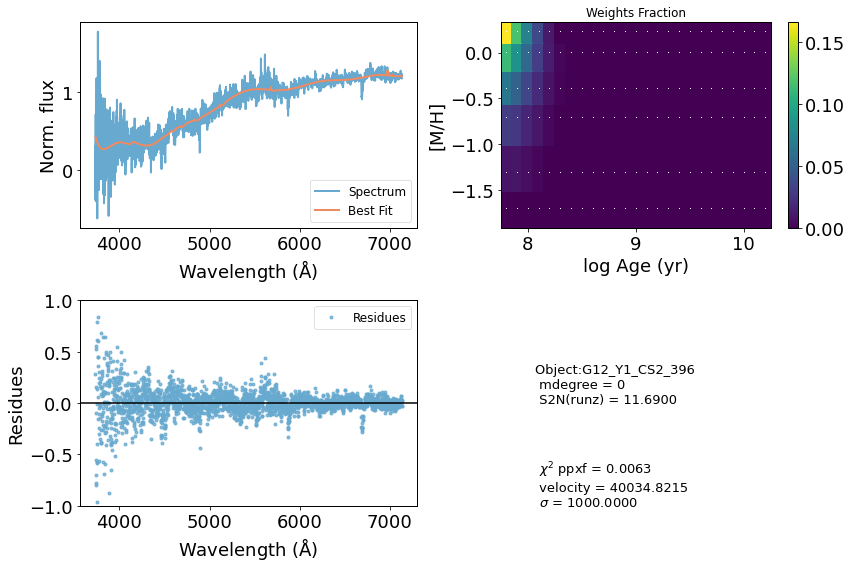

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48117       180     0.000     0.000
 comp.  1:     48117       180
 comp.  2:     48117       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01232
method = capfit; Jac calls: 1; Func calls: 17; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  54 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.7   48117   180
Comp:  2       Unknown          0       5.7   48117   180
Comp:  2       Unknown     0.1228       5.6   48117   180
Comp:  2       Unknown          0         3   48117   180
Comp:  2       Unknown          0       2.7   48117   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.197
M/L_r: 3.156
Current $\chi^2$: 0.0123
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


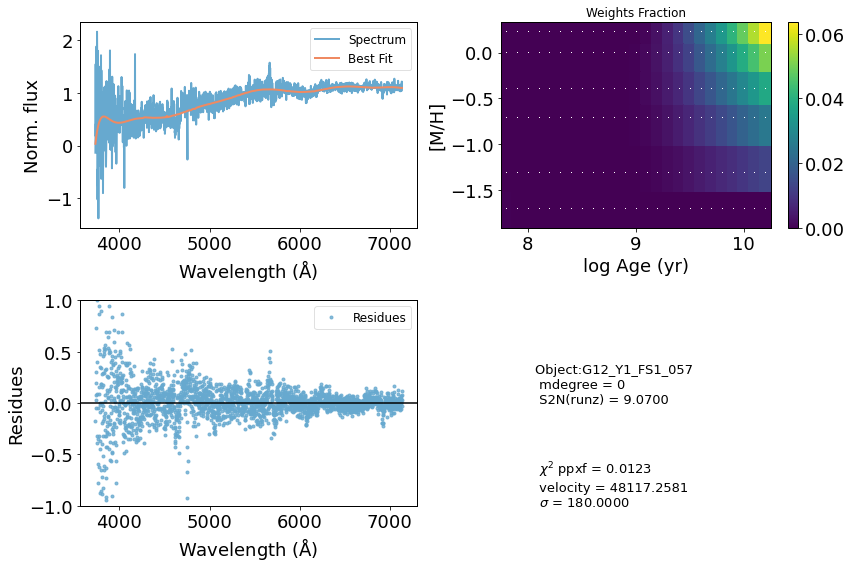

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36929      1000     0.005    -0.005
 comp.  1:     34929       169
 comp.  2:     34927       173
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004975
method = capfit; Jac calls: 3; Func calls: 38; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  26 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5034       3.1   34929   169
Comp:  2       Unknown          0       6.8   34927   173
Comp:  2       Unknown          0       6.9   34927   173
Comp:  2       Unknown          0       3.4   34927   173
Comp:  2       Unknown    0.08373       2.1   34927   173
Comp:  2       Unknown     0.2112         2   34927   173
---------------------------------------------------------
Weighted <logAge> [yr]: 7.91
Weighted <[M/H]>: -0.818
Weighted <logAge> [yr]: 7.91
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


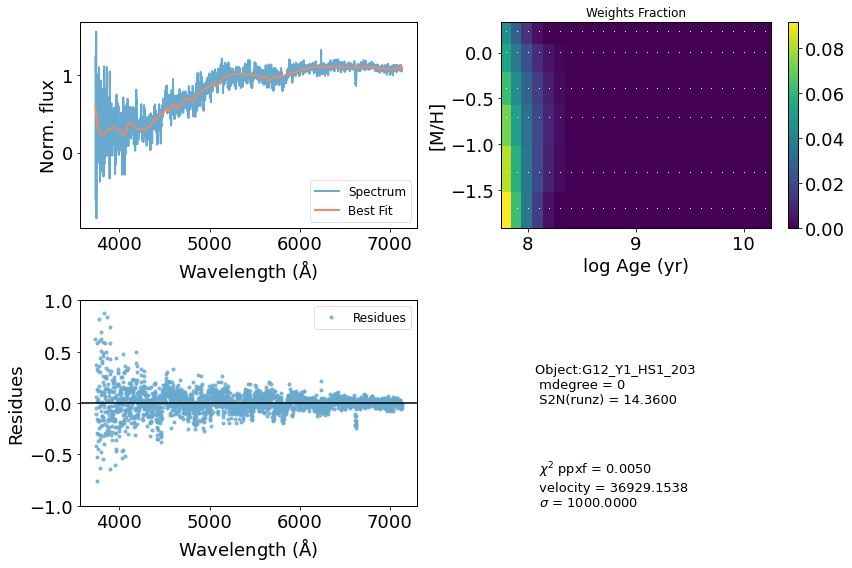

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50981        62    -0.001    -0.001
 comp.  1:     51313       198
 comp.  2:     51223       340
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009377
method = capfit; Jac calls: 6; Func calls: 68; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  30 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.09035       3.7   51313   198
Comp:  2       Unknown     0.1127        12   51223   340
Comp:  2       Unknown     0.1545        12   51223   340
Comp:  2       Unknown      1.273       3.5   51223   340
---------------------------------------------------------
Weighted <logAge> [yr]: 9.52
Weighted <[M/H]>: -0.36
Weighted <logAge> [yr]: 9.52
Weighted <[M/H]>: -0.36
M/L_r: 0.589
Current $\chi^2$: 0.0094
Elapsed time in PPXF: 0.57 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


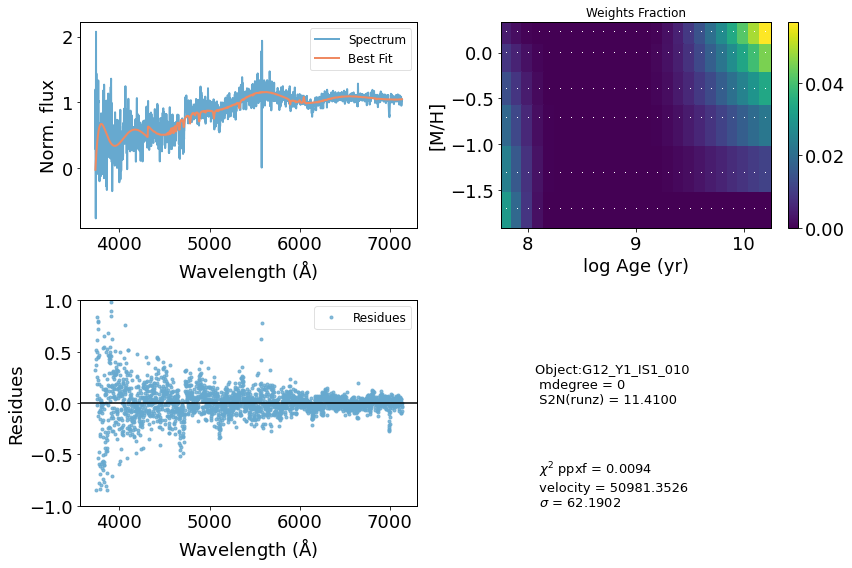

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38673       180     0.000     0.000
 comp.  1:     38673       180
 comp.  2:     38673       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006894
method = capfit; Jac calls: 1; Func calls: 16; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown   0.007156       4.3   38673   180
Comp:  2       Unknown          0       5.6   38673   180
Comp:  2       Unknown          0       5.5   38673   180
Comp:  2       Unknown    0.03591       3.7   38673   180
Comp:  2       Unknown          0       2.9   38673   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0069
Elapsed time in P

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide


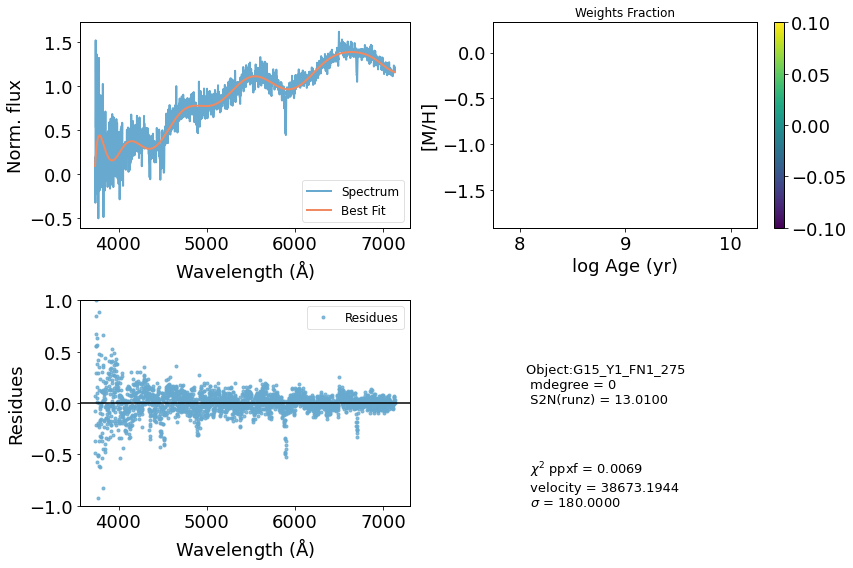

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     76319       128     0.000    -0.016
 comp.  1:     77242       737
 comp.  2:     77178       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01037
method = capfit; Jac calls: 10; Func calls: 107; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown        4.6       9.1   77242   737
Comp:  2       Unknown     0.0268       4.3   77178   180
Comp:  2       Unknown          0       4.3   77178   180
Comp:  2       Unknown          0       2.5   77178   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.02
Weighted <[M/H]>: 0.00285
Weighted <logAge> [yr]: 8.02
Weighted <[M/H]>: 0.00285
M/L_r: 0.2052
Current $\chi^2$: 0.0104
Elapsed time in PPXF: 0.82 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


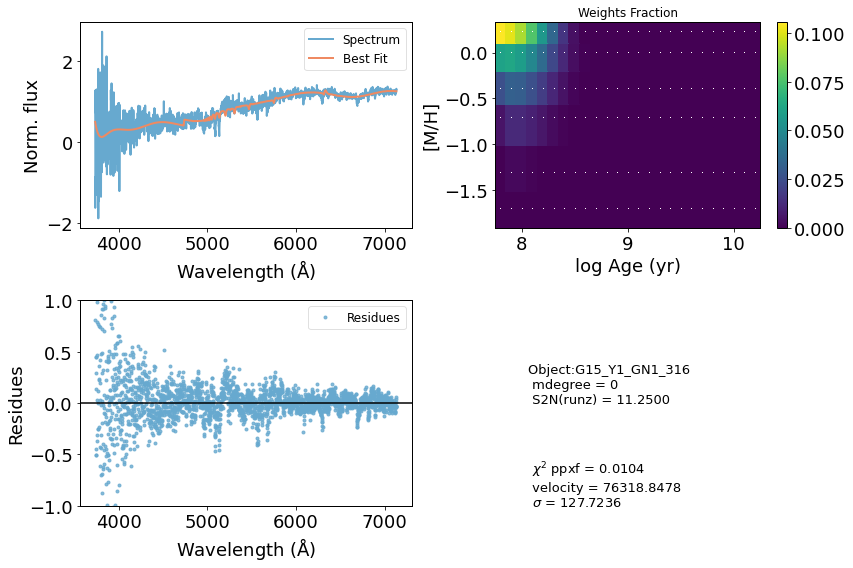

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51524       180     0.000     0.000
 comp.  1:     51524       180
 comp.  2:     51524       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0103
method = capfit; Jac calls: 1; Func calls: 19; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.315       4.6   51524   180
Comp:  2       Unknown          0       5.1   51524   180
Comp:  2       Unknown          0       5.4   51524   180
Comp:  2       Unknown     0.4261         3   51524   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.35
Weighted <logAge> [yr]: 7.86
Weighted <[M/H]>: -1.35
M/L_r: 0.1576
Current $\chi^2$: 0.0103
Elapsed time in PPXF: 0.15 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


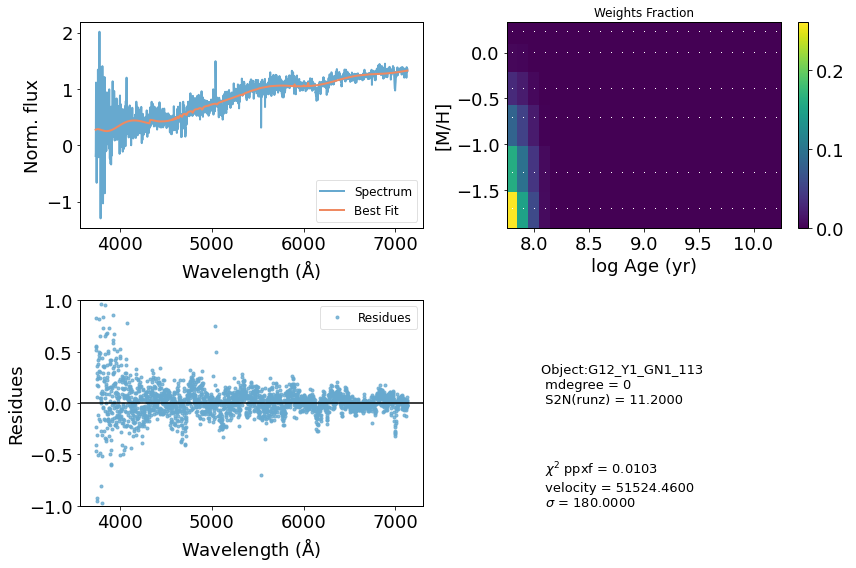

--------------------------------------------------
CPU process time: 26572126.00 [min]
--------------------------------------------------


In [21]:
start_time_all = time.time()
ids_vel = ['CATAID']
for each_sed in range(len(seds_list)):
# for each_sed in range(2):
    
    # settings for the progress bar widget above: does not influence in ppxf -------------------------------------
    bar.value += each_sed/2.                                          # signal to increment the progress bar
    if each_sed<len(seds_list): 
        bar.bar_style = ""                                            # blue when in progress
    else: 
        bar.bar_style = "success"                                     # green when it finishes        
        
    # flux -------------------------------------------------------------------------------------------------------
    sed_file  = os.path.join(seds_path, seds_list[each_sed])          # link between path and files
    sed_flux  = pf.getdata(sed_file)[0]                               # opening each spectra
    sed_err   = pf.getdata(sed_file)[1]                               # opening each spectra error
    
    # wavelength -------------------------------------------------------------------------------------------------
    sed_header = pf.open(sed_file)[0].header
    sed_wl_ini = sed_header['WMIN'] 
    sed_wl_stp = sed_header['CD1_1']
    sed_wl     = np.arange(sed_flux.size)*(sed_wl_stp)+sed_wl_ini     # sed wavelength    
#     plot_sed(sed_wl, sed_flux, sed_err)
    
    # cleaning flux and wavelength trash -------------------------------------------------------------------------
    idx_clean       = np.where((np.logical_not(np.isnan(sed_flux)))*(sed_err>0)) # indices where NAN is present
    flux_temp       = sed_flux[idx_clean]                                   # removing NAN values from spectra
    flux_temp_err   = sed_err[idx_clean]
    wavelength_temp = sed_wl[idx_clean]    
#     plot_sed(wavelength_temp, flux_temp, flux_temp_err)
    
    # limiting the spectrum regarding the wavelength range of the library ----------------------------------------
    wl_lib_idx = (wavelength_temp>wl_min) & (wavelength_temp<wl_max)       # MILES wavelength range
    flux       = flux_temp[wl_lib_idx]
    flux_err   = flux_temp_err[wl_lib_idx]
    wavelength = wavelength_temp[wl_lib_idx]    
#     plot_sed(wavelength, flux, flux_err)    
    
    # other important parameters ---------------------------------------------------------------------------------
    redshift  = sed_header['Z']
    cataid    = sed_header['CATAID']
#     fwhm_gama = wavelength*gama_resol
    fwhm_gama = 2.
    
    # ppxf -------------------------------------------------------------------------------------------------------
    vel_scale          = light_speed*np.log(wavelength[1]/wavelength[0])      # velocity scale - 
                                                                              # Eq.8 Capellari 2017
    
    ### setup templates ------------------------------------------------------------------------------------------
    #### stellar pops --------------------------------------------------------------------------------------------
    miles              = lib.miles(miles_lib, vel_scale, fwhm_gama)
    stellar_templates  = miles.templates.reshape(miles.templates.shape[0], -1)
    reg_dim            = miles.templates.shape[1:]
    dv                 = light_speed*(miles.log_lam_temp[0] - np.log(wavelength[0])) # eq.(8) of Cappellari (2017)
    vel                = light_speed*np.log(1 + redshift)                            # eq.(8) of Cappellari (2017)
    start              = [vel, 180.]
    
    #### gas templates -------------------------------------------------------------------------------------------
    wl_range_galaxy = np.array([np.min(wavelength), np.max(wavelength)])/(1 + redshift)
    gas_templates, gas_names, line_wave = util.emission_lines(miles.log_lam_temp, wl_range_galaxy, fwhm_gama, 
                                                              tie_balmer=tied_balmer, 
                                                              limit_doublets=limit_doublets)
    number_of_templates = stellar_templates.shape[1]
    number_of_forbidden = np.sum(["[" in a for a in gas_names])                 # forbidden lines contain "[*]"
    number_of_balmer    = len(gas_names) - number_of_forbidden
        
    component = (stellar_comp_w*number_of_templates)+(balmer_comp_w*number_of_balmer)+(forbid_comp_w
                                                                                       *number_of_forbidden)
        
    gas_component = np.array(component) > 0       # gas_component=True for gas templates
    start3        = [start, start, start]         # adopt the same starting value for the 3 components
    gas_reddening = 0 if tied_balmer else None  # If the Balmer lines are tied one should allow for gas reddening.
    
    
    #### all templates -------------------------------------------------------------------------------------------
    all_templates = np.column_stack([stellar_templates, gas_templates])
    
    ### rebinning the spectrum so it is at the same size as the templates (or smaller) ---------------------------
    new_shape          = stellar_templates[:,0].shape
    rebinning_function = sci.interp1d(wavelength, flux)   # for the flux
    wavelength_rebin   = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_rebin         = rebinning_function(wavelength_rebin)
    
    ### rebinning the error --------------------------------------------------------------------------------------
    rebin_func_error   = sci.interp1d(wavelength, flux_err)
    wl_rebin_error     = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_err_rebin     = rebin_func_error(wavelength_rebin)
    
    ### final galaxy spectrum and its error to be analysed -------------------------------------------------------
    galaxy             = flux_rebin/np.median(flux_rebin)           # Normalize spectrum to avoid numerical issues
    noise              = flux_err_rebin/np.median(flux_err_rebin)       # idem
    
#     plot_sed(wavelength_rebin, galaxy, noise)    
    
    ### SED FITTING WITH PPXF ------------------------------------------------------------------------------------
    start_time = time.clock()
    sed_fit = ppxf(templates=all_templates, galaxy=galaxy, noise=noise, velscale=vel_scale, start=start3, 
                   plot=False, lam=wavelength_rebin, moments=moments, degree=degree, mdegree=mdegree, 
                   reg_dim=reg_dim, regul=1./regul_err, vsyst=dv, clean=False, component=component, 
                   gas_component=gas_component, gas_reddening=gas_reddening)
    end_time = time.clock()
    
    ## output parameters -- most of them will become a dataframe at the end of the script  
    residues = (galaxy-sed_fit.bestfit)
    
    stellar_weights = sed_fit.weights[~gas_component]                       # Exclude weights of the gas templates
    stellar_weights = stellar_weights.reshape(reg_dim)/stellar_weights.sum()  # Normalized
    
    velocity = sed_fit.sol[0][0]
    sigma    = sed_fit.sol[0][1]
    
    mean_age.append(miles.mean_age_metal(stellar_weights)[0])
    mean_metal.append(miles.mean_age_metal(stellar_weights)[1])
    mass2light.append(miles.mass_to_light(stellar_weights, band="r"))
    ids.append(cataid)
    redshifts.append(redshift)
    
    ###################### SAVING DATAFRAME WITH FIT OUTPUTS ###################
    outputs_line = [cataid, sigma, sed_fit.chi2, velocity, mean_age, mean_metal, mass2light, sed_header['SN']]
    if each_sed==0:
        outputs_physical = np.array(outputs_line)
    else:
        outputs_physical = np.vstack((outputs_physical, np.array(outputs_line)))
    #############################################################################
    
       
    print(r"Current $\chi^2$: %.4f" % (sed_fit.chi2))
    print('Elapsed time in PPXF: %.2f [min]' % ((end_time-start_time)/60))
    
    ### Saving stellar weights -----------------------------------------------------------------------------------
    stellar_weights_df = pd.DataFrame(stellar_weights)
    stellar_weights_df.to_csv(os.path.join(results_path, 'SWs'+'CATAID'+str(cataid)+'_d'+str(degree)+'_m'
                                           +str(mdegree)+'.csv'), index=False)
    
    
    ### Saving fit results ---------------------------------------------------------------------------------------
    output = {}
    output['wavelength'] = wavelength_rebin
    output['flux']       = sed_fit.galaxy
    output['best_fit']   = sed_fit.bestfit
    
    output_df = pd.DataFrame(output)
    output_df.to_csv(os.path.join(results_path, 'fit_'+str(cataid)+'_d'+ str(degree)+'_'+str(mdegree)+
                                  '_'+str(wl_min) +'.csv'), index=False)
    vel_disp.append(sigma)
    ids_vel.append(cataid)

    ### Saving plots ---------------------------------------------------------------------------------------------
    plt.subplots(figsize=(12,8))
    
    #### plot01 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,1)
    plt.plot(wavelength_rebin[:-200], sed_fit.galaxy[:-200], '-', color=palette[-1], linewidth=lw, 
             label="Spectrum")
    plt.plot(wavelength_rebin[:-200], sed_fit.bestfit[:-200], '-', color=palette[0], linewidth=lw, 
             label="Best Fit")
#     plt.title("Object %s: S/N=%.4f" % (cataid, s2n_top10[each_sed]))
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)")
    plt.ylabel("Norm. flux")
    
    #### plot02 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,2)
    miles.plot(stellar_weights)
    
    #### plot03 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,3)
    plt.plot(wavelength_rebin[:-200], residues[:-200], '.', color=palette[-1], linewidth=lw, label="Residues", 
             alpha=transparency)
    plt.axhline(y=0, c='black')
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)")
    plt.ylabel("Residues")
    plt.ylim([-1,1])
    
    #### plot04 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,4)
    plt.text(0.1, 0.5, "Object:{:s} \n mdegree = {:d} \n S2N(runz) = {:.4f}".format(sed_header['SPECID'], mdegree,
                    sed_header['SN']), fontsize=13)
             
             
    plt.text(0.1, 0.0, " \n $\chi^2$ ppxf = {:.4f} \n velocity = {:.4f} \n $\sigma$ = {:.4f}".
             format(sed_fit.chi2, velocity, sigma), fontsize=13)
    plt.axis('off') 
    figname = 'gal_'+str(cataid)+'_d'+str(degree)+'_m'+str(mdegree)+'_'+str(wl_min)
    plt.tight_layout()
    plt.savefig(os.path.join(results_path, figname +'.png'))
    plt.savefig(os.path.join(results_path, figname +'.pdf'))
    plt.show()

outputs_physical = pd.DataFrame(outputs_physical)
outputs_physical.columns = outputs_physical_header

outputs_physical.to_csv(os.path.join(results_path, 'parameters_d'+str(degree)+ '_m'+str(mdegree)+'.csv'), 
                                     index=False)
end_time_all = time.time()
print_time(start_time_all, end_time_all)